# This analysis is continued from nb_TE_blueprint_HSPC_Apr23.ipynb

# import packages

In [ ]:
library(DESeq2)
library(data.table)
library(dplyr)
library(ChIPseeker)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(EnsDb.Hsapiens.v75)
library(clusterProfiler)
library(AnnotationDbi)
library(org.Hs.eg.db)
library(ggplot2)
library(gridExtra)
library(RColorBrewer)
library(IRdisplay)
library(GGally)
library(ChIPpeakAnno)
library(universalmotif)
library(IRdisplay)
library(ggpubr)
library(DiffBind)
library(kableExtra)
library(tidyverse)
library(ggraph)
library(tidygraph)
library(readxl)
library(corrplot)
library(ggrepel)
library(msigdbr)
library(fgsea)
library(ggvenn)
library(ComplexHeatmap)
library(ggVennDiagram)
library(venneuler)
library(sva)
library(DT)
library(tools)
library(tidyverse)
library(maSigPro)
library(RSQLite)

library(edgeR)

txdb = TxDb.Hsapiens.UCSC.hg38.knownGene

source('~/script/utils.r')
setwd('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/')
base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/' 

cell_types = c('HSC', 'MPP', 'CMP', 'GMP', 'MEP', 'CLP', 'EB', 'MK')

sample_names = c('HSC1', 'HSC2', 'HSC3', 'MPP1', 'MPP2', 'MPP3', 'CMP1', 'CMP2', 
                 'CMP3', 'GMP1', 'GMP2', 'GMP3', 'MEP1', 'MEP2', 'MEP3', 'MEP4', 'CLP1', 'CLP2', 'CLP3', 'EB1', 
                 'EB2', 'EB3', 'MK1', 'MK2', 'MK3')
sample_names_n24 = c('HSC1', 'HSC2', 'HSC3', 'MPP1', 'MPP2', 'MPP3', 'CMP1', 'CMP2', 
                 'CMP3', 'GMP1', 'GMP2', 'GMP3', 'MEP1', 'MEP2', 'MEP3', 'MEP4', 'CLP1', 'CLP3', 'EB1', 
                 'EB2', 'EB3', 'MK1', 'MK2', 'MK3')


# import the data for part re-run this notebook

In [7]:
dsn_all_df = readRDS('data/dsn_all_df.rds')

dsn_all = as.data.table(dsn_all_df, keep.rownames = T)


In [8]:
mtx_all_df = readRDS('data/mtx_all_df.rds')
dsn_all_df = readRDS('data/dsn_all_df.rds')

dsn_all = as.data.table(dsn_all_df, keep.rownames = T)

dge_all      = readRDS('data/dge_all_may1.rds')
fit_all      = readRDS('data/fit_all_may1.rds')
logcpm_all_t = readRDS('data/logcpm_all_t_may1.rds') 
logcpm_all   = readRDS('data/logcpm_all_may1.rds') 

dge_coding      = readRDS('data/dge_coding_may1.rds') 
fit_coding      = readRDS('data/fit_coding_may1.rds') 
deg_coding_dt   = readRDS('data/fit_coding_may1.rds') 
logcpm_coding_t = readRDS('data/logcpm_coding_t_may1.rds') 
logcpm_coding   = readRDS('data/logcpm_coding_may1.rds') 


dge_te      = readRDS('data/dge_te_may1.rds')
fit_te      = readRDS('data/fit_te_may1.rds')
deg_te_dt   = readRDS('data/fit_te_may1.rds')
logcpm_te_t = readRDS('data/logcpm_te_t_may1.rds')
logcpm_te   = readRDS('data/logcpm_te_may1.rds')

coding_genes = read.table('coding_gene_list', header = F)$V1
te_genes = read.table('te_gene_list', header = F)$V1

mtx_coding_df = mtx_all_df[coding_genes, ]
mtx_te_df = mtx_all_df[!rownames(mtx_all_df) %in% coding_genes, ]

te_dt = readRDS('data/te_dt_may08.rds')

dsn6 = fread('data/organized_sample_table.xls')

telocal_sel_seqino_ann = fread('data/telocal_sel_seqino_ann.tsv')
telocal_sel = fread('data/telocal_sel_seqino.tsv')

#telocal_sel = (telocal_sel_seqino, file = 'data/telocal_sel_may29.xls', sep = '\t')

telocal_sel = fread(file = 'data/telocal_sel.tsv')


In [9]:
logcpm_telocal_mep = readRDS(file = 'data/logcpm_telocal_mep.rds')
logcpm_telocal_cmp = readRDS(file = 'data/logcpm_telocal_cmp.rds')


In [11]:
deg_MEPCMP = readRDS(file = 'data/deg_MEPCMP_Nov1.rds') 


In [10]:
deg_telocal_MEPCMP = fread(file = 'data/deg_telocal_MEPCMP_15Jul.tsv')


In [7]:
head(deg_telocal_MEPCMP)

.id,rn,logFC,logCPM,PValue,FDR,batch,target,class_id,family_id,gene_id,tx_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
deg_telocal_MEP_EB,MSTD_dup4711:MSTD:ERVL-MaLR:LTR,-15.14818,10.847784,2.234428e-10,6.451911e-06,MEP,EB,LTR,ERVL-MaLR,MSTD,MSTD_dup4711
deg_telocal_MEP_EB,L1ME3G_dup281:L1ME3G:L1:LINE,-13.22592,8.928775,2.035238e-08,1.122423e-04,MEP,EB,LINE,L1,L1ME3G,L1ME3G_dup281
deg_telocal_MEP_EB,L1MC5a_dup9954:L1MC5a:L1:LINE,-13.30574,9.008395,2.299462e-08,1.122423e-04,MEP,EB,LINE,L1,L1MC5a,L1MC5a_dup9954
deg_telocal_MEP_EB,LTR2_dup109:Harlequin-int:ERV1:LTR,-14.01686,9.717875,1.036616e-07,1.122423e-04,MEP,EB,LTR,ERV1,Harlequin-int,LTR2_dup109
deg_telocal_MEP_EB,L1PA10_dup901:L1PA10:L1:LINE,-12.41123,8.117376,1.454230e-07,1.122423e-04,MEP,EB,LINE,L1,L1PA10,L1PA10_dup901
deg_telocal_MEP_EB,L1MA4A_dup1872:L1MA4A:L1:LINE,-11.91200,7.621480,3.271400e-07,1.122423e-04,MEP,EB,LINE,L1,L1MA4A,L1MA4A_dup1872


In [12]:
dsn_all_df_n24 = dsn_all_df[rownames(dsn_all_df) != 'CLP2', , drop = F]

In [13]:
logcpm_telocal = readRDS(file = 'data/logcpm_telocal.rds')
deg_telocal_dt = readRDS(file = 'data/deg_telocal_list_may15.rds')
deg_telocal_dt[, updn := 'up']
deg_telocal_dt[logFC < 0, updn := 'dn']


In [14]:
deg_telocal_dt = readRDS(file = 'data/deg_telocal_list_may15.rds')
deg_telocal_dt[, updn := 'up']
deg_telocal_dt[logFC < 0, updn := 'dn']


In [15]:
telocal_sel_list_1 = lapply(cell_types, function(ctype){
    deg_telocal_dt[.id == ctype, ] %>% group_by(updn) %>% slice_min(PValue, n = 20)
})
telocal_sel_list_2 = deg_telocal_dt[FDR < 0.1, ]
telocal_sel = rbindlist(c(telocal_sel_list_1, list(telocal_sel_list_2)))
telocal_sel[, tag := paste0(.id, '_', rn)]
telocal_sel = telocal_sel[!duplicated(tag), ]
head(telocal_sel)
dim(telocal_sel)

.id,rn,logFC,logCPM,PValue,FDR,class_id,family_id,gene_id,tx_id,updn,tag
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
HSC,L1MD_dup2024:L1MD:L1:LINE,-5.351829,10.686590,0.006267821,1,LINE,L1,L1MD,L1MD_dup2024,dn,HSC_L1MD_dup2024:L1MD:L1:LINE
HSC,AluJr_dup6543:AluJr:Alu:SINE,-6.687467,9.314801,0.007097942,1,SINE,Alu,AluJr,AluJr_dup6543,dn,HSC_AluJr_dup6543:AluJr:Alu:SINE
HSC,AluJb_dup31324:AluJb:Alu:SINE,-3.793383,9.220092,0.012262250,1,SINE,Alu,AluJb,AluJb_dup31324,dn,HSC_AluJb_dup31324:AluJb:Alu:SINE
HSC,AluJb_dup176723:AluJb:Alu:SINE,-3.729088,7.535264,0.012912024,1,SINE,Alu,AluJb,AluJb_dup176723,dn,HSC_AluJb_dup176723:AluJb:Alu:SINE
HSC,AluJb_dup138484:AluJb:Alu:SINE,-3.995137,9.181538,0.014095934,1,SINE,Alu,AluJb,AluJb_dup138484,dn,HSC_AluJb_dup138484:AluJb:Alu:SINE
HSC,MER20_dup15289:MER20:hAT-Charlie:DNA,-5.594704,6.415809,0.015551106,1,DNA,hAT-Charlie,MER20,MER20_dup15289,dn,HSC_MER20_dup15289:MER20:hAT-Charlie:DNA


[1] 900  12

In [16]:
fwrite(telocal_sel, file = 'data/telocal_sel.tsv', sep = '\t')

In [17]:
table(telocal_sel$.id)


CLP CMP  EB GMP HSC MEP  MK MPP 
 40  40  41  40  40 613  46  40 

In [18]:
telocal_sel = fread(file = 'data/telocal_sel.tsv', sep = '\t')


In [19]:
# 3 batch 
#  nb_TE_blueprint_HSPC_2024Jun14.ipynb

batch3s_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/TE/'

count_mtx_batch = read.table(file = paste0(batch3s_dir, 'count_mtx_3batch_batchcorrect.tsv'), sep = '\t')
logcpm_3batch = read.table(file = paste0(batch3s_dir, 'logcpm_3batch_t_batchcorrect_normalized.tsv'), sep = '\t')
logcpm_3batch_t = fread(file = paste0(batch3s_dir, 'logcpm_3batch_t_batchcorrect_normalized_t.tsv'), sep = '\t')
dsn_3batch_df = read.table(file = paste0(batch3s_dir, 'dsn_3batch_df.tsv'), sep = '\t')
cell_types_3batch = c('HSC', 'MPP', 'CMP', 'GMP', 'MEP', 'CLP', 'EB', 'MK', 'B', 'CD4T', 'CD8T', 'NK', 'Ery', 'Mono', 'Blast', 'pHSC', 'LSC', 
                      'CD2N_pDC', 'CD2P_pDC', 'cDC1', 'cDC2', 'Macrophage', 'Monocyte')
dsn_3batch_df$cell_type  = factor(dsn_3batch_df$cell_type, levels = cell_types_3batch)


# TEcount summary

In [11]:
tecount_sel1 = deg_te_dt %>% group_by(.id) %>% slice_min(PValue, n = 20)
tecount_sel2 = deg_te_dt[FDR < 0.05 & (logFC) > 1, ]
tecount_sel = rbind(tecount_sel1, tecount_sel2)


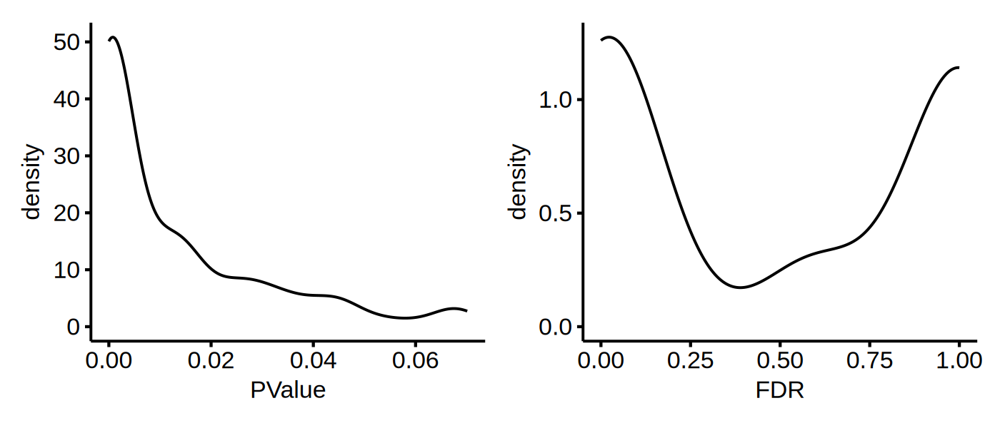

In [17]:
options(repr.plot.width = 7, repr.plot.height = 3, repr.plot.res = 200)
ggdensity(tecount_sel, x = 'PValue') | ggdensity(tecount_sel, x = 'FDR') 


In [74]:
head(deg_te_dt) 

.id,rn,logFC,logCPM,PValue,FDR,sel,idd,class_id,family_id,gene_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<int>,<chr>,<chr>,<chr>
HSC,FLAM_C:Alu:SINE,-0.9128241,12.467095,0.003354908,0.5944787,NA,1,SINE,Alu,FLAM_C
HSC,UCON44:TcMar-Tigger:DNA,-1.6884823,7.812925,0.004110851,0.5944787,NA,2,DNA,TcMar-Tigger,UCON44
HSC,L1ME3G:L1:LINE,-0.5030516,12.483404,0.005752892,0.5944787,NA,3,LINE,L1,L1ME3G
HSC,L1ME4a:L1:LINE,-0.5586001,12.695243,0.007049395,0.5944787,NA,4,LINE,L1,L1ME4a
HSC,MER33:hAT-Charlie:DNA,-0.7200624,10.986634,0.008228203,0.5944787,NA,5,DNA,hAT-Charlie,MER33
HSC,ERVL-B4-int:ERVL:LTR,0.6461831,8.966138,0.009950680,0.5944787,NA,6,LTR,ERVL,ERVL-B4-int


# heatmap innate RNA sensor

In [187]:
dsn_n24 = dsn_all_df[rownames(dsn_all_df) != 'CLP2', , drop = F]

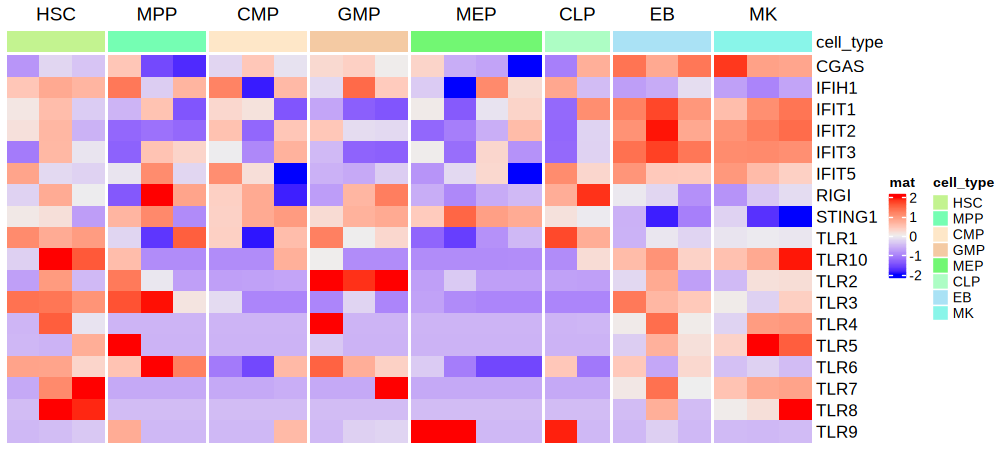

In [200]:
# significant TEs  
options(repr.plot.width = 10, repr.plot.height = 4.5, repr.plot.res = 100)

gene_sel = c(paste0('TLR', 1:13),  'RIGI', 'MDA5', 'LGP2', 'IFIT1', 'IFIT2', 'IFIT3', 'IFIT4', 'IFIT5', 'IFIH1', 'STING1', 'CGAS')
plotdat = logcpm_all[rownames(logcpm_all) %in% gene_sel, rownames(dsn_n24)]

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_n24[, 'cell_type', drop = F])
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F, show_row_dend = F, top_annotation = column_ha, column_split = factor(dsn_n24$cell_type, levels = cell_types))  


In [ ]:
2018: LINE1 function is HSC under irradiation, thrombopoietin protect HSC  1
2022: irradiation resulted in decreased H3K9me3, and LINE1 L1Md up-regulation 2 
2021: chemo-induced TE were regulated by MDA5 enhancing HSC function 3
1.	D, B. et al. Thrombopoietin protects hematopoietic stem cells from retrotransposon-mediated damage by promoting an antiviral response. J. Exp. Med. 215, (2018).
2.	Pelinski, Y. et al. NF-κB signaling controls H3K9me3 levels at intronic LINE-1 and hematopoietic stem cell genes in cis. J. Exp. Med. 219, e20211356 (2022).
3.	Clapes, T. et al. Chemotherapy-induced transposable elements activate MDA5 to enhance haematopoietic regeneration. Nat. Cell Biol. 23, 704–717 (2021).



In [180]:
dim(logcpm_all)

[1] 43658    24

# heatmap TEcount

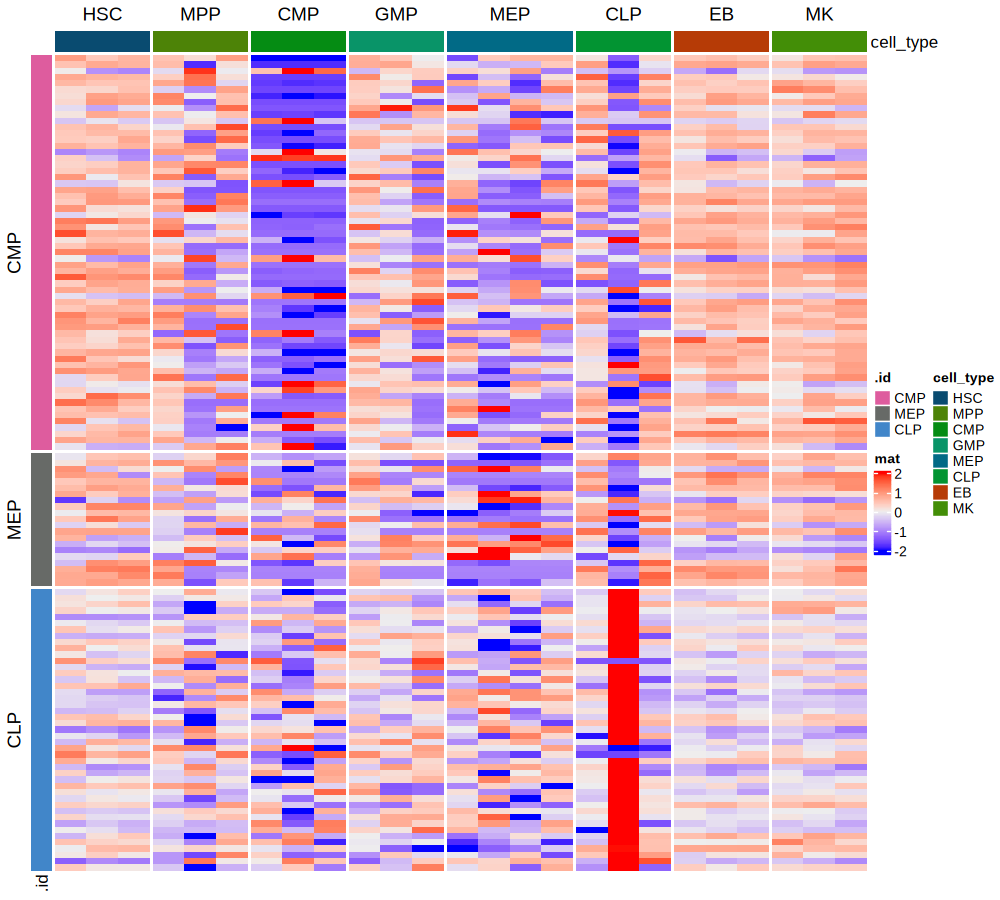

In [22]:
# significant TEs
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_te_dt[abs(logFC) > 1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

In [77]:
table(sign(row_sel$logFC))


 -1   1 
162  52 

In [137]:
tmp

,rn,logFC,logCPM,PValue,FDR
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,HERV9NC-int:ERV1:LTR,0.8306772,7.929363,1.248837e-07,4.466172e-06
2,SVA_D:SVA:Retroposon,0.7734136,9.538207,7.592280e-07,1.919258e-05
3,LTR37-int:ERV1:LTR,-0.7051777,7.818902,2.308142e-05,2.839097e-04
4,LTR4:ERV1:LTR,0.8800282,5.202679,5.166159e-03,2.064564e-02
5,THE1D-int:ERVL-MaLR:LTR,0.8314371,4.518243,7.389280e-03,2.713563e-02
6,MER92C:ERV1:LTR,1.1409585,4.174714,9.767492e-03,3.413911e-02


In [139]:
head(row_sel)

.id,rn,logFC,logCPM,PValue,FDR,sel,idd,class_id,family_id,gene_id,ctype_gene
<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>
MEP,HERV9NC-int:ERV1:LTR,1.447435,5.995318,2.085416e-04,0.075245493,TRUE,5083,LTR,ERV1,HERV9NC-int,HERV9NC-int:ERV1:LTR
MEP,LTR4:ERV1:LTR,1.429837,5.774637,1.217453e-03,0.084069556,TRUE,5098,LTR,ERV1,LTR4,LTR4:ERV1:LTR
MEP,SVA_D:SVA:Retroposon,1.001267,7.673012,1.332565e-03,0.084069556,TRUE,5099,Retroposon,SVA,SVA_D,SVA_D:SVA:Retroposon
MEP,LTR37-int:ERV1:LTR,-1.363554,8.358197,7.409381e-06,0.009350639,TRUE,5081,LTR,ERV1,LTR37-int,LTR37-int:ERV1:LTR
MEP,MER92C:ERV1:LTR,-5.659641,3.975314,1.776262e-04,0.075245493,TRUE,5082,LTR,ERV1,MER92C,MER92C:ERV1:LTR
MEP,THE1D-int:ERVL-MaLR:LTR,-4.303267,4.314108,1.391084e-03,0.084069556,TRUE,5100,LTR,ERVL-MaLR,THE1D-int,THE1D-int:ERVL-MaLR:LTR


In [ ]:
tmp = read.table('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/DBA/dba_row_sel.tsv')
row_sel = deg_te_dt[rn %in% tmp$rn, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(rn)]
#row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ][.id %in% c('MEP', 'EB', 'MK'), ]
row_sel = row_sel[order(.id, -sign(logFC)), ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 9, repr.plot.height = 4, repr.plot.res = 200)

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id,   row_names_gp = grid::gpar(fontsize = 7), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types)) 

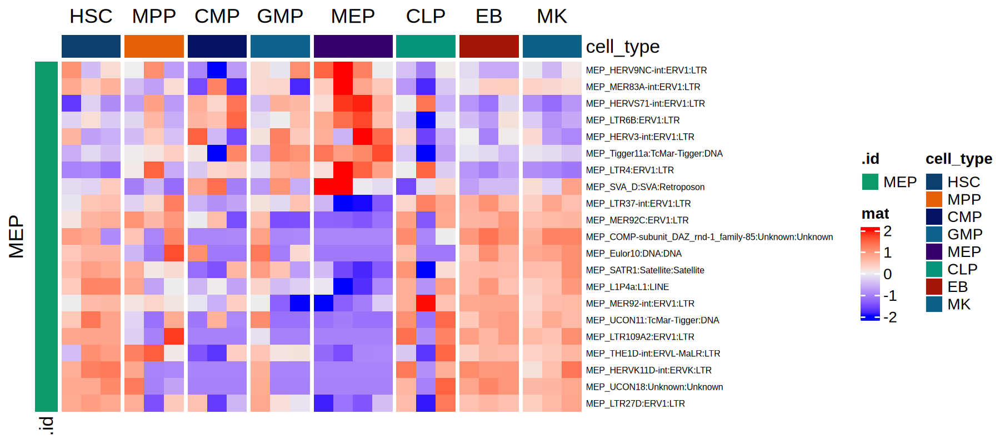

In [140]:
row_sel = deg_te_dt[abs(logFC) > 1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ][.id %in% c('MEP', 'EB', 'MK'), ]
fwrite(row_sel, file = 'row_sel.tsv')
row_sel = row_sel[order(.id, -sign(logFC)), ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

options(repr.plot.width = 9, repr.plot.height = 4, repr.plot.res = 200)

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id,   row_names_gp = grid::gpar(fontsize = 5.5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types)) 

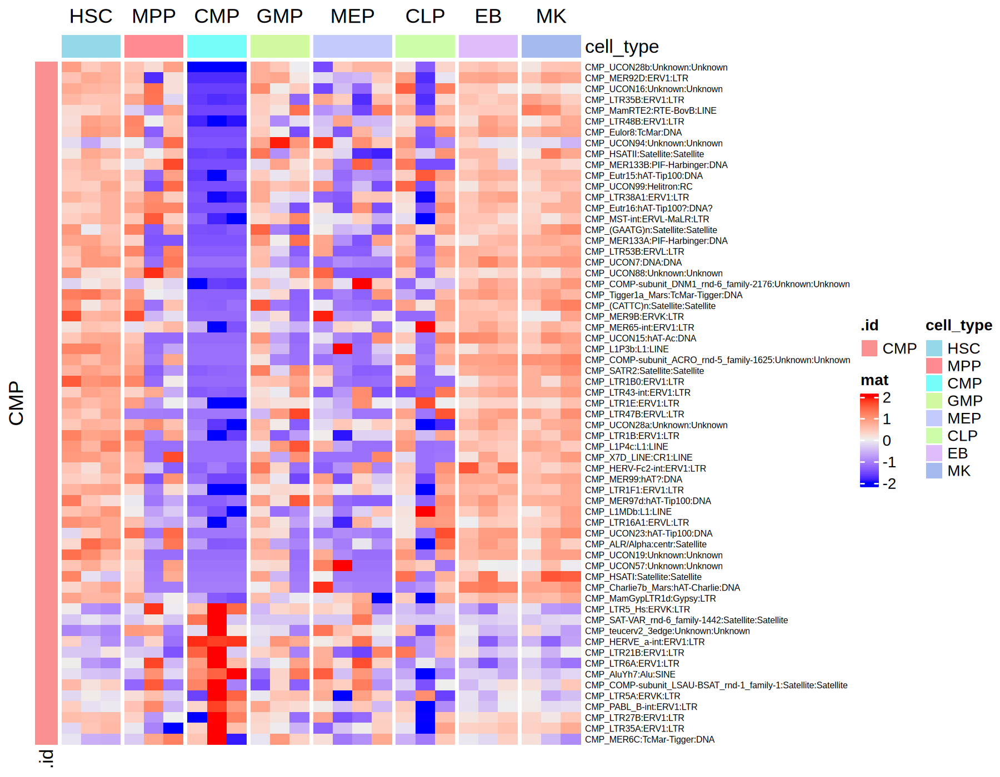

In [132]:
# significant TEs
options(repr.plot.width = 9, repr.plot.height = 7, repr.plot.res = 200)

row_sel = deg_te_dt[abs(logFC) > 1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ][.id == 'CMP', ]
row_sel = row_sel[order(.id, sign(logFC)), ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id,   row_names_gp = grid::gpar(fontsize = 5.5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


In [80]:
nrow( deg_te_dt[.id == 'MK' & logFC > 0 & FDR < 0.1, ] )

[1] 0

In [81]:
mk = deg_te_dt[logFC > 0 & .id == 'MK', ] %>% slice_min(order_by = PValue, n = 20)


In [82]:
head(deg_te_dt)

.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
CMP,UCON28b:Unknown:Unknown,-8.814440,3.694313,5.838190e-14,7.140106e-11
CMP,MER92D:ERV1:LTR,-11.851777,4.025914,1.570117e-09,9.601264e-07
CMP,LTR35B:ERV1:LTR,-8.011572,4.518548,2.525518e-08,1.029569e-05
CMP,LTR48B:ERV1:LTR,-1.501265,7.159887,1.682623e-07,5.144618e-05
CMP,UCON16:Unknown:Unknown,-10.548174,2.734939,2.903848e-07,7.102812e-05
CMP,MST-int:ERVL-MaLR:LTR,-3.356113,4.905069,4.055150e-07,8.265747e-05


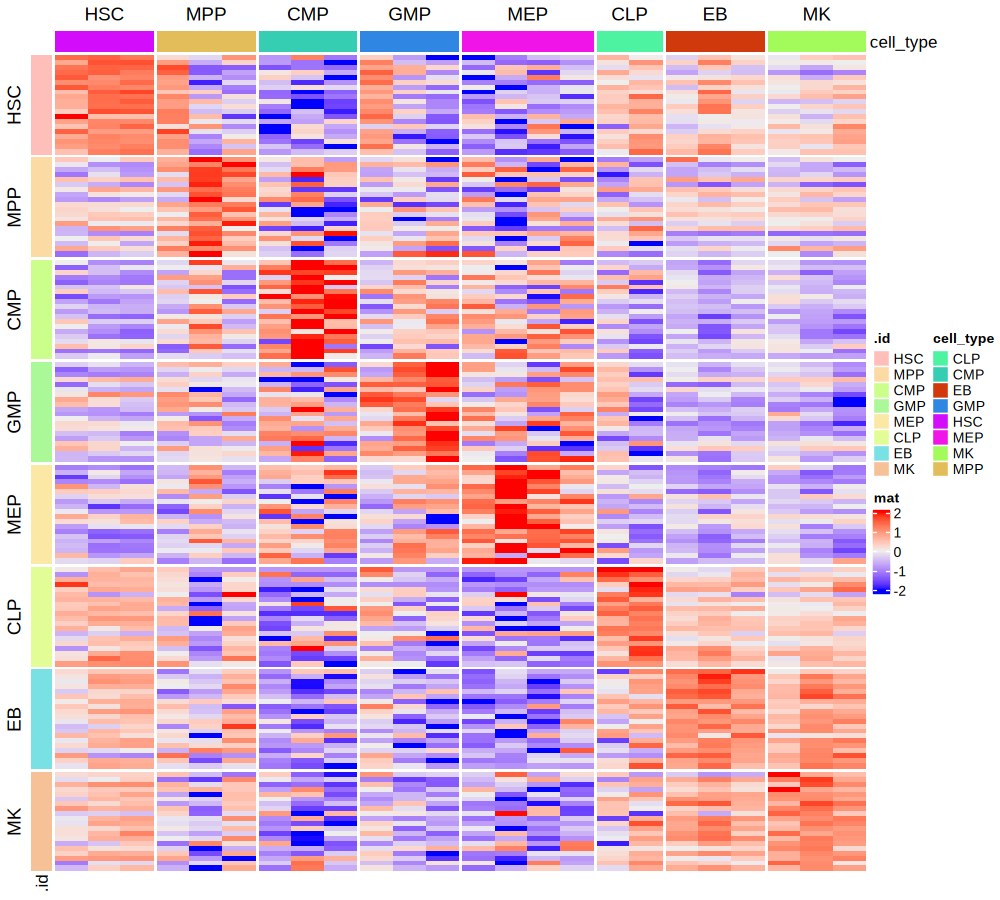

In [83]:
# top 20 up-regulated te genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_te_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

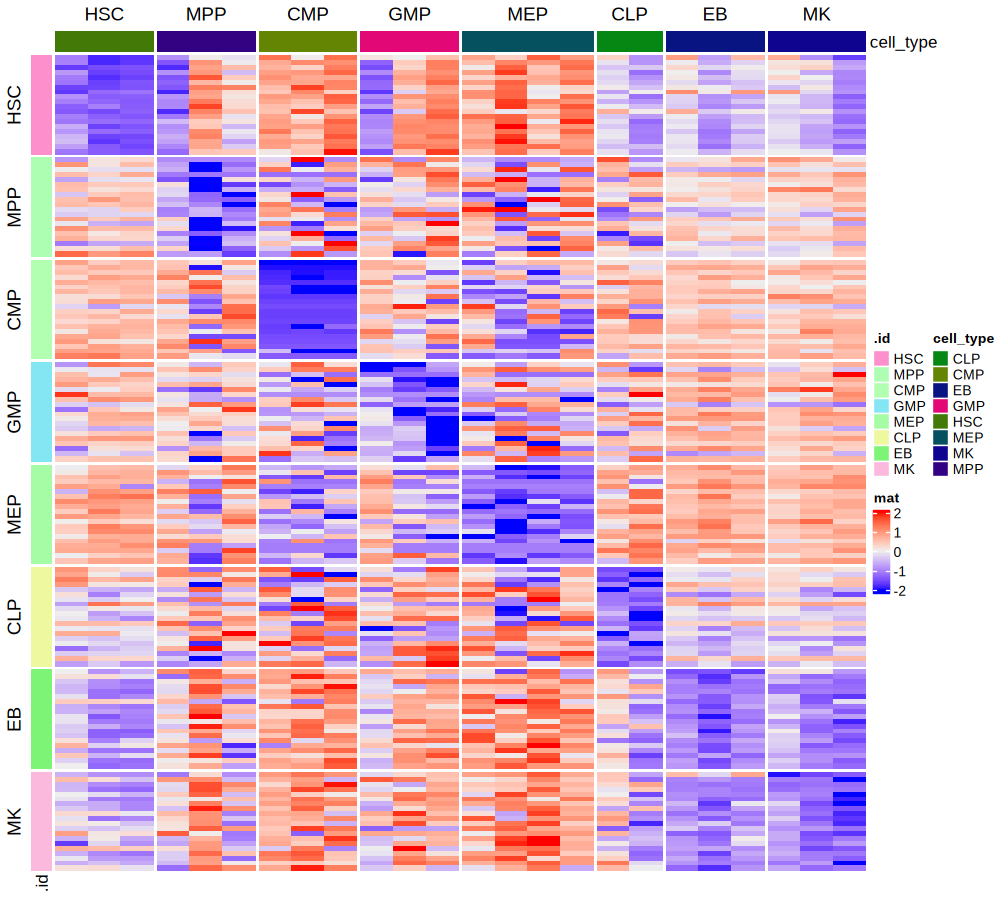

In [84]:
# top 20 up-regulated te genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_te_dt[logFC < 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


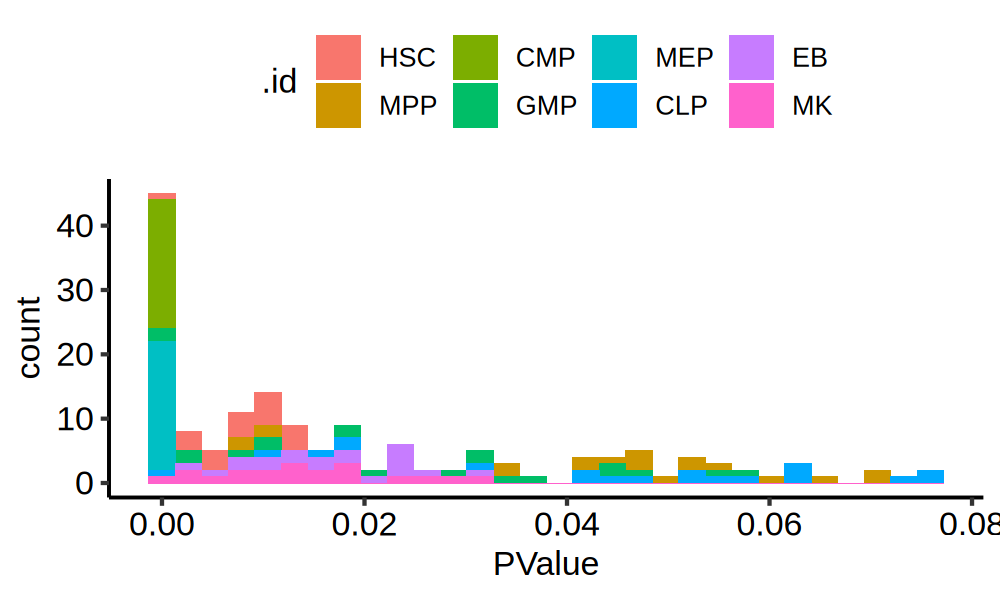

In [86]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = PValue, fill = .id)) + geom_histogram() + theme_pubr()


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


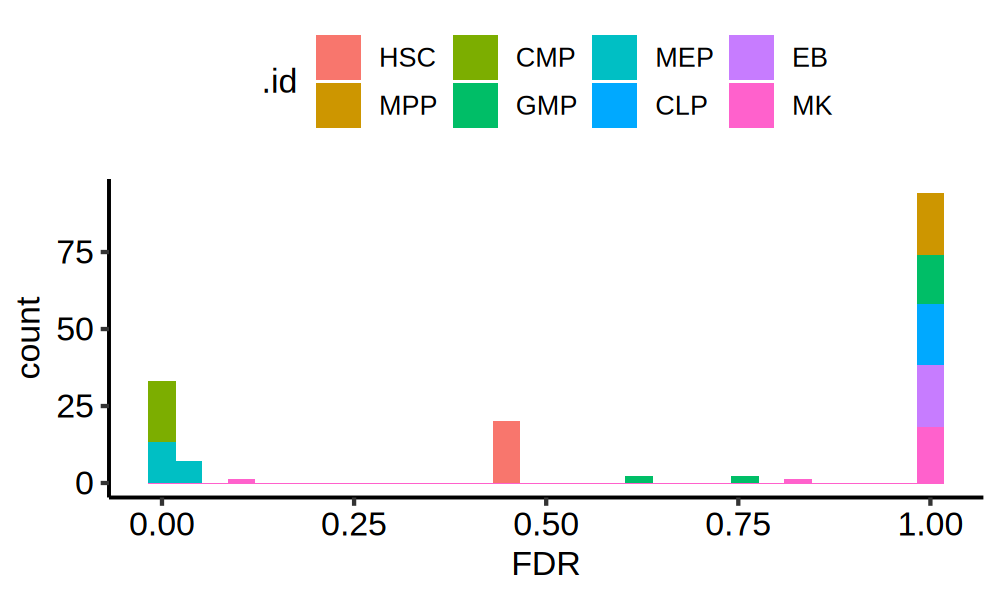

In [85]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = FDR, fill = .id)) + geom_histogram() + theme_pubr()


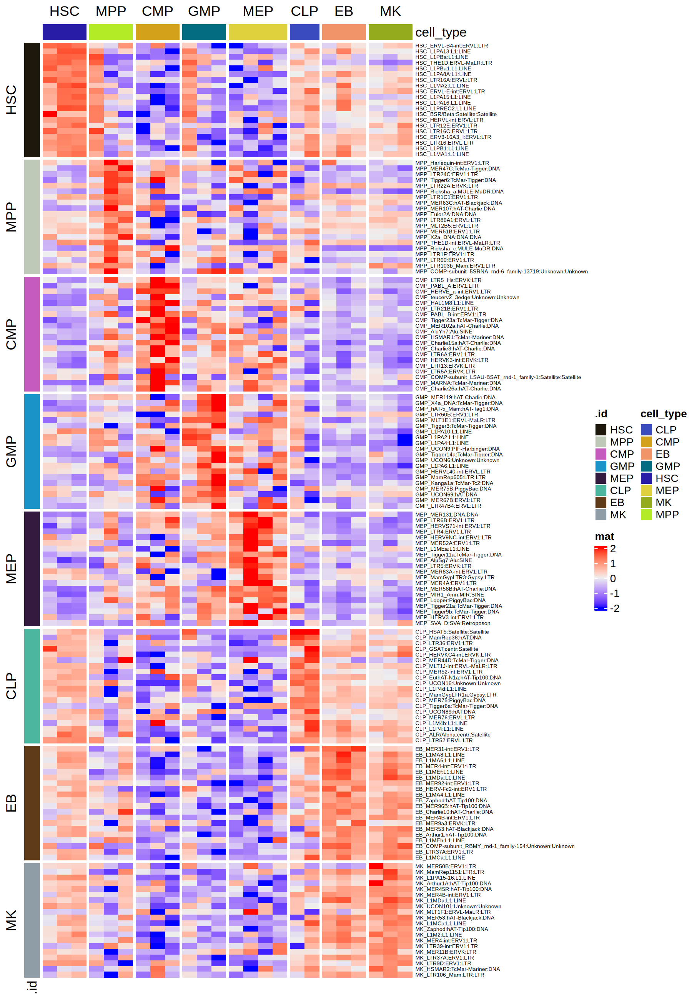

In [87]:
# top 20 up-regulated te genes for each cell type
options(repr.plot.width = 9, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_te_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, row_names_gp = grid::gpar(fontsize = 5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


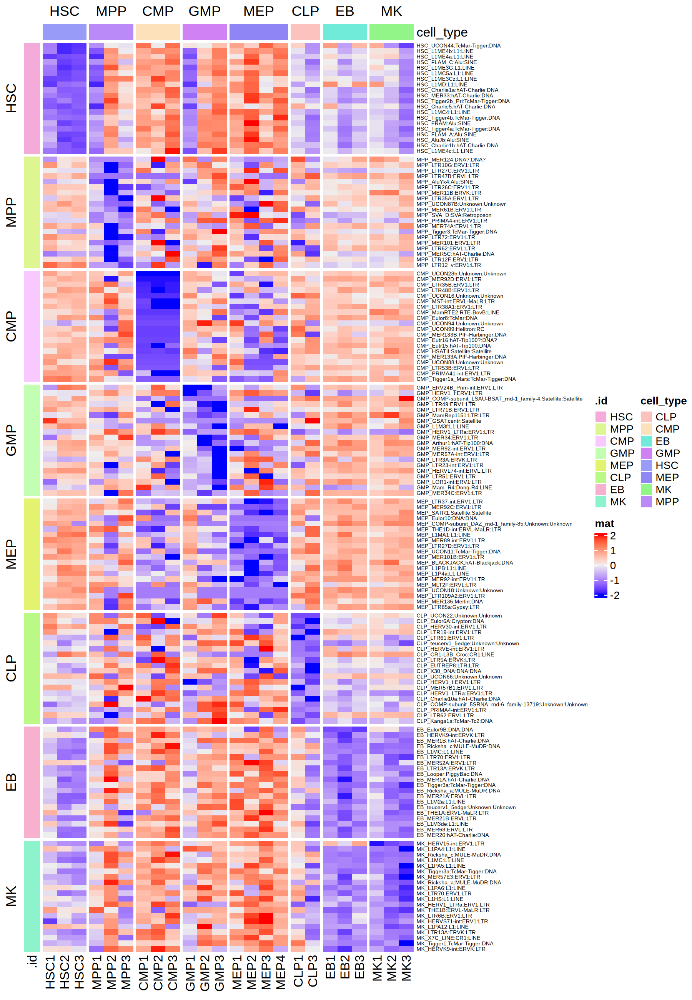

In [88]:
# top 20 down-regulated te genes for each cell type
options(repr.plot.width = 9, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_te_dt[logFC < 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, row_names_gp = grid::gpar(fontsize = 5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


# comparing TEcount and TElocal

In [21]:
deg_te_dt_LTR = deg_te_dt[class_id %in% c('LTR', 'LINE'), ]
deg_te_dt_LTR[, FDR2 := p.adjust(PValue)]


In [40]:
dim(deg_te_dt_LTR)
dim(deg_telocal_dt_LTR)

[1] 5903   12

[1] 194393     12

In [22]:
deg_telocal_dt_LTR = deg_telocal_dt[class_id %in% c('LTR', 'LINE'), ]
deg_telocal_dt_LTR[, FDR2 := p.adjust(PValue)]


In [23]:
table(deg_telocal_dt_LTR$class_id)


  LINE    LTR 
166258  28135 

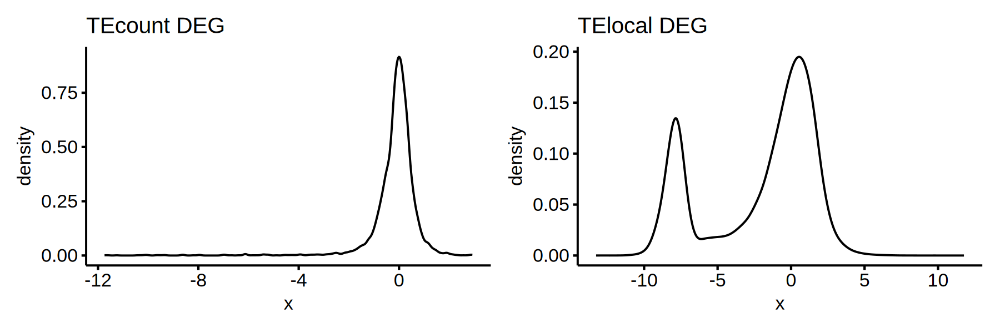

In [24]:
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
ggdensity(deg_te_dt_LTR$logFC) + ggtitle('TEcount DEG') | ggdensity(deg_telocal_dt_LTR$logFC) + ggtitle('TElocal DEG')

In [26]:
head(deg_telocal_dt_LTR)

.id,rn,logFC,logCPM,PValue,FDR,class_id,family_id,gene_id,tx_id,updn,FDR2
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
HSC,L1PA4_dup1026:L1PA4:L1:LINE,5.936436,3.164052,6.412631e-06,0.2728831,LINE,L1,L1PA4,L1PA4_dup1026,up,1
HSC,L1MA5_dup1975:L1MA5:L1:LINE,6.554444,2.938303,3.966342e-05,0.8439185,LINE,L1,L1MA5,L1MA5_dup1975,up,1
HSC,L1PA10_dup1389:L1PA10:L1:LINE,6.677560,2.658130,7.357540e-05,0.8610581,LINE,L1,L1PA10,L1PA10_dup1389,up,1
HSC,L1PA2_dup3592:L1PA2:L1:LINE,4.570589,2.999451,8.093793e-05,0.8610581,LINE,L1,L1PA2,L1PA2_dup3592,up,1
HSC,L1PA4_dup3068:L1PA4:L1:LINE,3.910597,3.125766,1.015730e-04,0.8644678,LINE,L1,L1PA4,L1PA4_dup3068,up,1
HSC,L1PA5_dup8894:L1PA5:L1:LINE,6.045896,2.690809,1.421106e-04,0.9066953,LINE,L1,L1PA5,L1PA5_dup8894,up,1


In [31]:
head(deg_telocal_dt_LTR_info)


rn,.id,logFC,logCPM,PValue,FDR,class_id,family_id,gene_id,tx_id,updn,FDR2,chr,exon,start,end
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<int>,<int>
ERVL-B4-int_dup1009:ERVL-B4-int:ERVL:LTR,HSC,3.612739,2.844488,0.05941711,1.0000000,LTR,ERVL,ERVL-B4-int,ERVL-B4-int_dup1009,up,1,chr1,exon,162943582,162943790
ERVL-B4-int_dup1009:ERVL-B4-int:ERVL:LTR,HSC,3.612739,2.844488,0.05941711,1.0000000,LTR,ERVL,ERVL-B4-int,ERVL-B4-int_dup1009,up,1,chr1,exon,162944506,162946035
ERVL-B4-int_dup1009:ERVL-B4-int:ERVL:LTR,MPP,-6.823197,2.845348,0.44314254,0.8434336,LTR,ERVL,ERVL-B4-int,ERVL-B4-int_dup1009,dn,1,chr1,exon,162943582,162943790
ERVL-B4-int_dup1009:ERVL-B4-int:ERVL:LTR,MPP,-6.823197,2.845348,0.44314254,0.8434336,LTR,ERVL,ERVL-B4-int,ERVL-B4-int_dup1009,dn,1,chr1,exon,162944506,162946035
ERVL-B4-int_dup1009:ERVL-B4-int:ERVL:LTR,CMP,-6.824064,2.846647,0.41948688,0.6034564,LTR,ERVL,ERVL-B4-int,ERVL-B4-int_dup1009,dn,1,chr1,exon,162943582,162943790
ERVL-B4-int_dup1009:ERVL-B4-int:ERVL:LTR,CMP,-6.824064,2.846647,0.41948688,0.6034564,LTR,ERVL,ERVL-B4-int,ERVL-B4-int_dup1009,dn,1,chr1,exon,162944506,162946035


In [38]:
table(deg_telocal_dt_LTR_info[abs(logFC) > 1 & PValue < .05, .id])



  CLP   CMP    EB   GMP   HSC   MEP    MK   MPP 
 2038  7323   581  1254  1133 21136   609  2666 

In [60]:
tmp1 = deg_te_dt[abs(logFC) > 1 & FDR < 0.1, ]
tmp2 = deg_telocal_dt[abs(logFC) > 1 & FDR < 0.1, ]
table(tmp2[gene_id %in% intersect(tmp1$gene_id, tmp2$gene_id), class_id] )



       DNA       LINE        LTR Retroposon  Satellite 
         7          6         14          1          5 

In [63]:
tmp1 = deg_te_dt[abs(logFC) > .7 & FDR < 0.1, ]
tmp2 = deg_telocal_dt[abs(logFC) > .7 & FDR < 0.1, ]
table(tmp2[gene_id %in% intersect(tmp1$gene_id, tmp2$gene_id), class_id] )



       DNA       LINE        LTR Retroposon  Satellite 
        17         28         15          1          5 

In [57]:
head(deg_telocal_dt)
head(deg_te_dt)


.id,rn,logFC,logCPM,PValue,FDR,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
HSC,L1PA4_dup1026:L1PA4:L1:LINE,5.936436,3.164052,6.412631e-06,0.2728831,up
HSC,L1MA5_dup1975:L1MA5:L1:LINE,6.554444,2.938303,3.966342e-05,0.8439185,up
HSC,L1PA10_dup1389:L1PA10:L1:LINE,6.677560,2.658130,7.357540e-05,0.8610581,up
HSC,L1PA2_dup3592:L1PA2:L1:LINE,4.570589,2.999451,8.093793e-05,0.8610581,up
HSC,L1PA4_dup3068:L1PA4:L1:LINE,3.910597,3.125766,1.015730e-04,0.8644678,up
HSC,L1PA5_dup8894:L1PA5:L1:LINE,6.045896,2.690809,1.421106e-04,0.9066953,up


.id,rn,logFC,logCPM,PValue,FDR,sel,idd,class_id,family_id,gene_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<int>,<chr>,<chr>,<chr>
HSC,FLAM_C:Alu:SINE,-0.9128241,12.467095,0.003354908,0.5944787,NA,1,SINE,Alu,FLAM_C
HSC,UCON44:TcMar-Tigger:DNA,-1.6884823,7.812925,0.004110851,0.5944787,NA,2,DNA,TcMar-Tigger,UCON44
HSC,L1ME3G:L1:LINE,-0.5030516,12.483404,0.005752892,0.5944787,NA,3,LINE,L1,L1ME3G
HSC,L1ME4a:L1:LINE,-0.5586001,12.695243,0.007049395,0.5944787,NA,4,LINE,L1,L1ME4a
HSC,MER33:hAT-Charlie:DNA,-0.7200624,10.986634,0.008228203,0.5944787,NA,5,DNA,hAT-Charlie,MER33
HSC,ERVL-B4-int:ERVL:LTR,0.6461831,8.966138,0.009950680,0.5944787,NA,6,LTR,ERVL,ERVL-B4-int


In [1]:
intersect(tmp1$class_id, tmp2$class_id)
intersect(tmp1$family_id, tmp2$family_id)
intersect(tmp1$gene_id, tmp2$gene_id)


NULL

NULL

NULL

In [67]:
tmp12 = tmp2[gene_id %in% tmp1$gene_id, ]
head(tmp12)
table(tmp2[gene_id %in% tmp1$gene_id, gene_id])

.id,rn,logFC,logCPM,PValue,FDR,class_id,family_id,gene_id,tx_id,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
MEP,Tigger3a_dup1143:Tigger3a:TcMar-Tigger:DNA,5.955309,4.808894,2.291174e-06,0.01075477,DNA,TcMar-Tigger,Tigger3a,Tigger3a_dup1143,up
MEP,LTR4_dup18:LTR4:ERV1:LTR,6.242314,5.496454,5.768258e-06,0.01410595,LTR,ERV1,LTR4,LTR4_dup18,up
MEP,L1MD_dup1032:L1MD:L1:LINE,4.593586,5.942320,9.949109e-06,0.01575175,LINE,L1,L1MD,L1MD_dup1032,up
MEP,Tigger3a_dup1839:Tigger3a:TcMar-Tigger:DNA,7.181857,4.712913,1.035411e-05,0.01575175,DNA,TcMar-Tigger,Tigger3a,Tigger3a_dup1839,up
MEP,LTR6A_dup199:LTR6A:ERV1:LTR,4.338307,5.975371,1.275144e-05,0.01575175,LTR,ERV1,LTR6A,LTR6A_dup199,up
MEP,L1PA16_dup8396:L1PA16:L1:LINE,6.413169,4.769213,1.392081e-05,0.01575175,LINE,L1,L1PA16,L1PA16_dup8396,up



   ALR/Alpha  HERV9NC-int  HERVE_a-int  HERVS71-int       HSMAR1        L1MA1 
           5            1            1            2            1            1 
        L1MD       L1ME3C      L1ME3Cz       L1PA16        L1PB2      LTR16E1 
           5            1            6           13            2            1 
        LTR4       LTR48B        LTR6A        LTR6B      LTR86B1   MamRep1894 
           1            1            2            1            1            1 
      MER45R        MER5C    MER65-int   MER83A-int    MER92-int        SVA_D 
           1            2            1            2            1            1 
   Tigger11a Tigger2b_Pri      Tigger3     Tigger3a 
           2            2            1            7 

# telocal heatmap

In [230]:
table(deg_telocal_dt[FDR < .1, .id]) 


CLP  EB MEP  MK MPP 
  1 177 904 260  21 

png 
  2

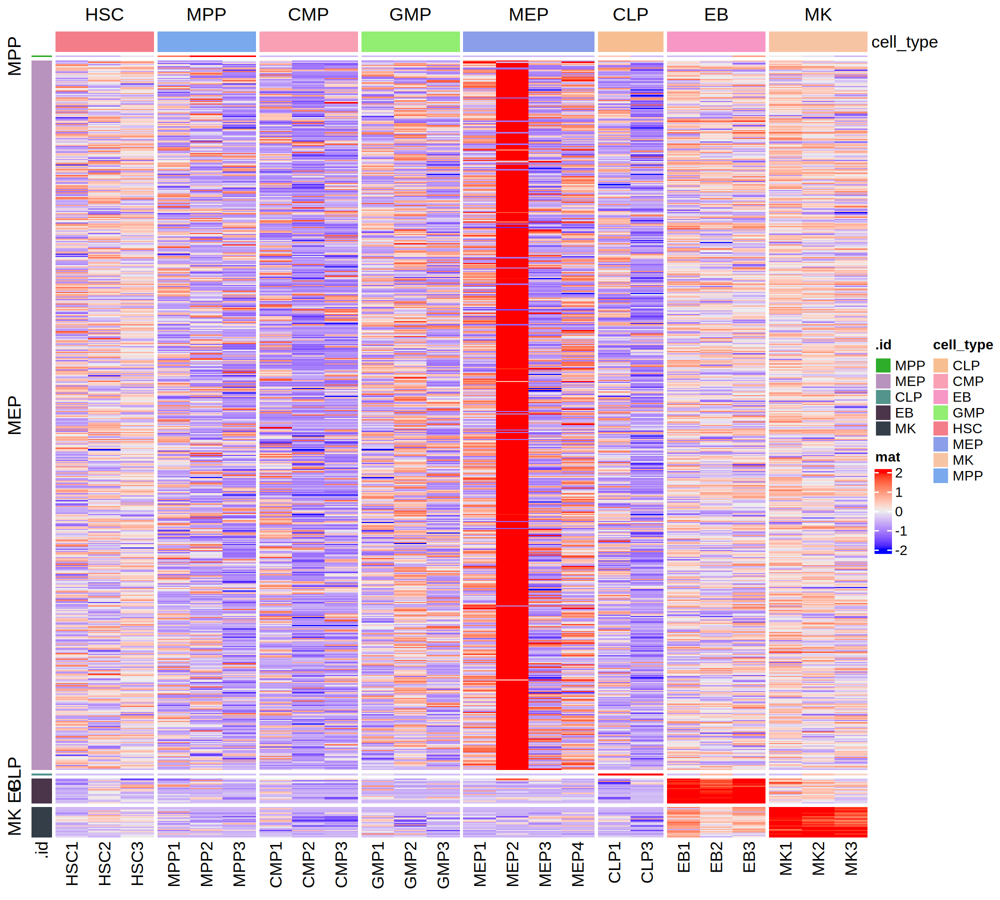

In [115]:
# all sig ones with FDr < 0.1
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)

row_sel = deg_telocal_dt[ FDR < 0.1 & abs(logFC) > .7, ] 
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]
row_sel[, idd := 1:nrow(row_sel) ]
row_sel = row_sel[order(idd, decreasing = T), ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  
hp
pdf('heatmap.pdf', width = 10, height = 13)
hp
dev.off()

In [90]:
dsn_telocal = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_telocal)), row.names = colnames(logcpm_telocal))
dim(dsn_telocal)

[1] 24  1

In [103]:
head(row_sel)

.id,rn,logFC,logCPM,PValue,FDR,class_id,family_id,gene_id,tx_id,updn,FDR2,ctype_gene
<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>
MK,L1PA4_dup10325:L1PA4:L1:LINE,7.771284,4.683064,2.517114e-09,0.0001071133,LINE,L1,L1PA4,L1PA4_dup10325,up,0.0004892942,MK_L1PA4_dup10325:L1PA4:L1:LINE
MK,L1ME3A_dup448:L1ME3A:L1:LINE,8.847983,4.199644,6.131836e-08,0.0013046707,LINE,L1,L1ME3A,L1ME3A_dup448,up,0.0119194299,MK_L1ME3A_dup448:L1ME3A:L1:LINE
MK,L1PA2_dup2595:L1PA2:L1:LINE,5.203792,6.759707,3.969478e-07,0.0045053733,LINE,L1,L1PA2,L1PA2_dup2595,up,0.0771591095,MK_L1PA2_dup2595:L1PA2:L1:LINE
MK,L1PA5_dup1349:L1PA5:L1:LINE,8.169417,4.005655,4.234970e-07,0.0045053733,LINE,L1,L1PA5,L1PA5_dup1349,up,0.0823189319,MK_L1PA5_dup1349:L1PA5:L1:LINE
MK,L1PA4_dup3886:L1PA4:L1:LINE,6.121862,3.895629,2.618174e-06,0.0159162540,LINE,L1,L1PA4,L1PA4_dup3886,up,0.5089049619,MK_L1PA4_dup3886:L1PA4:L1:LINE
MK,MLT1J2_dup2026:MLT1J2:ERVL-MaLR:LTR,7.101480,3.658515,5.118890e-06,0.0242890031,LTR,ERVL-MaLR,MLT1J2,MLT1J2_dup2026,up,0.9949637936,MK_MLT1J2_dup2026:MLT1J2:ERVL-MaLR:LTR


`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



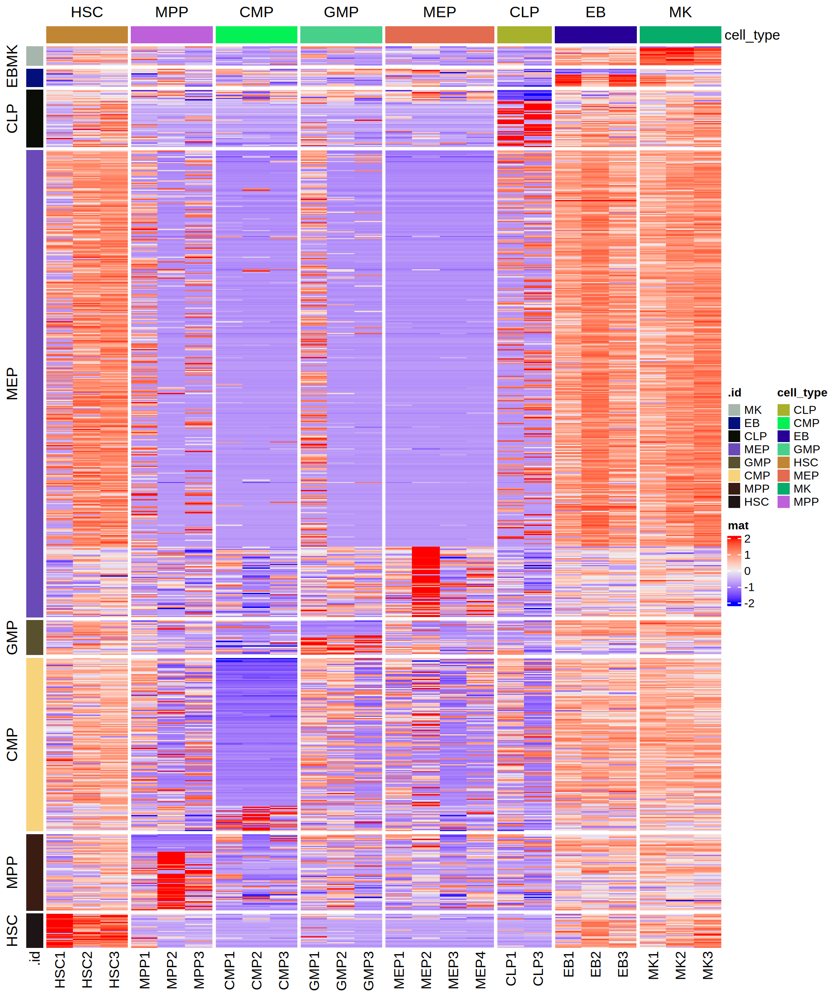

In [182]:
# all sig ones with FDR < 0.1
options(repr.plot.width = 10, repr.plot.height = 12, repr.plot.res = 200)

row_sel = deg_telocal_dt_LTR[ PValue < 0.05 & abs(logFC) > .7, ] 
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = rev(cell_types))]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ][order(.id), ]
row_sel = row_sel[order(as.numeric(.id), sign(logFC)), ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, row_names_gp = grid::gpar(size = 2), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  
hp


In [183]:
head(row_sel)

.id,rn,logFC,logCPM,PValue,FDR,class_id,family_id,gene_id,tx_id,updn,FDR2,ctype_gene
<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>
MK,L1M1_dup5152:L1M1:L1:LINE,-6.859455,9.838075,0.0006747258,0.5558937,LINE,L1,L1M1,L1M1_dup5152,dn,1,MK_L1M1_dup5152:L1M1:L1:LINE
MK,L1PA4_dup2210:L1PA4:L1:LINE,-7.000361,8.989350,0.0011553792,0.7682188,LINE,L1,L1PA4,L1PA4_dup2210,dn,1,MK_L1PA4_dup2210:L1PA4:L1:LINE
MK,L1MC_dup3536:L1MC:L1:LINE,-4.811773,13.453732,0.0029762994,1.0000000,LINE,L1,L1MC,L1MC_dup3536,dn,1,MK_L1MC_dup3536:L1MC:L1:LINE
MK,L1MCa_dup2402:L1MCa:L1:LINE,-7.508277,6.968701,0.0046868251,1.0000000,LINE,L1,L1MCa,L1MCa_dup2402,dn,1,MK_L1MCa_dup2402:L1MCa:L1:LINE
MK,LTR15_dup52:HERV15-int:ERV1:LTR,-6.119355,10.077453,0.0062166803,1.0000000,LTR,ERV1,HERV15-int,LTR15_dup52,dn,1,MK_LTR15_dup52:HERV15-int:ERV1:LTR
MK,L1M1_dup3947:L1M1:L1:LINE,-5.501207,7.443370,0.0076798527,1.0000000,LINE,L1,L1M1,L1M1_dup3947,dn,1,MK_L1M1_dup3947:L1M1:L1:LINE


In [185]:
table(row_sel[.id == 'MEP', class_id])


LINE  LTR 
5874  894 

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



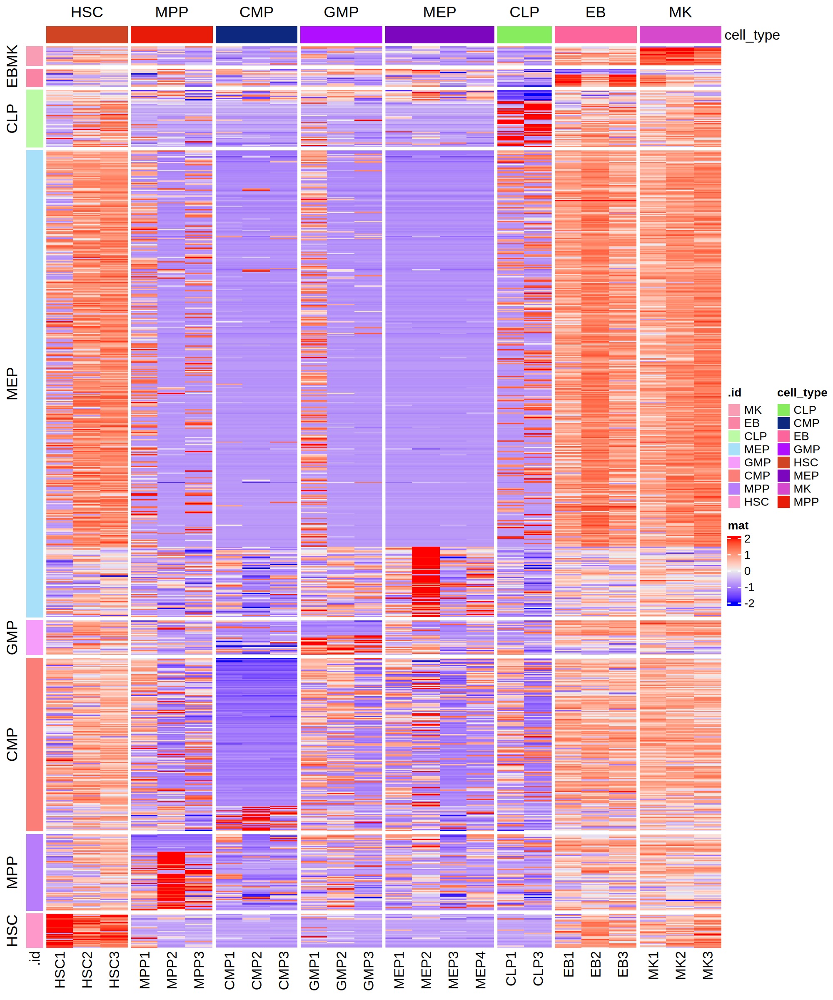

In [125]:
# all sig ones with FDR < 0.1
options(repr.plot.width = 10, repr.plot.height = 12, repr.plot.res = 200)

row_sel = deg_telocal_dt_LTR[ PValue < 0.05 & abs(logFC) > .7, ] 
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = rev(cell_types))]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ][order(.id), ]
row_sel = row_sel[order(as.numeric(.id), sign(logFC)), ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, row_names_gp = grid::gpar(size = 2), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  
hp


In [ ]:
# all sig ones with FDR < 0.1
options(repr.plot.width = 10, repr.plot.height = 12, repr.plot.res = 200)

row_sel = deg_telocal_dt_LTR[ FDR < 0.1 & abs(logFC) > 1 & gene_id %in% tmp1$gene_id, ] 
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = rev(cell_types))]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = row_sel$.id, row_names_gp = grid::gpar(size = 2), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  
hp


`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



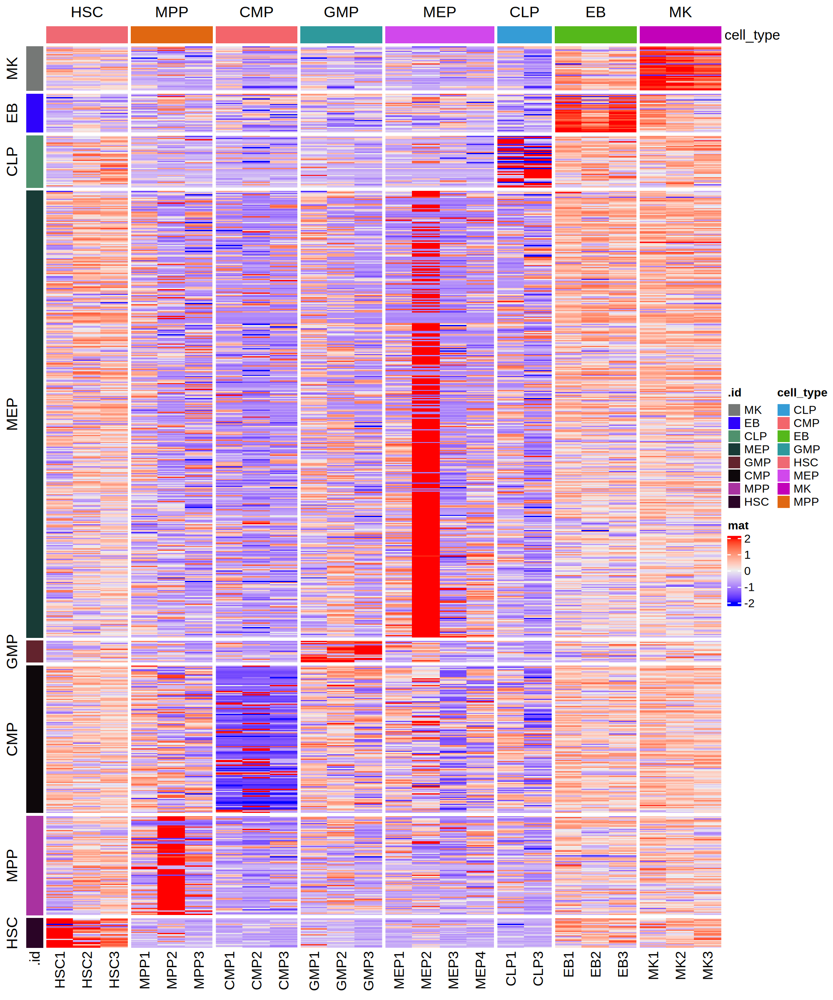

In [118]:
# all sig ones with FDR < 0.1
options(repr.plot.width = 10, repr.plot.height = 12, repr.plot.res = 200)

row_sel = deg_telocal_dt[ PValue < 0.01 & abs(logFC) > 1, ] 
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = rev(cell_types))]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]
row_sel[, idd := 1:nrow(row_sel) ]
row_sel = row_sel[order(idd, decreasing = T), ]


plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, row_names_gp = grid::gpar(size = 2), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  
hp


In [77]:
row_sel = deg_telocal_dt[ PValue < 0.01 & logFC > 1, ] 
table(row_sel$class_id, row_sel$.id)
head(row_sel)


            
             CLP CMP  EB GMP HSC MEP  MK MPP
  DNA          7  14   5   5   1 187  20  42
  LINE       137  82  45  50 102 417  84 217
  LTR         34  15  14   8  20  96  14  40
  Retroposon   0   0   0   0   0   2   0   0
  Satellite    1   0   0   0   1   0   0   3
  SINE         3  43  75  12   0 749  49  95
  Unknown      0   0   1   0   0   0   2   1

.id,rn,logFC,logCPM,PValue,FDR,class_id,family_id,gene_id,tx_id,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
HSC,L1PA4_dup1026:L1PA4:L1:LINE,5.936436,3.164052,6.412631e-06,0.2728831,LINE,L1,L1PA4,L1PA4_dup1026,up
HSC,L1MA5_dup1975:L1MA5:L1:LINE,6.554444,2.938303,3.966342e-05,0.8439185,LINE,L1,L1MA5,L1MA5_dup1975,up
HSC,L1PA10_dup1389:L1PA10:L1:LINE,6.677560,2.658130,7.357540e-05,0.8610581,LINE,L1,L1PA10,L1PA10_dup1389,up
HSC,L1PA2_dup3592:L1PA2:L1:LINE,4.570589,2.999451,8.093793e-05,0.8610581,LINE,L1,L1PA2,L1PA2_dup3592,up
HSC,L1PA4_dup3068:L1PA4:L1:LINE,3.910597,3.125766,1.015730e-04,0.8644678,LINE,L1,L1PA4,L1PA4_dup3068,up
HSC,L1PA5_dup8894:L1PA5:L1:LINE,6.045896,2.690809,1.421106e-04,0.9066953,LINE,L1,L1PA5,L1PA5_dup8894,up


In [76]:
row_sel = deg_telocal_dt[ PValue < 0.01 & logFC < -1, ] 
table(row_sel$class_id, row_sel$.id)
head(row_sel)


           
            CLP CMP  EB GMP HSC MEP  MK MPP
  DNA         4  44   5   1   0  18   4   4
  LINE       18 287   9   7   1 327   7  17
  LTR         6  29   4   4   0  39   1   1
  Satellite   0   4   0   0   0  41   0   0
  SINE       12 111   7   5   1  34   8   3
  Unknown     0   1   0   0   0   1   0   0

.id,rn,logFC,logCPM,PValue,FDR,class_id,family_id,gene_id,tx_id,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
HSC,L1MD_dup2024:L1MD:L1:LINE,-5.351829,10.686590,0.0062678211,1.0000000,LINE,L1,L1MD,L1MD_dup2024,dn
HSC,AluJr_dup6543:AluJr:Alu:SINE,-6.687467,9.314801,0.0070979423,1.0000000,SINE,Alu,AluJr,AluJr_dup6543,dn
MPP,L1MEf_dup3921:L1MEf:L1:LINE,-8.367425,6.158254,0.0004931872,0.5672186,LINE,L1,L1MEf,L1MEf_dup3921,dn
MPP,L1ME3A_dup6410:L1ME3A:L1:LINE,-10.004387,5.838107,0.0034120745,0.7227865,LINE,L1,L1ME3A,L1ME3A_dup6410,dn
MPP,AluJb_dup74301:AluJb:Alu:SINE,-9.478890,5.324049,0.0035841402,0.7227865,SINE,Alu,AluJb,AluJb_dup74301,dn
MPP,L1MC_dup663:L1MC:L1:LINE,-10.599446,6.425041,0.0037094825,0.7227865,LINE,L1,L1MC,L1MC_dup663,dn


In [84]:
deg_telocal_dt_LTR = deg_telocal_dt[class_id %in% c('LTR', 'LINE'), ]
deg_telocal_dt_LTR[, FDR2 := p.adjust(PValue)]


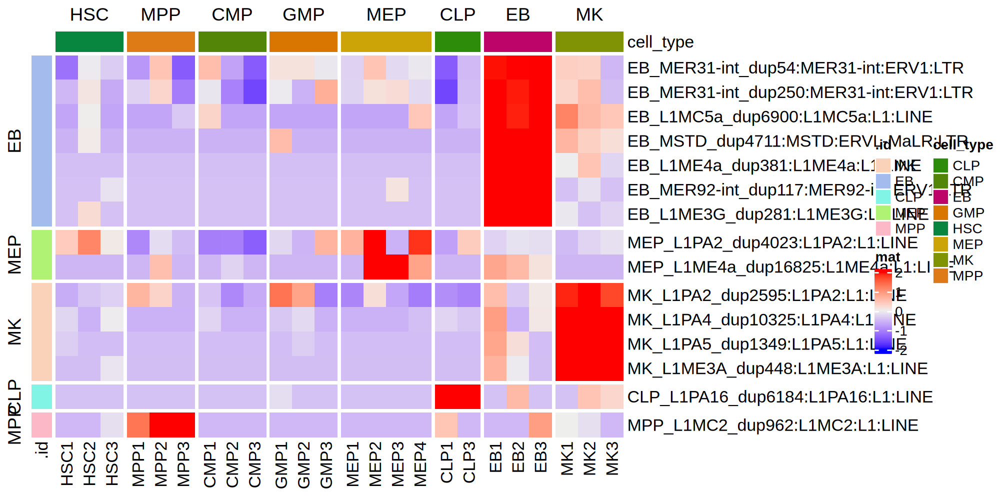

In [87]:
# all sig ones with FDR < 0.1
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 200)

row_sel = deg_telocal_dt_LTR[ FDR2 < 0.1 & abs(logFC) > .7, ] 
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = rev(cell_types))]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = row_sel$.id, row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  
hp


In [53]:
head(row_sel)

.id,rn,logFC,logCPM,PValue,FDR,updn,ctype_gene
<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
MK,L1PA4_dup10325:L1PA4:L1:LINE,7.771284,4.683064,2.517114e-09,0.0001071133,up,MK_L1PA4_dup10325:L1PA4:L1:LINE
MK,L1ME3A_dup448:L1ME3A:L1:LINE,8.847983,4.199644,6.131836e-08,0.0013046707,up,MK_L1ME3A_dup448:L1ME3A:L1:LINE
MK,L1PA2_dup2595:L1PA2:L1:LINE,5.203792,6.759707,3.969478e-07,0.0045053733,up,MK_L1PA2_dup2595:L1PA2:L1:LINE
MK,L1PA5_dup1349:L1PA5:L1:LINE,8.169417,4.005655,4.234970e-07,0.0045053733,up,MK_L1PA5_dup1349:L1PA5:L1:LINE
MK,AluJb_dup47903:AluJb:Alu:SINE,7.308104,7.815737,1.642871e-06,0.0123670441,up,MK_AluJb_dup47903:AluJb:Alu:SINE
MK,AluJb_dup176339:AluJb:Alu:SINE,4.671165,7.580678,1.743720e-06,0.0123670441,up,MK_AluJb_dup176339:AluJb:Alu:SINE


In [54]:
table(row_sel$.id, row_sel$updn)

     
        dn   up
  MK    20  169
  EB    25  140
  CLP   40  182
  MEP  460 1451
  GMP   17   75
  CMP  476  154
  MPP   25  398
  HSC    2  124

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



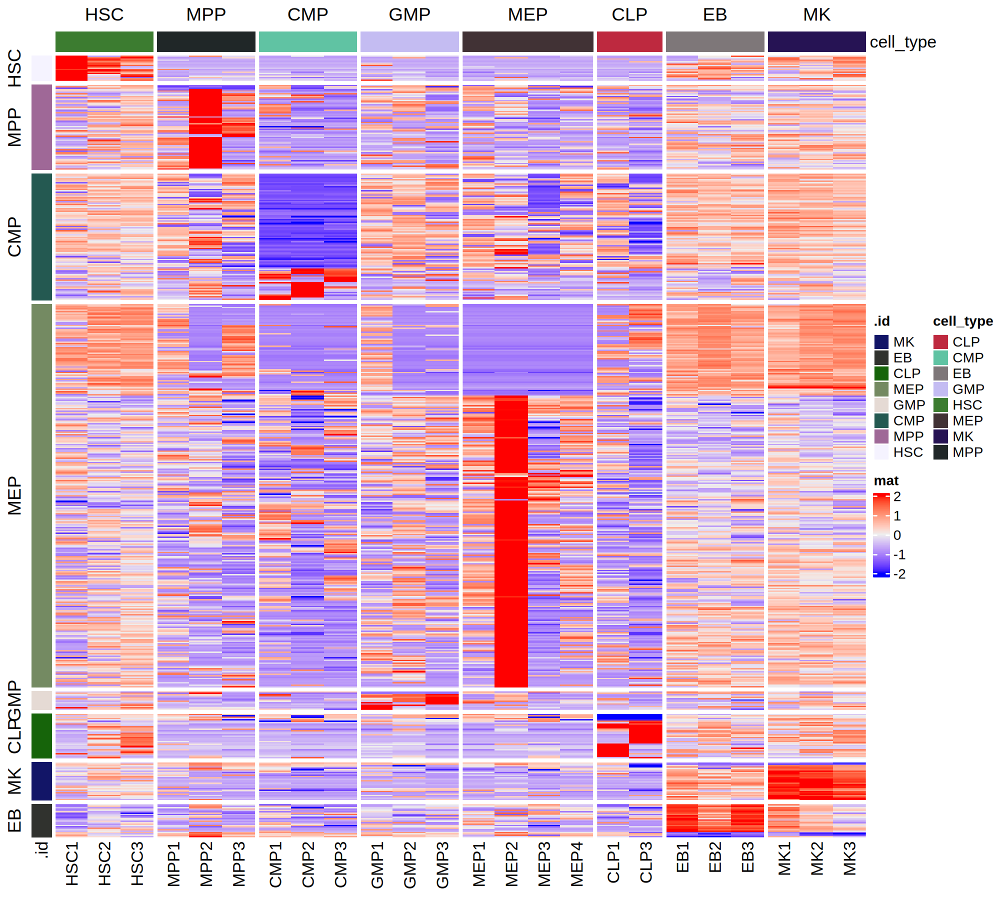

In [31]:
# all sig ones with FDr < 0.1
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)

row_sel = deg_telocal_dt[ PValue < 0.01 & abs(logFC) > 1, ] 
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = rev(cell_types))]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = row_sel$.id, row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  
hp


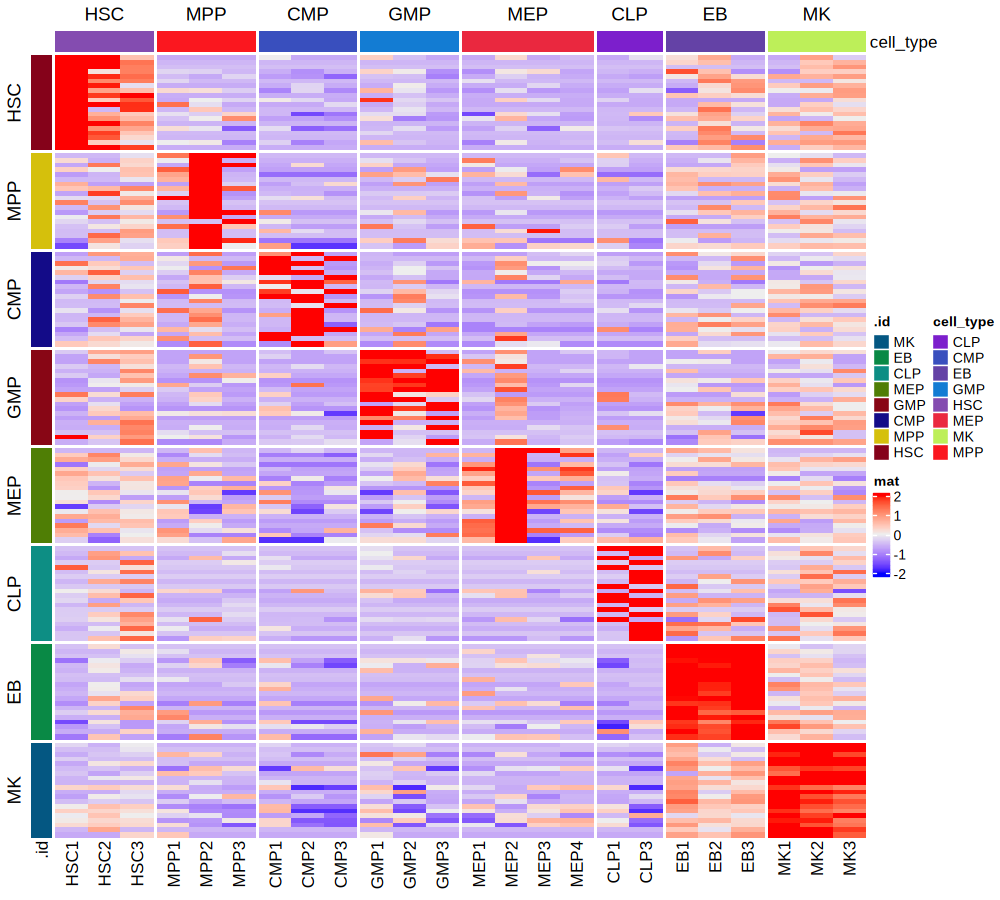

In [34]:
# top 20 up-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_telocal_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
fwrite(row_sel, file = 'data/telocal_up20.xls', sep = '\t') 
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = rev(cell_types))]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(row_sel$.id, levels = cell_types), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


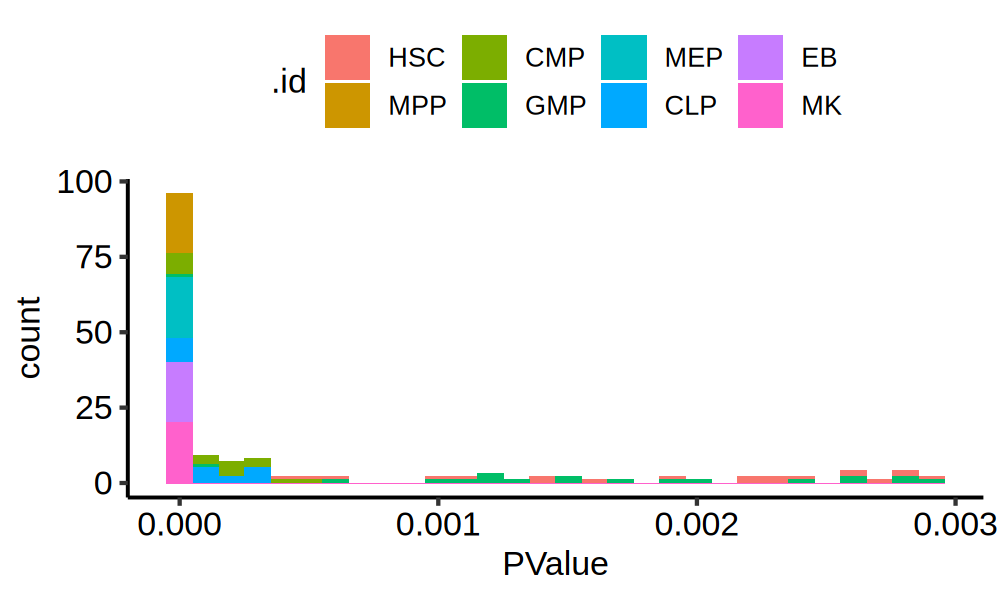

In [236]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = PValue, fill = .id)) + geom_histogram() + theme_pubr()


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


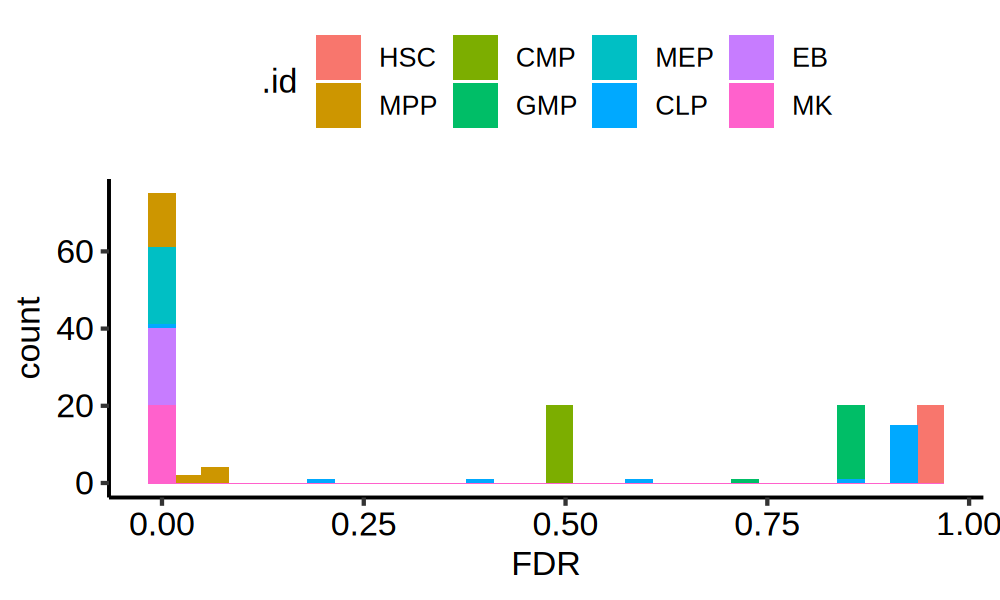

In [237]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = FDR, fill = .id)) + geom_histogram() + theme_pubr()


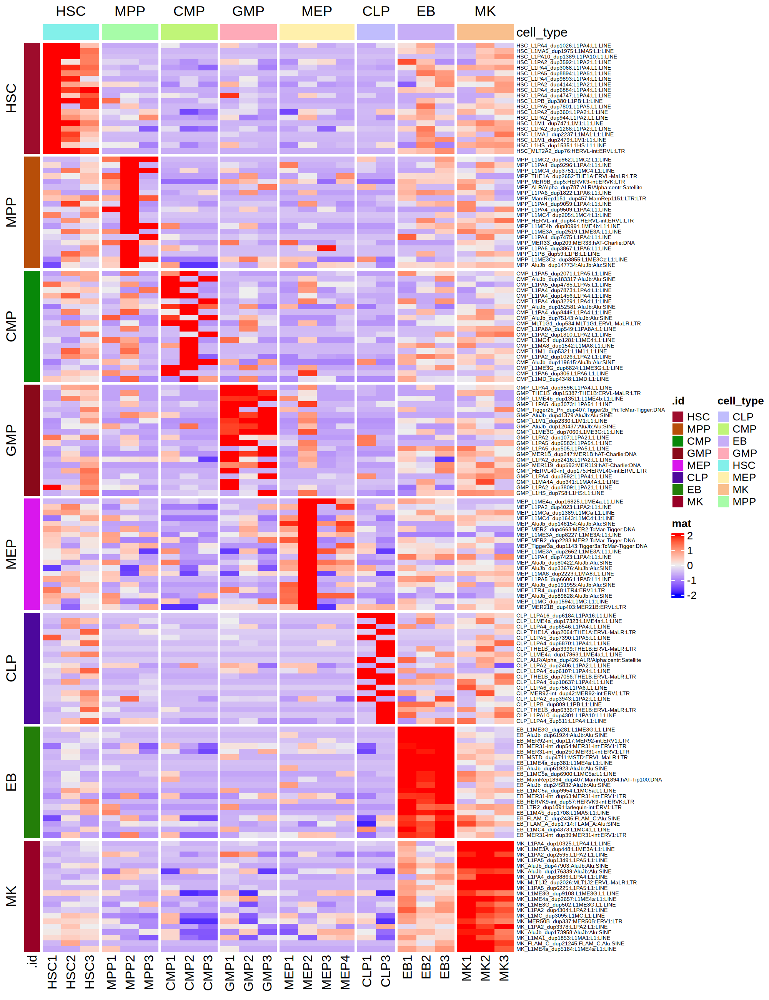

In [37]:
# top 20 up-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_telocal_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(row_sel$.id, levels = cell_types), 
        row_names_gp = grid::gpar(fontsize = 5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  


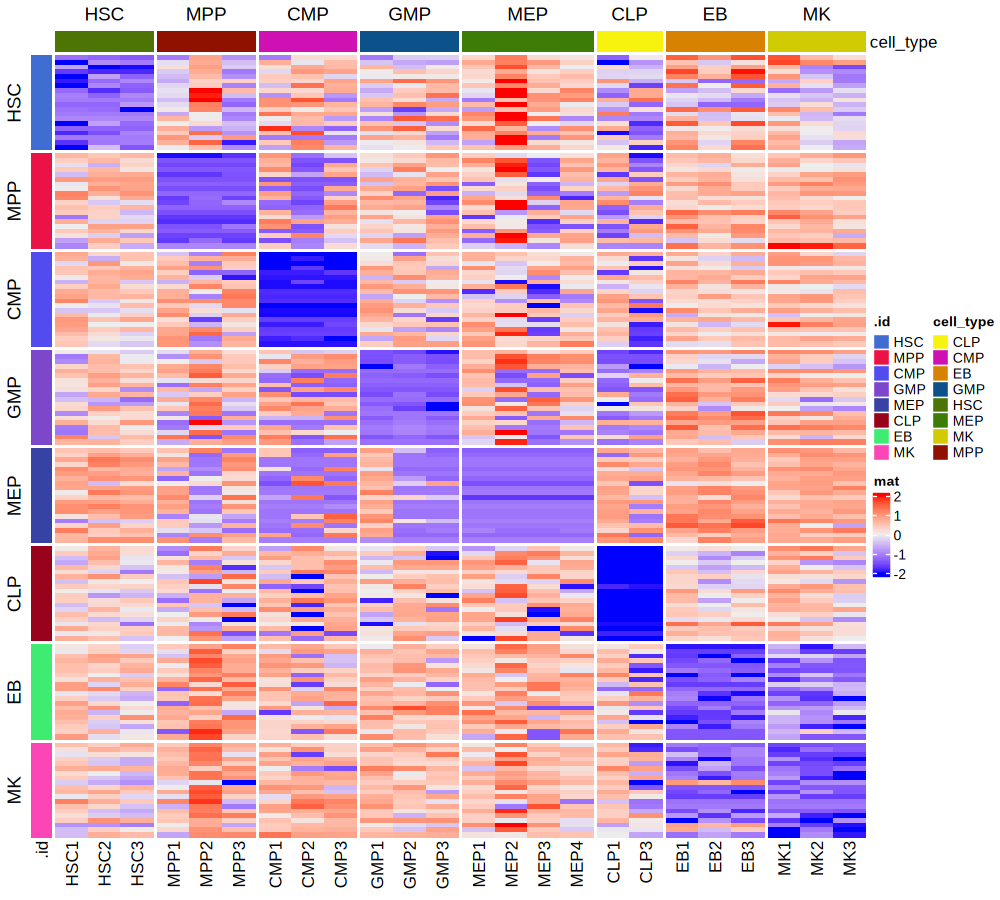

In [39]:
# top 20 dn-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_telocal_dt[logFC < 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
fwrite(row_sel, file = 'data/telocal_down20.xls', sep = '\t') 
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(row_sel$.id, levels = cell_types), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


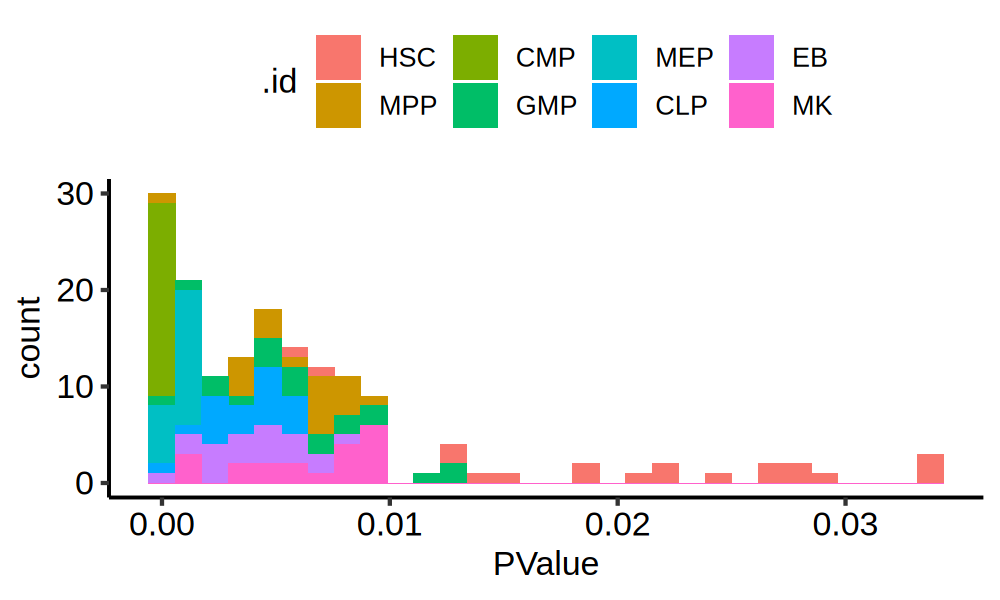

In [917]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = PValue, fill = .id)) + geom_histogram() + theme_pubr()


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


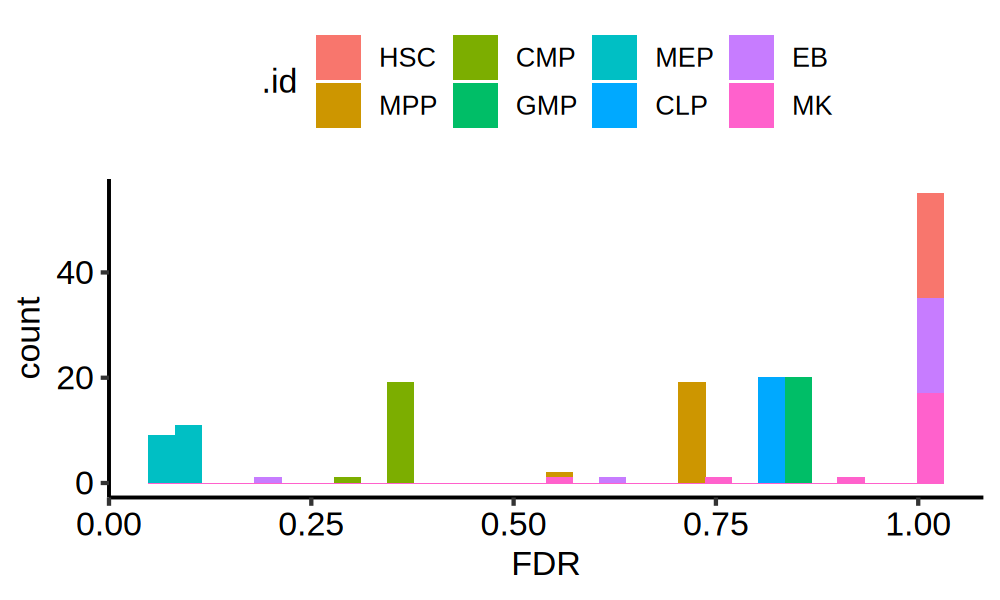

In [918]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = FDR, fill = .id)) + geom_histogram() + theme_pubr()


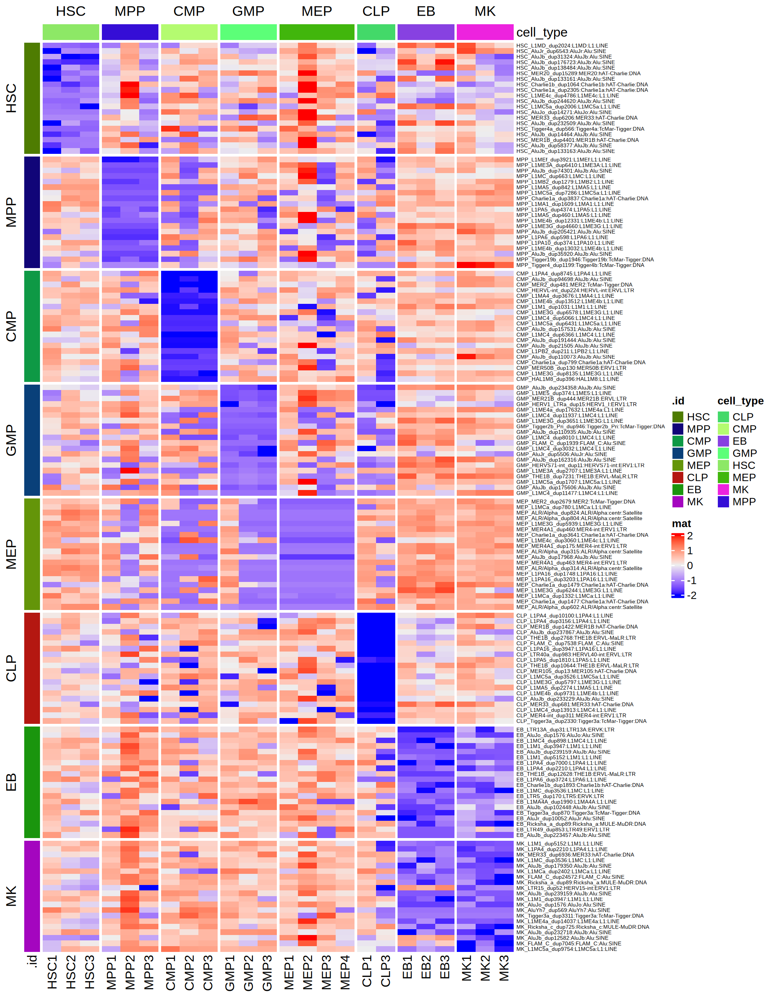

In [43]:
# top 20 dn-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_telocal_dt[logFC < 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
fwrite(row_sel, file = 'data/telocal_down20.xls', sep = '\t') 
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(row_sel$.id, levels = cell_types), row_names_gp = grid::gpar(fontsize = 5),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  

# DEG overlaps with coding genes

## identify overlapped TE with coding genes for CMP related cell types

In [15]:
gene_dt = fread('/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.ncbiRefSeq.gtf')
colnames(gene_dt) = c('seqname', 'source', 'feature', 'start', 'end', 'score', 'strand', 'frame', 'info')

gene_dt[, gene_id := sub('.*gene_id "(.*)"; tr.*', '\\1', info)]
gene_dt[, gene_id := sub('.*gene_id "(.*)"; tr.*', '\\1', info)]

In [18]:
gene_dt_tx = gene_dt[feature == 'transcript', ]


In [115]:
te_sel = deg_telocal_MEPCMP[batch == 'CMP' & logFC < -2  & FDR < 0.05, ]
te_sel = deg_telocal_MEPCMP[batch == 'CMP' & FDR < 0.05, ]
te_sel = te_dt[idd %in% te_sel$rn, ]
nrow(te_sel)


[1] 26453

In [116]:
te_sel_gr = makeGRangesFromDataFrame(te_sel, keep.extra.columns = T)
te_gr = makeGRangesFromDataFrame(te_dt, keep.extra.columns = T)
gene_dt_tx_gr = makeGRangesFromDataFrame(gene_dt_tx, keep.extra.columns = T)


In [60]:
ov_te_gene_gr = subsetByOverlaps(te_gr, gene_dt_tx_gr, maxgap = 1)
ov_gene_te_gr = subsetByOverlaps(gene_dt_tx_gr, te_gr, maxgap = 1)

In [61]:
table(ov_te_gene_gr$class_id)


           DNA           DNA?           LINE Low_complexity            LTR             RC     Retroposon      Satellite           SINE         srpRNA        Unknown 
        163128             48         377593              3         136697            577           1796           8027         546137              7           3704 

In [62]:
table(te_dt$class_id)


           DNA           DNA?           LINE Low_complexity            LTR             RC     Retroposon      Satellite           SINE         srpRNA        Unknown 
        527321            148        1567840             17         751651           2267           7380          49729        1782180             16          23274 

In [117]:
ov_teSel_gene_gr = subsetByOverlaps(te_sel_gr, gene_dt_tx_gr, maxgap = 1)
ov_gene_teSel_gr = subsetByOverlaps(gene_dt_tx_gr, te_sel_gr, maxgap = 1)

In [118]:
table(ov_teSel_gene_gr$class_id)
table(te_sel$class_id)


 DNA LINE  LTR 
 533 4083  545 


  DNA  LINE   LTR 
 1367 21692  3394 

In [72]:
ov_gene_teSel_gr

GRanges object with 14707 ranges and 6 metadata columns:
          seqnames              ranges strand |                source     feature       score       frame                   info     gene_id
             <Rle>           <IRanges>  <Rle> |           <character> <character> <character> <character>            <character> <character>
      [1]     chrX 153748086-153838175      - | ncbiRefSeq.2023-05-29  transcript           .           . gene_id "TMLHE"; tra..       TMLHE
      [2]     chrX 153730782-153838175      - | ncbiRefSeq.2023-05-29  transcript           .           . gene_id "TMLHE"; tra..       TMLHE
      [3]     chrX 153727254-153838175      - | ncbiRefSeq.2023-05-29  transcript           .           . gene_id "TMLHE"; tra..       TMLHE
      [4]     chrX 153718334-153838175      - | ncbiRefSeq.2023-05-29  transcript           .           . gene_id "TMLHE"; tra..       TMLHE
      [5]     chrX 153718334-153838175      - | ncbiRefSeq.2023-05-29  transcript           .    

In [47]:
options(width = 166)

In [120]:
length(unique(ov_gene_teSel_gr$gene_id))

[1] 1889

## clustering analysis for these coding genes

In [85]:
dsn_sel = dsn_all[cell_type %in% c('HSC', 'CMP', 'GMP'), ]
dsn_sel = dsn_all[cell_type %in% c('HSC', 'CMP'), ]
dsn_sel

rn,cell_type
<chr>,<fct>
HSC1,HSC
HSC2,HSC
HSC3,HSC
CMP1,CMP
CMP2,CMP
CMP3,CMP


[1] 1796    9

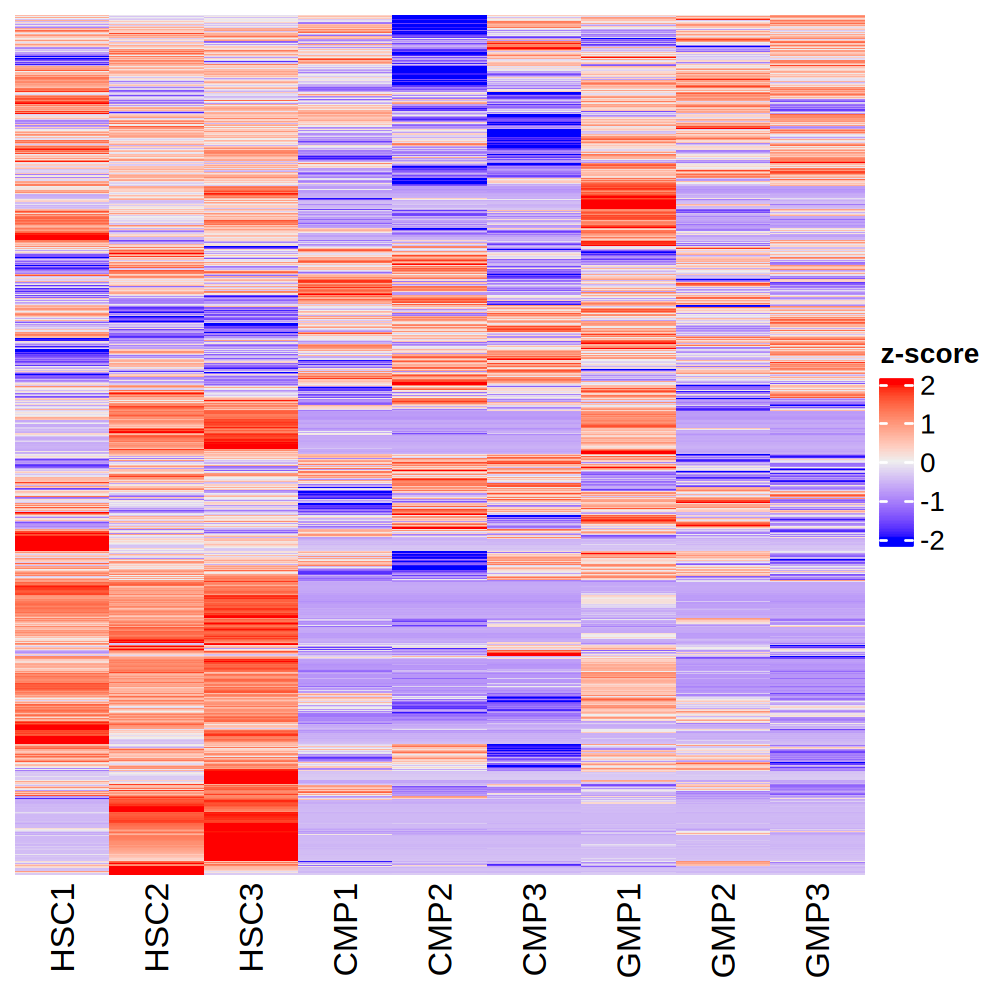

In [122]:
plotdat = logcpm_coding[rownames(logcpm_coding) %in% unique(ov_gene_teSel_gr$gene_id), dsn_sel$rn]
dim(plotdat) 
plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
plotdat = plotdat[!is.na(plotdat[, 1]), ]

options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
Heatmap(plotdat, name = "z-score", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, cluster_rows = T,  
        show_row_dend = F) #, top_annotation = column_ha, left_annotation = column_ra, column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


In [94]:
deg_coding_CMPMEP_dt = readRDS('data/deg_coding_CMPMEP_dt.rds')

In [124]:
intersect(ov_gene_teSel_gr$gene_id, deg_coding_CMPMEP_dt[batch == 'CMP' & FDR < 0.1, rn])

[1] "FHIP2A" "CACNB4"

In [101]:
deg_coding_CMPMEP_dt[rn %in% c('FHIP2A', 'CACNB4') & batch == 'CMP', ]

.id,rn,logFC,logCPM,PValue,FDR,tag,batch,target
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
deg_coding_CMP_GMP,CACNB4,-11.928691,2.772457,5.468286e-07,0.002859118,CMP_GMP,CMP,GMP
deg_coding_CMP_GMP,FHIP2A,-3.288692,5.323804,2.099750e-05,0.040780104,CMP_GMP,CMP,GMP
deg_coding_CMP_HSC,CACNB4,-11.928691,2.772457,5.468286e-07,0.002859118,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,FHIP2A,-3.288692,5.323804,2.099750e-05,0.040780104,CMP_HSC,CMP,HSC


[1] 2 9

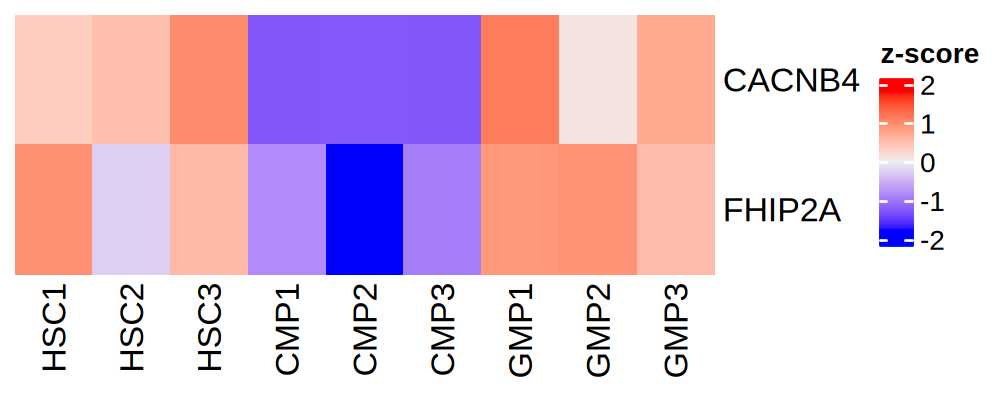

In [106]:
dsn_sel = dsn_all[cell_type %in% c('HSC', 'CMP', 'GMP'), ]
plotdat = logcpm_coding[rownames(logcpm_coding) %in% c('FHIP2A', 'CACNB4'), dsn_sel$rn]
dim(plotdat) 
plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
plotdat = plotdat[!is.na(plotdat[, 1]), ]

options(repr.plot.width = 5, repr.plot.height = 2, repr.plot.res = 200)
Heatmap(plotdat, name = "z-score", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, cluster_rows = T,  
        show_row_dend = F) #, top_annotation = column_ha, left_annotation = column_ra, column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


In [111]:
gene_sel_gr = makeGRangesFromDataFrame(gene_dt[gene_id %in% c('FHIP2A', 'CACNB4'), ], keep.extra.columns = T)
plotdat = subsetByOverlaps(te_sel_gr, gene_sel_gr, maxgap = 1)
plotdat


GRanges object with 4 ranges and 9 metadata columns:
      seqnames              ranges strand |        rmsk        exon       score     gene_id  transcript_id   family_id    class_id                    idd
         <Rle>           <IRanges>  <Rle> | <character> <character> <character> <character>    <character> <character> <character>            <character>
  [1]    chr10 115752852-115753145      + |   UCSC_rmsk        exon           .       L1MA4  L1MA4_dup2811          L1        LINE L1MA4_dup2811:L1MA4:..
  [2]     chr2 152361328-152365339      - |   UCSC_rmsk        exon           .      L1PA8A L1PA8A_dup1458          L1        LINE L1PA8A_dup1458:L1PA8..
  [3]     chr2 152365646-152367414      - |   UCSC_rmsk        exon           .      L1PA8A L1PA8A_dup1458          L1        LINE L1PA8A_dup1458:L1PA8..
  [4]     chr2 152367725-152368057      - |   UCSC_rmsk        exon           .      L1PA8A L1PA8A_dup1458          L1        LINE L1PA8A_dup1458:L1PA8..
                       

In [112]:
gene_sel_gr

GRanges object with 604 ranges and 6 metadata columns:
        seqnames              ranges strand |                source     feature       score       frame                   info     gene_id
           <Rle>           <IRanges>  <Rle> |           <character> <character> <character> <character>            <character> <character>
    [1]    chr10 115715884-115758842      + | ncbiRefSeq.2023-05-29  transcript           .           . gene_id "FHIP2A"; tr..      FHIP2A
    [2]    chr10 115715884-115716227      + | ncbiRefSeq.2023-05-29        exon           .           . gene_id "FHIP2A"; tr..      FHIP2A
    [3]    chr10 115715884-115716182      + | ncbiRefSeq.2023-05-29        5UTR           .           . gene_id "FHIP2A"; tr..      FHIP2A
    [4]    chr10 115716183-115716227      + | ncbiRefSeq.2023-05-29         CDS           .           0 gene_id "FHIP2A"; tr..      FHIP2A
    [5]    chr10 115724948-115725026      + | ncbiRefSeq.2023-05-29        exon           .           . gene_id

# DEG overlap with coding genes based on TE distance with coding genes

In [125]:
gr_anno = annotatePeak(te_sel_gr, TxDb=txdb, tssRegion=c(-3000, 3000), verbose=FALSE, annoDb = 'org.Hs.eg.db', addFlankGeneInfo = T)


'select()' returned 1:many mapping between keys and columns



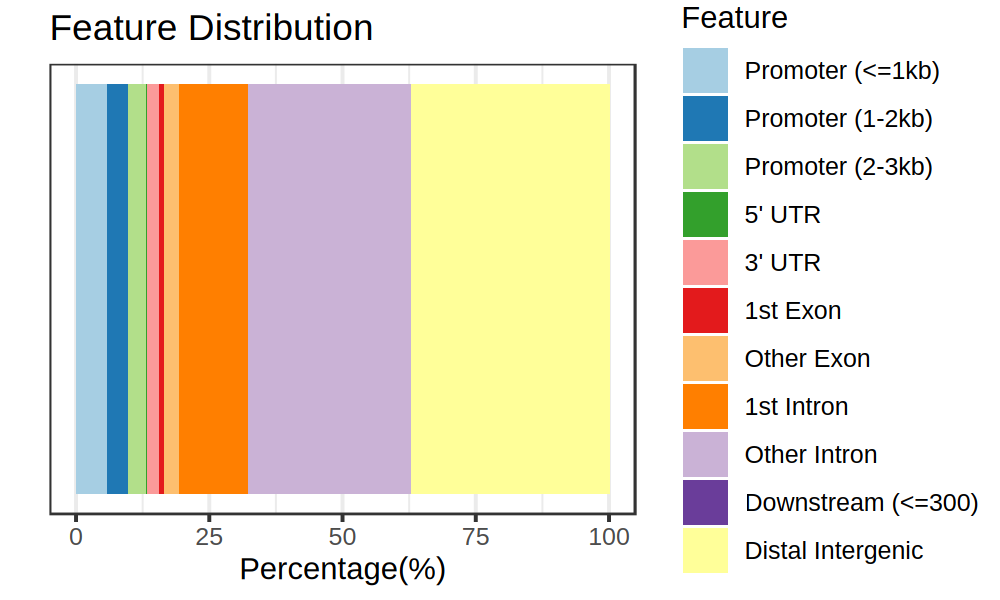

In [126]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
plotAnnoBar(gr_anno)

In [153]:
te_sel_ann = as.data.table(gr_anno@anno)
te_sel_ann[, ann := annotation] 
te_sel_ann[grep('^Intron', annotation), ann := 'intron'] 
te_sel_ann[grep('^Exon', annotation), ann := 'exon'] 
te_sel_ann[grep('UTR', annotation), ann := 'exon'] 
te_sel_ann[grep('Downs', annotation), ann := 'exon'] 
te_sel_ann[grep('^Promoter', annotation), ann := 'promoter'] 
te_sel_ann[grepl('^Distal', annotation) & abs(distanceToTSS) < 50000, ann := 'nearFar'] 


In [154]:
summary(abs(te_sel_ann[ann == 'Distal Intergenic', distanceToTSS]))

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
   50008    89407   169361   827820   358901 19722610 

In [142]:
range(te_sel_ann[ann == 'Distal Intergenic' & distanceToTSS > 0, distanceToTSS])


[1]     3026 12110666

Warning message:
"Removed 556 rows containing non-finite values (`stat_density()`)."
Warning message:
"Removed 7137 rows containing non-finite values (`stat_density()`)."


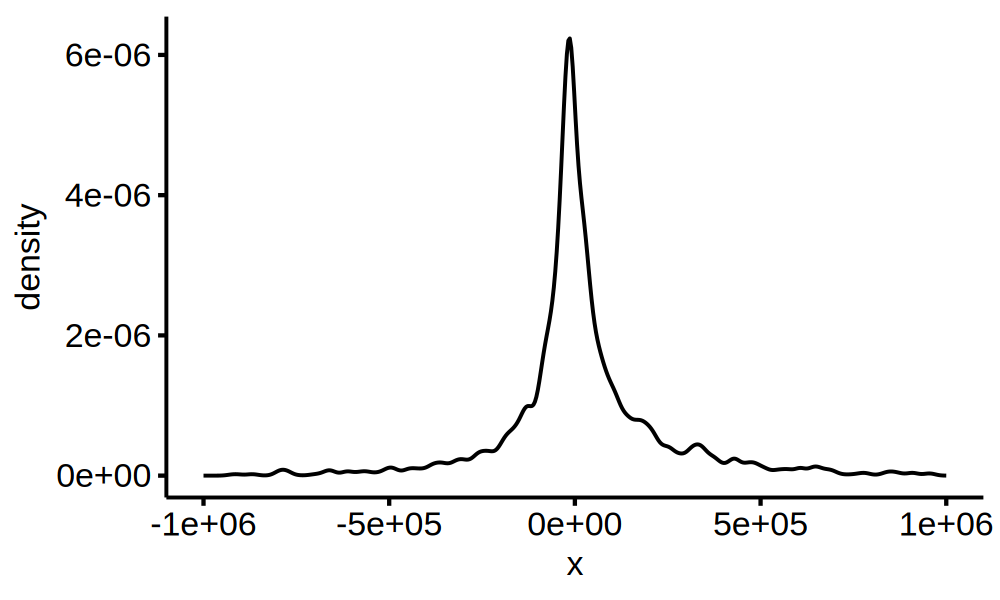

Warning message:
"Removed 8289 rows containing non-finite values (`stat_density()`)."


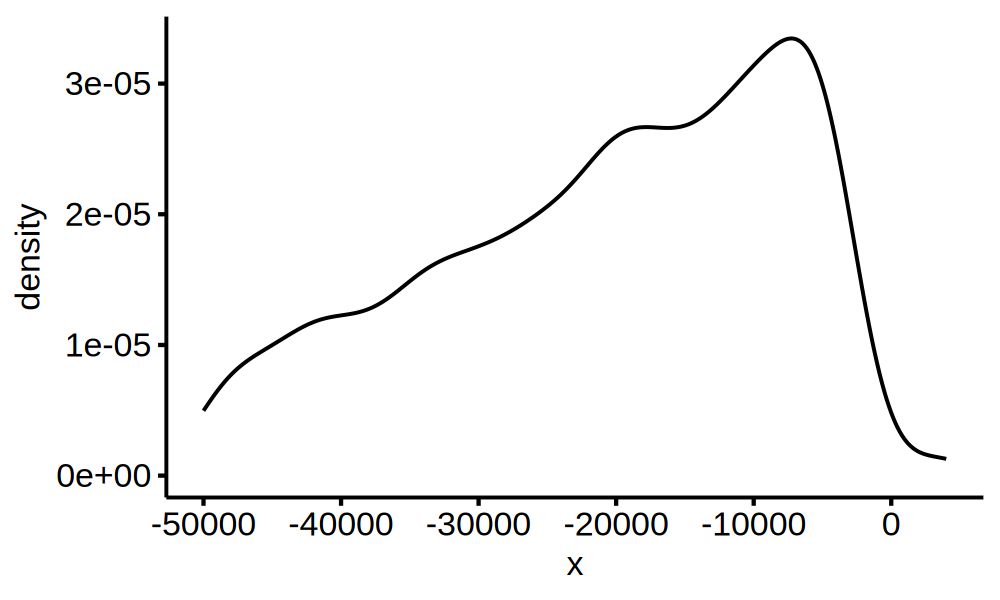

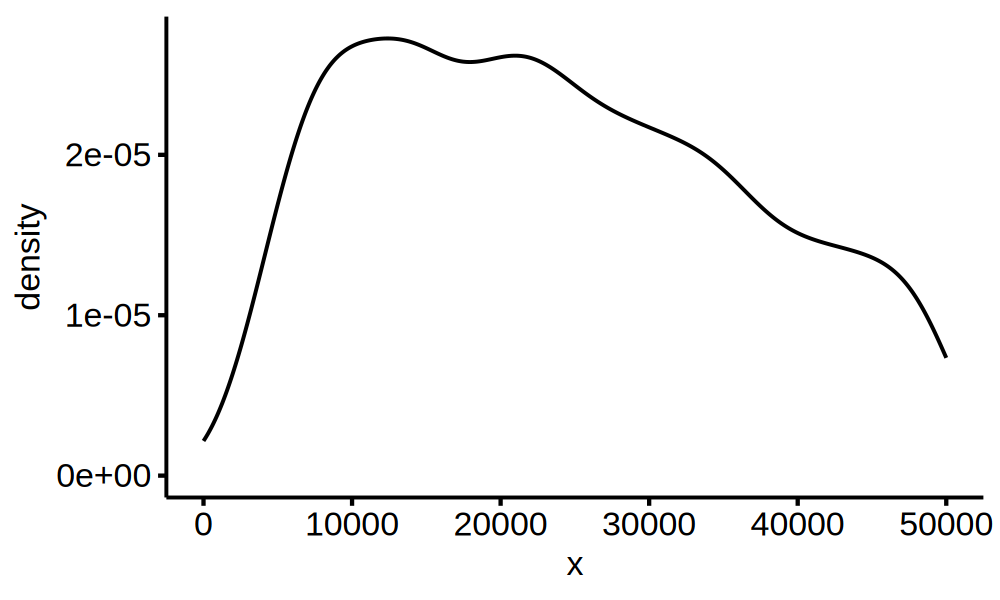

In [151]:
ggdensity(te_sel_ann[ann == 'Distal Intergenic', distanceToTSS]) + xlim(-1000000, 1000000)
ggdensity(te_sel_ann[ann == 'Distal Intergenic', distanceToTSS]) + xlim(-50000, 4000)
ggdensity(te_sel_ann[ann == 'Distal Intergenic', distanceToTSS]) + xlim(0, 50000)

In [155]:
table(te_sel_ann$ann)


Distal Intergenic              exon            intron           nearFar          promoter 
             5644              1651             11510              4158              3490 

In [163]:
gene_sel = intersect(te_sel_ann[ann %in% c('exon', 'intron', 'promoter'), SYMBOL], deg_coding_CMPMEP_dt[batch == 'CMP' & FDR < 0.1, rn])

In [160]:
intersect(te_sel_ann[ann %in% c('exon', 'intron', 'promoter', 'nearFar'), SYMBOL], deg_coding_CMPMEP_dt[batch == 'CMP' & FDR < 0.1, rn])

[1] "TESPA1"  "HDC"     "IRF8"    "SKAP1"   "FAM124B" "IL7R"

[1] 5 9

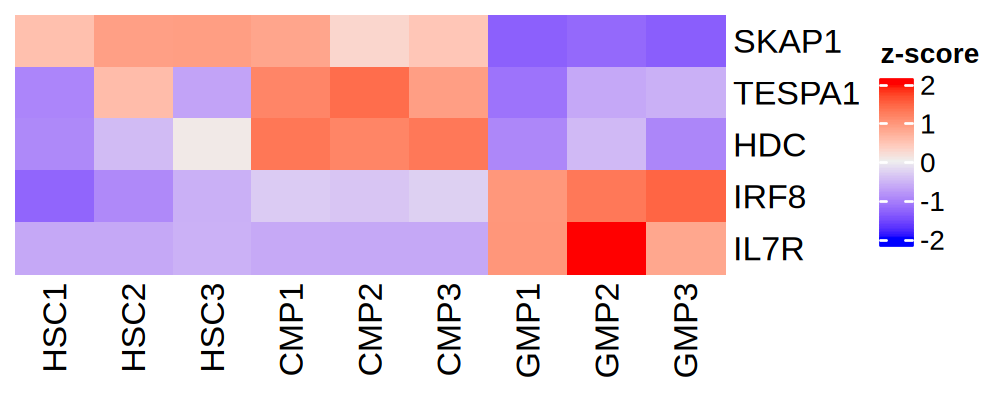

In [164]:
dsn_sel = dsn_all[cell_type %in% c('HSC', 'CMP', 'GMP'), ]
plotdat = logcpm_coding[rownames(logcpm_coding) %in% gene_sel, dsn_sel$rn]
dim(plotdat) 
plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
plotdat = plotdat[!is.na(plotdat[, 1]), ]

options(repr.plot.width = 5, repr.plot.height = 2, repr.plot.res = 200)
Heatmap(plotdat, name = "z-score", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, cluster_rows = T,  
        show_row_dend = F) #, top_annotation = column_ha, left_annotation = column_ra, column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


In [170]:
head(deg_telocal_MEPCMP[rn %in% te_sel_ann[SYMBOL %in% gene_sel, idd], ])

.id,rn,logFC,logCPM,PValue,FDR,batch,target,class_id,family_id,gene_id,tx_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
deg_telocal_MEP_EB,L1PA8A_dup290:L1PA8A:L1:LINE,-9.3750958,5.138049,4.639986e-06,0.0001122423,MEP,EB,LINE,L1,L1PA8A,L1PA8A_dup290
deg_telocal_MEP_EB,L1MA4A_dup681:L1MA4A:L1:LINE,-5.3208293,6.128200,1.911915e-03,0.0056573893,MEP,EB,LINE,L1,L1MA4A,L1MA4A_dup681
deg_telocal_MEP_EB,L1PB2_dup1355:L1PB2:L1:LINE,-7.8003215,3.695095,5.791019e-03,0.0155318289,MEP,EB,LINE,L1,L1PB2,L1PB2_dup1355
deg_telocal_MEP_EB,MER1B_dup684:MER1B:hAT-Charlie:DNA,-1.9106859,4.306333,3.054999e-01,0.4787944820,MEP,EB,DNA,hAT-Charlie,MER1B,MER1B_dup684
deg_telocal_MEP_EB,MER75_dup288:MER75:PiggyBac:DNA,-1.3702774,3.823955,4.577651e-01,0.6341317607,MEP,EB,DNA,PiggyBac,MER75,MER75_dup288
deg_telocal_MEP_EB,L1PA5_dup2852:L1PA5:L1:LINE,-0.8109392,4.897361,5.214336e-01,0.6889605775,MEP,EB,LINE,L1,L1PA5,L1PA5_dup2852


In [173]:
tail(logcpm_all)

,HSC1,HSC2,HSC3,MPP1,MPP2,MPP3,CMP1,CMP2,CMP3,GMP1,⋯,MEP3,MEP4,CLP1,CLP3,EB1,EB2,EB3,MK1,MK2,MK3
hAT-5_Mam:hAT-Tag1:DNA,4.4332591,4.2184169,4.7488244,4.176504,3.0506109,3.9484641,3.3116651,2.8382636,3.3501372,4.0487077,⋯,2.8340057,4.003029,4.4466991,3.9139784,3.6288817,4.3455681,3.51788798,3.77128903,4.3121850,4.5781211
hAT-N1_Mam:hAT-Tip100:DNA,2.6552598,2.6694614,3.0819182,2.552359,0.9490733,2.6767493,1.3024372,1.1213685,1.0496278,2.4031304,⋯,1.0480608,2.174791,1.8323572,2.2851649,1.7910044,2.5444648,1.71293465,2.04937745,2.4664459,2.9087608
hAT-N1_Mam:hAT-Tip100?:DNA,0.0000000,0.3960063,0.1079334,0.000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.3089097,⋯,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,0.1040772,0.03045142,0.06460801,0.2490753,0.2599359
hAT-N1a_Mam:hAT-Tip100:DNA,3.5720646,3.2777659,3.7625075,3.357831,2.3145030,3.3714947,2.3170051,0.4396117,2.4389956,3.0692678,⋯,1.6500112,2.738474,3.1461824,3.1034019,2.5064024,3.1261637,2.51969985,2.57363868,3.1819986,3.6448436
teucerv1_5edge:Unknown:Unknown,1.9999724,0.6132212,1.7555951,1.636875,0.2258043,1.5300122,1.6429952,0.3225014,1.4425809,1.6454194,⋯,1.6705776,1.367033,0.4456972,0.3796474,0.3594692,0.5220848,0.51893404,0.86212435,0.7869221,0.3526142
teucerv2_3edge:Unknown:Unknown,0.3080597,0.3418230,0.3885834,1.413363,0.5286607,0.1448467,0.2120166,1.6624304,0.2606816,0.6184914,⋯,0.2063047,0.409106,1.1110420,1.4248446,0.4162677,0.4890063,0.26941475,0.63060865,0.5723160,0.5262912


In [168]:
colnames(te_sel_ann)

[1] "seqnames"             "start"                "end"                  "width"                "strand"               "rmsk"                 "exon"                
 [8] "score"                "gene_id"              "transcript_id"        "family_id"            "class_id"             "idd"                  "idd_2"               
[15] "annotation"           "geneChr"              "geneStart"            "geneEnd"              "geneLength"           "geneStrand"           "geneId"              
[22] "transcriptId"         "distanceToTSS"        "ENSEMBL"              "SYMBOL"               "GENENAME"             "flank_txIds"          "flank_geneIds"       
[29] "flank_gene_distances" "ann"

# HERV-FC, LTR12 and HERV-9N ERVs  

In [40]:
dim(deg_te_dt[grepl('herv-fc', gene_id, ignore.case = T) & FDR < 0.1, ])
dim(deg_te_dt[gene_id == 'LTR12' & FDR < 0.1, ])
dim(deg_te_dt[grepl('herv9n', gene_id, ignore.case = T) & FDR < 0.1, ])


[1]  1 11

[1]  0 11

[1]  1 11

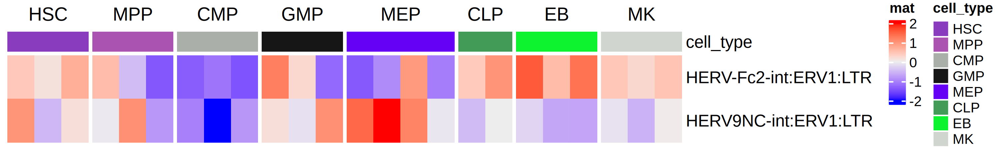

In [49]:
# significant TEs
options(repr.plot.width = 10, repr.plot.height = 1.5, repr.plot.res = 300)

te_sel = c('HERV-Fc2-int:ERV1:LTR', 'HERV9NC-int:ERV1:LTR')
plotdat = logcpm_te[te_sel, rownames(dsn_all_df_n24)]

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df_n24)
#column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F, # row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, #left_annotation = column_ra, 
        column_split = factor(dsn_all_df_n24$cell_type, levels = cell_types))  

In [51]:
deg_te_dt[rn %in% te_sel & FDR < 0.1, ]

.id,rn,logFC,logCPM,PValue,FDR,sel,idd,class_id,family_id,gene_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<int>,<chr>,<chr>,<chr>
CMP,HERV-Fc2-int:ERV1:LTR,-5.836303,3.272306,0.0024589130,0.05725000,TRUE,2594,LTR,ERV1,HERV-Fc2-int
MEP,HERV9NC-int:ERV1:LTR,1.447435,5.995318,0.0002085416,0.07524549,TRUE,5083,LTR,ERV1,HERV9NC-int


# motifs anlaysis 1

## run1 

In [171]:
deg_telocal_MEPCMP[, target := sub('.*__', '', .id) ]

In [153]:
logcpm_telocal_mep = readRDS(file = 'data/logcpm_telocal_mep.rds')
logcpm_telocal_cmp = readRDS(file = 'data/logcpm_telocal_cmp.rds')


In [173]:
sig1 = deg_telocal_MEPCMP[target %in% c('EB') & batch == 'MEP' & logFC > 1   & FDR < 0.05 & class_id == 'LTR', ]  
sig2 = deg_telocal_MEPCMP[target %in% c('HSC') & batch == 'MEP' & logFC < -1 & FDR < 0.05 & class_id == 'LTR', ]  
sig  = as.data.table(rbind(sig1, sig2))[!duplicated(rn), ]
head(sig)

.id,rn,logFC,logCPM,PValue,FDR,class_id,batch,target
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
deg_MEP__EB,MSTD_dup4711:MSTD:ERVL-MaLR:LTR,15.20494,10.265691,6.851223e-11,2.913003e-06,LTR,MEP,EB
deg_MEP__EB,L1ME3G_dup281:L1ME3G:L1:LINE,13.27746,8.341317,8.791349e-09,8.317990e-05,LINE,MEP,EB
deg_MEP__EB,L1MC5a_dup9954:L1MC5a:L1:LINE,13.32653,8.390285,9.338370e-09,8.317990e-05,LINE,MEP,EB
deg_MEP__EB,L1PA10_dup901:L1PA10:L1:LINE,12.47703,7.543926,8.074005e-08,8.317990e-05,LINE,MEP,EB
deg_MEP__EB,LTR2_dup109:Harlequin-int:ERV1:LTR,14.15036,9.212295,9.138267e-08,8.317990e-05,LTR,MEP,EB
deg_MEP__EB,L1MA4A_dup1872:L1MA4A:L1:LINE,11.97498,7.045052,1.870330e-07,8.317990e-05,LINE,MEP,EB


In [177]:
bak1 = deg_telocal_MEPCMP[target %in% c('EB') & batch == 'MEP'  & PValue > 0.1 & class_id == 'LTR', ]  
bak2 = deg_telocal_MEPCMP[target %in% c('HSC') & batch == 'MEP' & PValue > 0.1 & class_id == 'LTR', ]  
bak  = as.data.table(rbind(bak1, bak2))[!duplicated(rn), ]
dim(bak)
head(bak)


[1] 1947    9

.id,rn,logFC,logCPM,PValue,FDR,class_id,batch,target
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
deg_MEP__EB,MER21B_dup403:MER21B:ERVL:LTR,-4.375534,7.530985,0.1005860,0.2483864,LTR,MEP,EB
deg_MEP__EB,THE1B_dup14364:THE1B:ERVL-MaLR:LTR,-5.143305,6.583940,0.1009512,0.2491435,LTR,MEP,EB
deg_MEP__EB,MSTD_dup1388:MSTD:ERVL-MaLR:LTR,6.286442,1.889826,0.1011019,0.2494430,LTR,MEP,EB
deg_MEP__EB,THE1A_dup2575:THE1A:ERVL-MaLR:LTR,6.286442,1.889826,0.1011019,0.2494430,LTR,MEP,EB
deg_MEP__EB,THE1B_dup2891:THE1B:ERVL-MaLR:LTR,6.286442,1.889826,0.1011019,0.2494430,LTR,MEP,EB
deg_MEP__EB,MER51A_dup144:HERV4_I:ERV1:LTR,3.502148,2.461855,0.1013226,0.2498859,LTR,MEP,EB


In [191]:
dim(te_dt[class_id == 'LTR', ])

[1] 751651     14

In [192]:
run = 'motif1'
# LTR, LINE, SINE, Retroposon, DNA
setkey(te_dt, 'idd')
sig_bed = te_dt[sig$rn, .(chr, start, end, idd)][!duplicated(idd), ]
sig_bed[, start := start - 2000 ]
sig_bed[, end := end + 2000 ]
bak_bed = te_dt[!(idd %in% sig$rn), .(chr, start, end, idd)][!duplicated(idd), ]
bak_bed[, start := start - 2000 ]
bak_bed[, end := end + 2000 ]
pos_file = paste0('data/', run, '_pos.bed')
neg_file = paste0('data/', run, '_neg.bed')
fwrite(sig_bed, file = pos_file, sep = '\t', col.names = F) 
fwrite(bak_bed, file = neg_file, sep = '\t', col.names = F) 
cmd = paste0(' findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file)
cmd = paste0(cmd, ' -mknown /home/whu78/data/knownTFs/vertebrates/known.motifs -fdr 10 -p 15 -dumpFasta')
cmd


[1] " findMotifsGenome.pl data/motif1_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/motif1 -size given -len 8 -bg data/motif1_neg.bed -mknown /home/whu78/data/knownTFs/vertebrates/known.motifs -fdr 10 -p 15 -dumpFasta"

In [179]:
run = 'motif1'
# LTR, LINE, SINE, Retroposon, DNA
setkey(te_dt, 'idd')
sig_bed = te_dt[sig$rn, .(chr, start, end, idd)][!duplicated(idd), ]
sig_bed[, start := start - 2000 ]
sig_bed[, end := end + 2000 ]
bak_bed = te_dt[bak$rn, .(chr, start, end, idd)][!duplicated(idd), ]
bak_bed[, start := start - 2000 ]
bak_bed[, end := end + 2000 ]
pos_file = paste0('data/', run, '_pos.bed')
neg_file = paste0('data/', run, '_neg.bed')
fwrite(sig_bed, file = pos_file, sep = '\t', col.names = F) 
fwrite(bak_bed, file = neg_file, sep = '\t', col.names = F) 
cmd = paste0(' findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file)
cmd = paste0(cmd, ' -mknown /home/whu78/data/knownTFs/vertebrates/known.motifs -fdr 10 -p 15 -dumpFasta')
cmd


[1] " findMotifsGenome.pl data/motif1_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/motif1 -size given -len 8 -bg data/motif1_neg.bed -mknown /home/whu78/data/knownTFs/vertebrates/known.motifs -fdr 10 -p 15 -dumpFasta"

Name,Consensus,P-value,FDR,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ZNF41(Zf)/HEK293-ZNF41.GFP-ChIP-Seq(GSE58341)/Homer,CCTCATGGTGYCYTWYTCCCTTGTG,1e-245,0,9.75,3.28,2.972561
YY1(Zf)/Promoter/Homer,CAAGATGGCGGC,1e-92,0,9.90,5.36,1.847015
Zfp281(Zf)/ES-Zfp281-ChIP-Seq(GSE81042)/Homer,CCCCTCCCCCAC,1e-104,0,14.03,8.27,1.696493
Six4(Homeobox)/MCF7-SIX4-ChIP-Seq(Encode)/Homer,TGWAAYCTGABACCB,1e-95,0,18.60,12.17,1.528348
"FOXA1:AR(Forkhead,NR)/LNCAP-AR-ChIP-Seq(GSE27824)/Homer",AGTAAACAAAAAAGAACAND,1e-95,0,32.66,24.47,1.334696
Zscan4c(Zf)/ESC-Zscan4c-ChIP-seq(GSE140619)/Homer,ATRTGTGCAC,1e-148,0,52.97,41.47,1.277309
"OCT:OCT(POU,Homeobox)/NPC-OCT6-ChIP-Seq(GSE43916)/Homer",YATGCATATRCATRT,1e-103,0,55.74,46.14,1.208062
RUNX(Runt)/HPC7-Runx1-ChIP-Seq(GSE22178)/Homer,SAAACCACAG,1e-93,0,78.70,70.62,1.114415
"Oct2(POU,Homeobox)/Bcell-Oct2-ChIP-Seq(GSE21512)/Homer",ATATGCAAAT,1e-102,0,78.92,70.46,1.120068


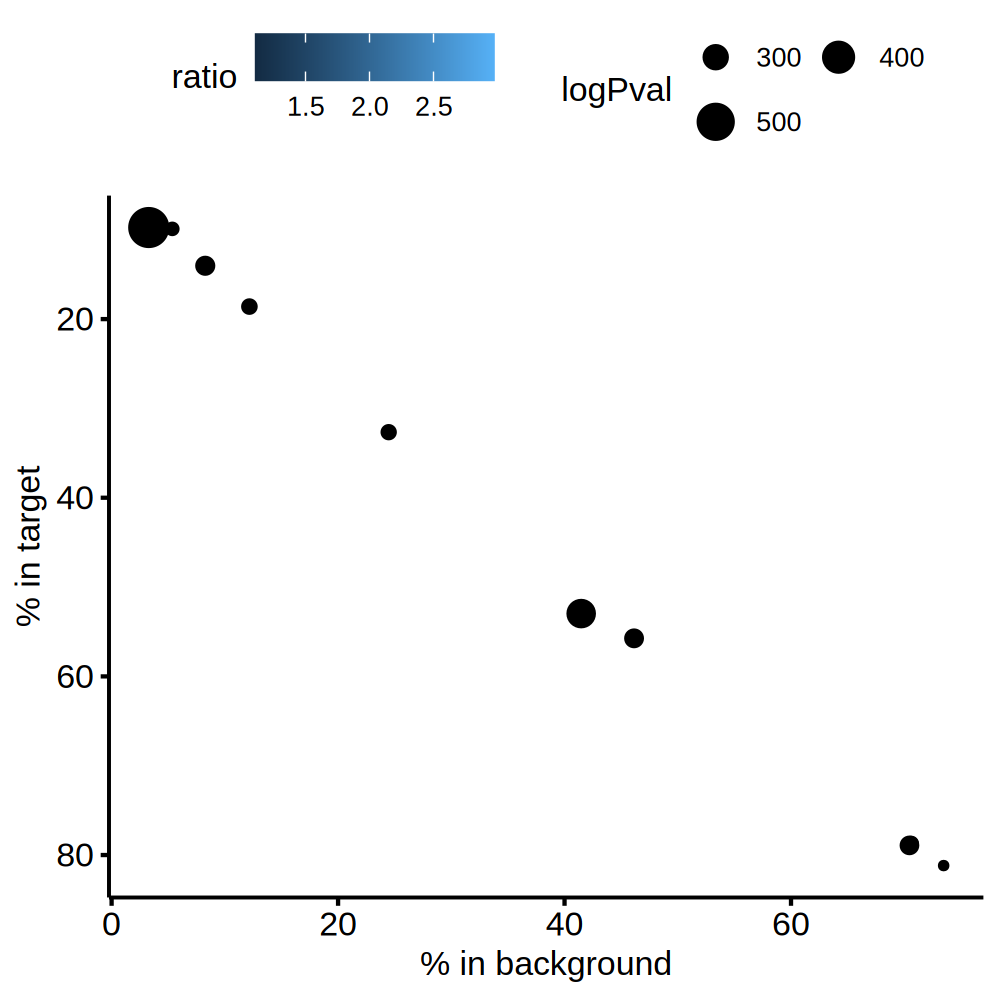

In [189]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 5, 'FDR')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, FDR, target, background, ratio)] 
plotdat[ratio > 10, ratio := 10]
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, ceiling(max(plotdat$ratio))))

ggscatter(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, fill = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE)) + scale_x_reverse()


# motif analysis

In [23]:
#deg_telocal_dt_LTR = deg_telocal_dt[class_id %in% c('LTR', 'LINE'), ]
deg_telocal_dt_info = deg_telocal_dt[, FDR2 := p.adjust(PValue)]
deg_telocal_dt_info = merge(deg_telocal_dt_info, te_dt[, .(chr, exon, start, end, idd)], by.x = 'rn', by.y = 'idd', all.x = T)
head(deg_telocal_dt_info)


rn,.id,logFC,logCPM,PValue,FDR,class_id,family_id,gene_id,tx_id,updn,FDR2,chr,exon,start,end
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<int>,<int>
(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,HSC,-0.2045996,3.058810,1.0000000,1.0000000,Satellite,Satellite,(CATTC)n,(CATTC)n_dup104,dn,1,chr9,exon,60281918,60341848
(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,MPP,-1.2724648,3.058974,0.8296367,1.0000000,Satellite,Satellite,(CATTC)n,(CATTC)n_dup104,dn,1,chr9,exon,60281918,60341848
(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,CMP,-7.0781157,3.059221,0.0823957,0.3607500,Satellite,Satellite,(CATTC)n,(CATTC)n_dup104,dn,1,chr9,exon,60281918,60341848
(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,GMP,1.8714908,3.058965,0.1625565,0.8520645,Satellite,Satellite,(CATTC)n,(CATTC)n_dup104,up,1,chr9,exon,60281918,60341848
(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,MEP,-7.1454979,3.063239,0.0273282,0.2092134,Satellite,Satellite,(CATTC)n,(CATTC)n_dup104,dn,1,chr9,exon,60281918,60341848
(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,CLP,-0.4538207,3.058178,1.0000000,1.0000000,Satellite,Satellite,(CATTC)n,(CATTC)n_dup104,dn,1,chr9,exon,60281918,60341848


In [ ]:
library(marge)
options('homer_path' = "/path/to/homer-4.10")

In [52]:
tmp1 = deg_telocal_dt_info[class_id == 'LTR', ]
dim(tmp1) # 71570
tmp2 = tmp1[abs(logFC) > 2 & PValue < 0.01, ] 
tmp3 = tmp1[!(abs(logFC) > 2 & PValue < 0.01), ] 
dim(tmp2) # 907
dim(tmp3) # 70663
fwrite(tmp2[, .(chr, start, end, rn)], file = 'data/deg_local_ltr_pos.bed', sep = '\t') 
fwrite(tmp3[, .(chr, start, end, rn)], file = 'data/deg_local_ltr_neg.bed', sep = '\t') 


[1] 71570    16

[1] 907  16

[1] 70663    16

In [18]:
REFERENCE_GENOME_FASTA='/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa'

#findMotifsGenome.pl deg_local_ltr_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa deg_local_ltr -size 200 -len 8 -bg deg_local_ltr_neg.bed
#-fdr -p 10 

In [61]:
table( tmp1[logFC < 0 & PValue < 0.01, .id])


CLP CMP  EB GMP MEP  MK MPP 
 28  93   6   8 216   6  11 

In [ ]:
run = 'run2'
tmp1 = deg_telocal_dt_info[class_id == 'LTR', ]
dim(tmp1) # 71570
tmp2 = tmp1[logFC < 0 & PValue < 0.05, ]
tmp3 = tmp1[!(rn %in% tmp2$rn), ]
dim(tmp2) # 529
dim(tmp3) # 70663
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(tmp2[, .(chr, start, end, rn)], file = pos_file, sep = '\t') 
fwrite(tmp3[, .(chr, start, end, rn)], file = neg_file, sep = '\t') 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size 200 -len 8 -bg ', neg_file, ' -fdr 10 -p 10')
cmd


In [65]:
run = 'run3'
tmp1 = deg_telocal_dt_info[class_id == 'LTR', ]
dim(tmp1) # 71570
tmp2 = tmp1[logFC < 0 & PValue < 0.05, ][!duplicated(rn), ]
tmp3 = tmp1[!(rn %in% tmp2$rn), ][!duplicated(rn), ]
dim(tmp2) # 529
dim(tmp3) # 70663
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(tmp2[, .(chr, start, end, rn)], file = pos_file, sep = '\t') 
fwrite(tmp3[, .(chr, start, end, rn)], file = neg_file, sep = '\t') 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size 200 -len 8 -bg ', neg_file, ' -fdr 10 -p 10')
cmd


[1] 71570    16

[1] 1028   16

[1] 2512   16

[1] "findMotifsGenome.pl data/deg_local_ltr_run3_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run3 -size 200 -len 8 -bg data/deg_local_ltr_run3_neg.bed -fdr 10 -p 10"

## run4

In [24]:
run = 'run4'
tmp1 = deg_telocal_dt_info[class_id == 'LTR', ]
dim(tmp1) # 71570
tmp2 = tmp1[logFC > 0 & PValue < 0.05, ][!duplicated(rn), ]
tmp3 = tmp1[!(rn %in% tmp2$rn), ][!duplicated(rn), ]
dim(tmp2) # 529
dim(tmp3) # 70663
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(tmp2[, .(chr, start, end, rn)], file = pos_file, sep = '\t') 
fwrite(tmp3[, .(chr, start, end, rn)], file = neg_file, sep = '\t') 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size 200 -len 8 -bg ', neg_file, ' -fdr 10 -p 10')
cmd


[1] 71570    16

[1] 673  16

[1] 2867   16

[1] "findMotifsGenome.pl data/deg_local_ltr_run4_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run4 -size 200 -len 8 -bg data/deg_local_ltr_run4_neg.bed -fdr 10 -p 10"

## run5: CMP down-regulated LTR

In [14]:
gr_anno = readRDS(file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/deg_teloccal_cmp_anno.rds')
ann = as.data.table(gr_anno@anno)
ann[, anno := annotation ]
ann[grep('Intron', annotation), anno := 'Intron' ]
ann[grep('Exon', annotation), anno := 'Exon' ]
ann[grep("3' UTR", annotation), anno := 'UTR3' ]
ann[grep("5' UTR", annotation), anno := 'UTR5' ]
ann[grep("Promoter", annotation), anno := 'Promoter' ]
ann[grep("Distal Intergenic", annotation), anno := 'Distal' ]
ann[grep("Downstream", annotation), anno := 'Downstream' ]
table(ann$anno)

In [39]:
summary(ann[anno == 'Distal' & distanceToTSS > 3000, distanceToTSS])
summary(ann[anno == 'Distal' & distanceToTSS < -3000, distanceToTSS])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   3044   21887   51276   88519  111488  779850 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-1346920   -74284   -30737   -65112   -13813    -3003 

Warning message:
"Using `bins = 30` by default. Pick better value with the argument `bins`."


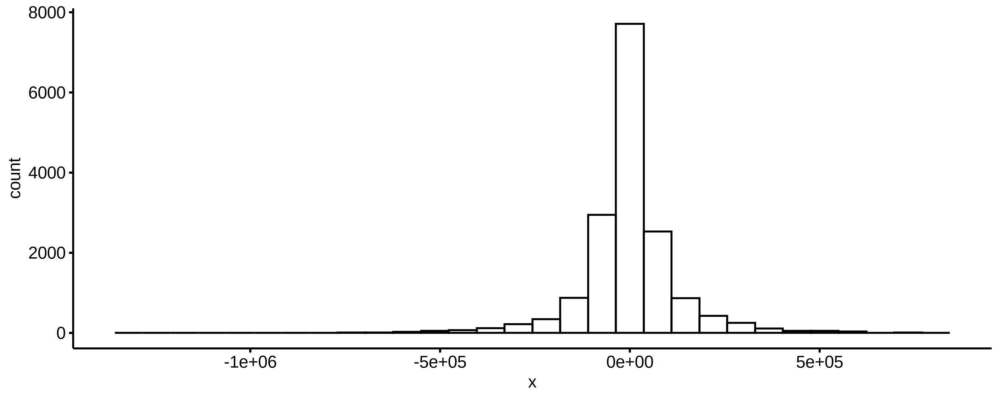

In [32]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 300)
gghistogram(ann[anno == 'Distal' & abs(distanceToTSS) > 6000, distanceToTSS])

In [17]:
summary(abs(ann[annotation == 'Distal Intergenic', 'distanceToTSS']))

 distanceToTSS    
 Min.   :   3003  
 1st Qu.:  16473  
 Median :  37640  
 Mean   :  74539  
 3rd Qu.:  89351  
 Max.   :1346920  

In [47]:
REFERENCE_GENOME_FASTA='/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa'

#findMotifsGenome.pl deg_local_ltr_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa deg_local_ltr -size 200 -len 8 -bg deg_local_ltr_neg.bed
#-fdr -p 10 

In [49]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan"

In [146]:
run = 'run_sep25_1r2' 
tmp1 = ann[anno == 'Distal' & distanceToTSS > 6000, ]
tmp1 = te_dt[idd %in% tmp1$name, ]
tmp1[strand == '+', start2 :=  start - 3000 ] 
tmp1[strand == '+', end2 := start + 3000 ] 
tmp1[strand == '-', start2 := end - 3000 ] 
tmp1[strand == '-', end2 := end + 3000 ] 
tmp1[, rn := paste0(chr, '_', start2, '_', end2, '_') ]
tmp1 = tmp1[!duplicated(rn), ]
bed_file = paste0(getwd(), '/data/', run, '.bed')
fwrite(tmp1[, .(chr, start2, end2, rn)], file = bed_file, sep = '\t', col.names = F) 
output = paste0(getwd(), '/data/', run, '/')
cmd = paste0('findMotifsGenome.pl ', bed_file, ' ', REFERENCE_GENOME_FASTA, ' ', output, ' -size given -len 8 -fdr 10 -p 10 -mknown ~/data/knownTFs/vertebrates/all.motifs &')
cmd


[1] "findMotifsGenome.pl /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_sep25_1r2.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_sep25_1r2/ -size given -len 8 -fdr 10 -p 10 -mknown ~/data/knownTFs/vertebrates/all.motifs &"

name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ZNF136,YTKGATAHAGTATTCTWGGTNGGCA,1e-60,53.39,43.84,1.217838
NFkB2-p52,VGGGRATTYCCC,1e-49,65.80,57.35,1.147341
KLF1,VDGGGYGGGGCY,1e-51,68.12,59.55,1.143913
Klf15,RGGGGGCGGGGC,1e-52,75.22,67.07,1.121515
Lhx2,TAATTAGN,1e-53,99.72,97.47,1.023084
Lhx1,NNYTAATTAR,1e-51,99.84,97.87,1.020129
DLX1,NSNNTAATTA,1e-52,99.88,97.93,1.019912
LHX9,NGCTAATTAG,1e-53,99.92,98.03,1.019280
GATA3,AGATAASR,1e-65,99.95,97.75,1.022506


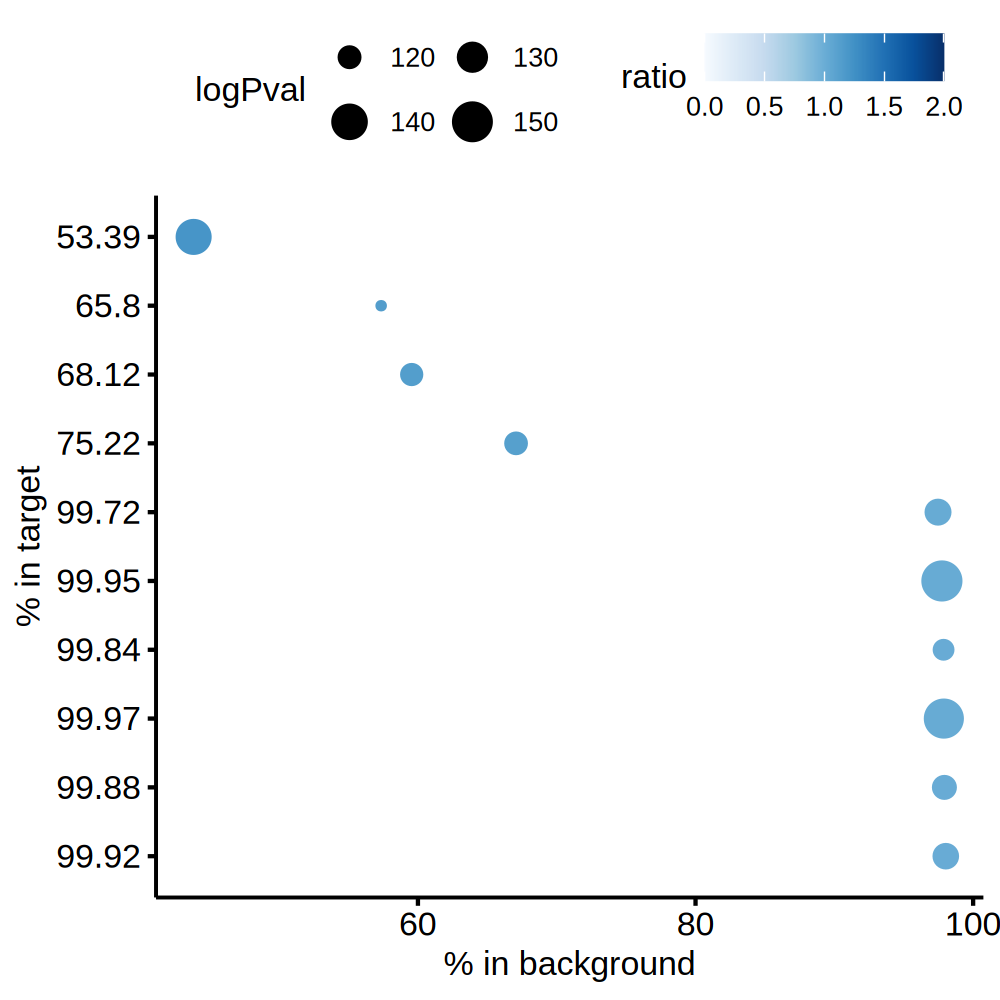

In [148]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[ratio > 10, ratio := 10]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(name, Consensus, `P-value`, target, background, ratio)] 
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 2))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


In [143]:
# next to coding genes
run = 'run_sep25_2r2' 
tmp1 = ann[!(anno == 'Distal' & distanceToTSS > 6000), .(geneChr, geneStart, geneEnd, geneStrand)]
tmp1[, chr := paste0('chr', geneChr) ]
tmp1[geneStrand == 1, start := geneStart - 3000 ] 
tmp1[geneStrand == 1, end := geneStart + 3000 ] 
tmp1[geneStrand == 2, start := geneEnd - 3000 ] 
tmp1[geneStrand == 2, end := geneEnd + 3000 ] 
tmp1[, rn := paste0(geneChr, '_', geneStart, '_', geneEnd, '_') ]
tmp1 = tmp1[!duplicated(rn), ]
dim(tmp1)
bed_file = paste0(getwd(), '/data/', run, '.bed')
fwrite(tmp1[, .(chr, start, end, rn)], file = bed_file, sep = '\t', col.names = F) 
output = paste0(getwd(), '/data/', run, '/')
cmd = paste0('findMotifsGenome.pl ', bed_file, ' ', REFERENCE_GENOME_FASTA, ' ', output, ' -size given -len 8 -fdr 10 -p 20 -mknown ~/data/knownTFs/vertebrates/all.motifs  &')
#cmd = paste0('findMotifsGenome.pl ', bed_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file, ' -fdr 10 -p 10')
cmd
#system(cmd, intern = F)


[1] 9070    8

[1] "findMotifsGenome.pl /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_sep25_2r2.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_sep25_2r2/ -size given -len 8 -fdr 10 -p 20 -mknown ~/data/knownTFs/vertebrates/all.motifs  &"

name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
NRF1,CTGCGCATGCGC,1e-114,11.74,5.42,2.166052
HINFP,TWVGGTCCGC,1e-87,27.62,18.88,1.462924
E2F4,GGCGGGAAAH,1e-69,43.57,34.41,1.266202
DLX5,SSTAATTA,1e-67,95.64,90.77,1.053652
Lhx2,TAATTAGN,1e-75,98.22,94.26,1.042011
Lhx1,NNYTAATTAR,1e-72,98.50,94.84,1.038591
DLX1,NSNNTAATTA,1e-70,99.18,96.13,1.031728
LHX9,NGCTAATTAG,1e-76,99.37,96.32,1.031665
GATA3,AGATAASR,1e-83,99.53,96.47,1.031720


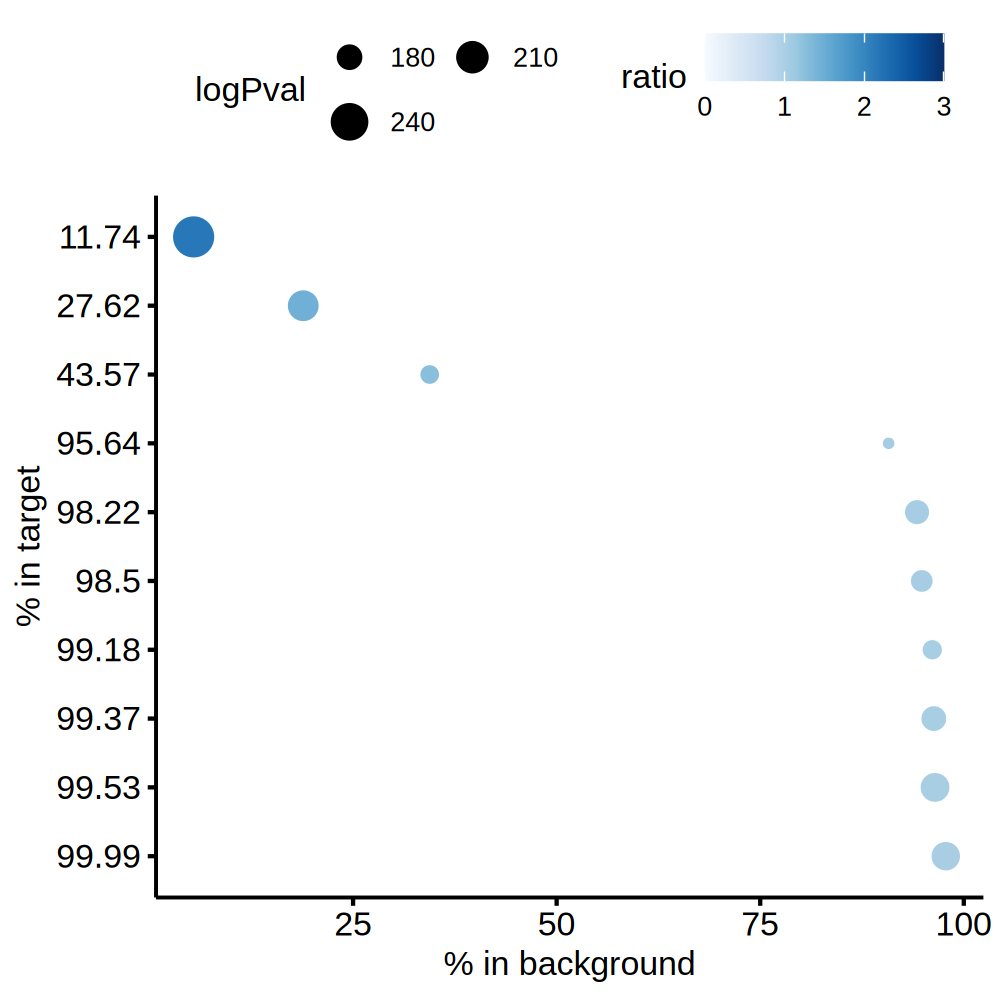

In [145]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[ratio > 10, ratio := 10]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(name, Consensus, `P-value`, target, background, ratio)] 
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 3))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


In [120]:
# the expression of these coding genes that had TE genes close to them and these TE genes were down-regulated in CMP compared with HSC
deg_coding_CMPMEP = readRDS('data/deg_coding_CMPMEP_dt.rds')
head(deg_coding_CMPMEP) 


.id,rn,logFC,logCPM,PValue,FDR,tag,batch,target
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
deg_coding_MEP_EB,GYPA,-20.10882,9.217706,3.310299e-63,1.903885e-58,MEP_EB,MEP,EB
deg_coding_MEP_EB,PSAT1,-19.15503,8.263952,1.166767e-52,3.355272e-48,MEP_EB,MEP,EB
deg_coding_MEP_EB,SLC4A1,-17.44836,7.910684,2.315858e-50,4.439809e-46,MEP_EB,MEP,EB
deg_coding_MEP_EB,LOC124906441,-17.42683,6.535928,1.330049e-45,1.912411e-41,MEP_EB,MEP,EB
deg_coding_MEP_EB,HBBP1,-16.99341,6.102595,8.369393e-40,9.627146e-36,MEP_EB,MEP,EB
deg_coding_MEP_EB,TLCD4,-16.32299,5.432373,1.756734e-37,1.683947e-33,MEP_EB,MEP,EB


In [177]:
length(plotdat[plotdat > 10000])
(plotdat[plotdat > 10000])

[1] 101

[1]   11424   12248   18672   10577   10053   49560   14141   11951   20803
 [10]   10488   10155   62349   18167   10706   14091   19002   13275   15971
 [19]   26723   28176   26559   13399   10089   16685   43667   26497   14960
 [28]   10090   11067   32685   57917   31959   18332   10679   24366   14300
 [37]   14300   15111   10718   15830   33286   68809   20031   22444   10455
 [46]   21860   19965   22443   19965   26574   16990   10476   22444   21199
 [55]   19965   10194   22419   20144   11612   10231   14318   24070 5063573
 [64]   18684  331009   12893   11615   10491   11330   26609   13058   10089
 [73]   16684   23256   27038   10733  242485   14788   10088   11064   36712
 [82]   11552   13457  281029   26514   11204   11042   27796   10533   16053
 [91]   12211   18100 3342370   15914   10738   24036   14756   13774   12826
[100]  321187   46729

In [127]:
# the expression change of these coding genes
tmp1 = ann[!(anno == 'Distal' & distanceToTSS > 6000), ]
length(unique(tmp1$geneId))
dim(deg_coding_CMPMEP[rn %in% tmp1$geneId & batch == 'CMP' & target == 'HSC', ])
dim(deg_coding_CMPMEP[rn %in% tmp1$geneId & batch == 'CMP' & target == 'HSC' & FDR < 0.1, ])
deg_coding_CMPMEP[rn %in% tmp1$geneId & batch == 'CMP' & target == 'HSC' & FDR < 0.1, ]

[1] 8242

[1] 8157    9

[1] 12  9

.id,rn,logFC,logCPM,PValue,FDR,tag,batch,target
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
deg_coding_CMP_HSC,EBF1,-10.556095,3.393450,1.410318e-08,0.0001622261,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,CACNB4,-11.928691,2.772457,5.468286e-07,0.0028591183,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,ZSCAN32,-8.737021,3.087804,1.349420e-06,0.0059654673,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,MPO,-3.333523,11.963096,1.555830e-06,0.0059654673,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,NAPSB,-13.041210,2.159986,9.063993e-06,0.0239061464,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,LINC02035,-12.955294,2.074362,1.624622e-05,0.0359378889,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,FHIP2A,-3.288692,5.323804,2.099750e-05,0.0407801044,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,ZNF483,-9.588750,2.631762,2.163597e-05,0.0407801044,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,HGF,-2.773511,5.865068,2.236120e-05,0.0407801044,CMP_HSC,CMP,HSC


In [105]:
cell_sel = c('HSC1', 'HSC2',  'HSC3',  'CMP1', 'CMP2', 'CMP3', 'GMP1', 'GMP2', 'GMP3')
mtx_sel = mtx_coding_df[, cell_sel]
logcpm_3cells = logcpm_fun(mtx_sel)

In [128]:
deg_coding_CMPMEP[rn %in% tmp1$geneId & batch == 'CMP' & target == 'HSC' & FDR < 0.1, ]

.id,rn,logFC,logCPM,PValue,FDR,tag,batch,target
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
deg_coding_CMP_HSC,EBF1,-10.556095,3.393450,1.410318e-08,0.0001622261,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,CACNB4,-11.928691,2.772457,5.468286e-07,0.0028591183,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,ZSCAN32,-8.737021,3.087804,1.349420e-06,0.0059654673,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,MPO,-3.333523,11.963096,1.555830e-06,0.0059654673,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,NAPSB,-13.041210,2.159986,9.063993e-06,0.0239061464,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,LINC02035,-12.955294,2.074362,1.624622e-05,0.0359378889,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,FHIP2A,-3.288692,5.323804,2.099750e-05,0.0407801044,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,ZNF483,-9.588750,2.631762,2.163597e-05,0.0407801044,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,HGF,-2.773511,5.865068,2.236120e-05,0.0407801044,CMP_HSC,CMP,HSC


In [129]:
mtx_coding_df[rownames(mtx_coding_df) %in% deg_coding_CMPMEP[rn %in% tmp1$geneId & batch == 'CMP' & target == 'HSC' & FDR < 0.05, rn], c(cell_sel, 'CLP1', 'CLP3')]

,HSC1,HSC2,HSC3,CMP1,CMP2,CMP3,GMP1,GMP2,GMP3,CLP1,CLP3
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
CACNB4,679,383,634,0,1,0,2221,653,1171,1174,701
EBF1,1339,1176,1153,2,0,3,3830,1759,832,15500,8252
FHIP2A,7563,854,1766,1560,369,1057,7663,10240,4725,5509,2265
HGF,324,503,453,1996,3164,997,9117,9029,12251,4076,762
IFNGR1,12566,1270,2676,2170,2036,2318,26920,8942,4243,19547,3726
LINC02035,210,353,242,0,0,0,749,444,1251,256,199
MPO,55,196,7,37237,144493,101406,1338648,249956,560085,402694,1823
NAPSB,0,0,9,0,0,0,504,1549,745,0,246
TESPA1,4961,7911,2339,46820,49883,29494,4707,8865,7055,5333,1580


In [130]:
logcpm_3cells[rownames(logcpm_3cells) %in% deg_coding_CMPMEP[rn %in% tmp1$geneId & batch == 'CMP' & target == 'HSC' & FDR < 0.1, rn], ]

,HSC1,HSC2,HSC3,CMP1,CMP2,CMP3,GMP1,GMP2,GMP3
CACNB4,3.0548703,3.241091,4.380378,-5.525504,-5.109782,-5.525504,4.583228,2.556250,3.813731
EBF1,4.0326839,4.857328,5.242539,-4.812437,-5.525504,-4.325577,5.368814,3.982498,3.321553
FAM124B,6.5877680,5.689227,5.998062,6.479983,7.040983,7.711353,4.411843,4.976581,5.076799
FHIP2A,6.5289108,4.396155,5.857344,3.439249,1.431406,3.313937,6.368999,6.522245,5.824628
HGF,1.9915763,3.633515,3.896007,3.794184,4.521167,3.229817,6.619589,6.340713,7.198802
IFNGR1,7.2612707,4.968188,6.456753,3.914586,3.885911,4.445128,8.181425,6.326748,5.669461
LINC02035,1.3702410,3.123697,2.993336,-5.525504,-5.525504,-5.525504,3.017621,2.002231,3.908929
MPO,-0.5288983,2.277758,-1.991826,8.013599,10.032939,9.894841,13.817274,11.131304,12.713268
NAPSB,-5.5255043,-5.525504,-1.657208,-5.525504,-5.525504,-5.525504,2.447958,3.799349,3.162575
TESPA1,5.9207610,7.606380,6.262618,8.343962,8.498616,8.113272,5.666136,6.314274,6.402777


In [118]:
table(deg_coding_CMPMEP[rn %in% tmp1$geneId & batch == 'CMP', target])


 GMP  HSC 
8157 8157 

In [135]:
ann[geneId == 'IFNGR1', ]

seqnames,start,end,width,strand,name,annotation,geneChr,geneStart,geneEnd,geneLength,geneStrand,geneId,transcriptId,distanceToTSS,flank_txIds,flank_geneIds,flank_gene_distances,anno
<fct>,<int>,<int>,<int>,<fct>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>
chr6,138395948,138396300,353,*,THE1A_dup1758:THE1A:ERVL-MaLR:LTR,"Intron (XM_054355328.1/IFNGR1, intron 2 of 7)",6,138385847,138407049,21203,2,IFNGR1,XM_054355328.1,10749,XM_054355328.1;XM_054355327.1;NM_001363526.1;NM_001363527.1;XM_054355326.1;XM_054355329.1;NM_000416.3,IFNGR1;IFNGR1;IFNGR1;IFNGR1;IFNGR1;IFNGR1;IFNGR1,0;0;0;0;0;0;0,Intron
chr6,138396301,138397857,1557,*,THE1A_dup1758:THE1A:ERVL-MaLR:LTR,"Intron (XM_054355328.1/IFNGR1, intron 2 of 7)",6,138385847,138407049,21203,2,IFNGR1,XM_054355328.1,9192,XM_054355328.1;XM_054355327.1;NM_001363526.1;NM_001363527.1;XM_054355326.1;XM_054355329.1;NM_000416.3,IFNGR1;IFNGR1;IFNGR1;IFNGR1;IFNGR1;IFNGR1;IFNGR1,0;0;0;0;0;0;0,Intron
chr6,138397860,138398214,355,*,THE1A_dup1758:THE1A:ERVL-MaLR:LTR,"Intron (XM_054355328.1/IFNGR1, intron 2 of 7)",6,138385847,138407049,21203,2,IFNGR1,XM_054355328.1,8835,XM_054355328.1;XM_054355327.1;NM_001363526.1;NM_001363527.1;XM_054355326.1;XM_054355329.1;NM_000416.3,IFNGR1;IFNGR1;IFNGR1;IFNGR1;IFNGR1;IFNGR1;IFNGR1,0;0;0;0;0;0;0,Intron


In [137]:
deg_telocal_MEPCMP[rn == 'THE1A_dup1758:THE1A:ERVL-MaLR:LTR', ]

.id,rn,logFC,logCPM,PValue,FDR,batch,target,class_id,family_id,gene_id,tx_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
deg_telocal_MEP_EB,THE1A_dup1758:THE1A:ERVL-MaLR:LTR,5.8802090,2.548484,0.19445024,0.34148831,MEP,EB,LTR,ERVL-MaLR,THE1A,THE1A_dup1758
deg_telocal_MEP_CMP,THE1A_dup1758:THE1A:ERVL-MaLR:LTR,4.2248142,2.681794,0.43626121,1.00000000,MEP,CMP,LTR,ERVL-MaLR,THE1A,THE1A_dup1758
deg_telocal_MEP_HSC,THE1A_dup1758:THE1A:ERVL-MaLR:LTR,-0.7909717,3.395870,0.70505175,0.86658928,MEP,HSC,LTR,ERVL-MaLR,THE1A,THE1A_dup1758
deg_telocal_CMP_HSC,THE1A_dup1758:THE1A:ERVL-MaLR:LTR,-5.3963960,3.092389,0.04069299,0.08940198,CMP,HSC,LTR,ERVL-MaLR,THE1A,THE1A_dup1758
deg_telocal_CMP_GMP,THE1A_dup1758:THE1A:ERVL-MaLR:LTR,-8.2513012,5.918662,0.05221356,0.98262471,CMP,GMP,LTR,ERVL-MaLR,THE1A,THE1A_dup1758


In [142]:
xx = te_dt[idd == 'THE1A_dup1758:THE1A:ERVL-MaLR:LTR', ]
xx[, ww := end - start]
xx

chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2,ww
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
chr6,UCSC_rmsk,exon,138395948,138396300,2633,+,.,THE1A,THE1A_dup1758,ERVL-MaLR,LTR,THE1A_dup1758:THE1A:ERVL-MaLR:LTR,chr6_138395948_138396300__THE1A_dup1758:THE1A:ERVL-MaLR:LTR,352
chr6,UCSC_rmsk,exon,138396301,138397857,11696,+,.,THE1A,THE1A_dup1758,ERVL-MaLR,LTR,THE1A_dup1758:THE1A:ERVL-MaLR:LTR,chr6_138396301_138397857__THE1A_dup1758:THE1A:ERVL-MaLR:LTR,1556
chr6,UCSC_rmsk,exon,138397860,138398214,2688,+,.,THE1A,THE1A_dup1758,ERVL-MaLR,LTR,THE1A_dup1758:THE1A:ERVL-MaLR:LTR,chr6_138397860_138398214__THE1A_dup1758:THE1A:ERVL-MaLR:LTR,354


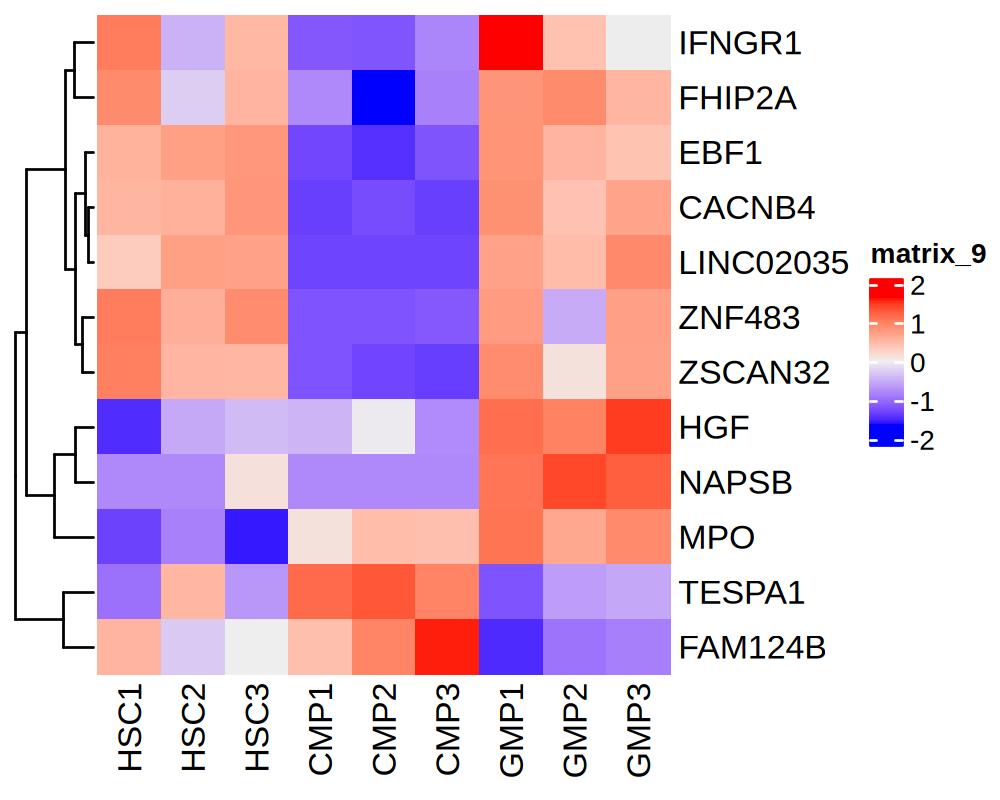

In [132]:
# top 20 up-regulated coding genes for each cell type
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
plotdat = logcpm_3cells[rownames(logcpm_3cells) %in% deg_coding_CMPMEP[rn %in% tmp1$geneId & batch == 'CMP' & target == 'HSC' & FDR < 0.1, rn], ]
plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

Heatmap(plotdat, cluster_columns = F) 


In [ ]:
cytosolic? Zinc finger protein 483 (ZNF483) regulates neuronal differentiation and methyl-CpG-binding protein 2 (MeCP2) intracellular localization
Is asymetric split on protein or rna? if TE related? 


- EBF1: early B cell factor 1
- CACNB4: Calcium Voltage-Gated Channel Auxiliary Subunit Beta 4
- ZSCAN32: Zinc Finger And SCAN Domain Containing 32
- MPO: Myeloperoxidase
- NAPSB
- LINC02035
- FHIP2A
- ZNF483
- HGF
- TESPA1
- IFNGR1

In [80]:
table(deg_coding_CMPMEP$tag)


CMP_GMP CMP_HSC MEP_CMP  MEP_EB MEP_HSC 
  57514   57514   57514   57514   57514 

In [70]:
head(deg_coding_dt)

.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
HSC,OR11K2P,9.380614,-2.944438,2.118393e-09,0.0000838354
HSC,LOC124906836,7.401834,-2.141472,2.917073e-08,0.0005772158
HSC,RPL31P64,8.223059,-3.186283,6.894059e-08,0.0009094413
HSC,KRTAP6-1,7.981290,-4.024737,9.548944e-08,0.0009447486
HSC,PCDHA7,7.744114,-4.179213,1.936259e-07,0.0015325491
HSC,PRPF4BP1,5.585529,-3.700205,5.287894e-07,0.0034878068


In [ ]:
 rsync -avur --max-size=2m hpc:/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_sep25_2r2/ ../run_sep25_2r2/

In [69]:
run = 'run_sep25_2' 
tmp1 = ann[! (anno == 'Distal' & distanceToTSS > 6000), ]
# .(geneChr, geneStart, geneEnd, geneStrand)
head(tmp1)
dim(tmp1)
summary(tmp1$width) 


seqnames,start,end,width,strand,name,annotation,geneChr,geneStart,geneEnd,geneLength,geneStrand,geneId,transcriptId,distanceToTSS,flank_txIds,flank_geneIds,flank_gene_distances,anno
<fct>,<int>,<int>,<int>,<fct>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>
chr2,231246748,231246957,210,*,Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA,"Intron (XR_008486418.1/CAB39, intron 2 of 7)",2,231207856,231208566,711,2,BANF1P3,NA,-38182,XR_008486418.1;XR_008486419.1;NM_016289.4;NM_001130849.2;NM_001130850.2,CAB39;CAB39;CAB39;CAB39;CAB39,0;0;0;0;0,Intron
chr2,231247632,231248114,483,*,Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA,"Intron (XR_008486418.1/CAB39, intron 2 of 7)",2,231207856,231208566,711,2,BANF1P3,NA,-39066,XR_008486418.1;XR_008486419.1;NM_016289.4;NM_001130849.2;NM_001130850.2,CAB39;CAB39;CAB39;CAB39;CAB39,0;0;0;0;0,Intron
chr2,231248377,231248589,213,*,Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA,"Intron (XR_008486418.1/CAB39, intron 2 of 7)",2,231207856,231208566,711,2,BANF1P3,NA,-39811,XR_008486418.1;XR_008486419.1;NM_016289.4;NM_001130849.2;NM_001130850.2,CAB39;CAB39;CAB39;CAB39;CAB39,0;0;0;0;0,Intron
chr13,19002349,19002541,193,*,Charlie1a_dup1002:Charlie1a:hAT-Charlie:DNA,Distal Intergenic,13,18922742,18979203,56462,2,PSPC1,XM_054374666.1,-23146,NA,NA,NA,Distal
chr13,19002773,19002813,41,*,Charlie1a_dup1002:Charlie1a:hAT-Charlie:DNA,Distal Intergenic,13,18922742,18979203,56462,2,PSPC1,XM_054374666.1,-23570,NA,NA,NA,Distal
chr13,19003489,19003541,53,*,Charlie1a_dup1002:Charlie1a:hAT-Charlie:DNA,Distal Intergenic,13,18922742,18979203,56462,2,PSPC1,XM_054374666.1,-24286,NA,NA,NA,Distal


[1] 32790    19

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
     11     204     431     823     943    8314 

In [65]:
run = 'run_sep25_2' 
tmp1 = ann[! (anno == 'Distal' & distanceToTSS > 6000), .(geneChr, geneStart, geneEnd, geneStrand)]
tmp1[, chr := paste0('chr', geneChr) ]
tmp1[geneStrand == 1, start := geneStart - 3000 ] 
tmp1[geneStrand == 1, end := geneStart + 3000 ] 
tmp1[geneStrand == 2, start := geneEnd - 3000 ] 
tmp1[geneStrand == 2, end := geneEnd + 3000 ] 
tmp1[, rn := paste0(geneChr, '_', geneStart, '_', geneEnd, '_') ]
tmp1 = tmp1[!duplicated(rn), ]
dim(tmp1)
bed_file = paste0(getwd(), '/data/', run, '.bed')
fwrite(tmp1[, .(chr, start, end, rn)], file = bed_file, sep = '\t', col.names = F) 
output = paste0(getwd(), '/data/', run, '/')
cmd = paste0('findMotifsGenome.pl ', bed_file, ' ', REFERENCE_GENOME_FASTA, ' ', output, ' -size given -len 8 -fdr 10 -p 10 &')
#cmd = paste0('findMotifsGenome.pl ', bed_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file, ' -fdr 10 -p 10')
cmd
#system(cmd, intern = F)


[1] 9070    8

[1] "findMotifsGenome.pl /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_sep25_2.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_sep25_2/ -size given -len 8 -fdr 10 -p 10 &"

In [57]:
basename('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_sep25_1')

[1] "run_sep25_1"

In [62]:
cmd = paste0('rsync -avur ', output, ' 10.244.134.72:~/', basename(output), '/')
cmd

[1] "rsync -avur /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_sep25_1/ 10.244.134.72:~/run_sep25_1/"

name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
RARg,AGGTCAAGGTCA,1e-06,4.31,0.61,7.065574
HOXA2,GYCATCMATCAT,1e-02,8.63,4.62,1.867965
TGA6,TGACGTCABC,1e-02,16.08,10.51,1.529971
AREB3,NKGMCACGTGDCMNN,1e-02,17.65,11.68,1.511130
NAP,ARGTTACGTRTN,1e-02,20.78,13.87,1.498198
NAM,RGTTRCGTRW,1e-02,23.14,15.68,1.475765
bZIP50,GATGACGTCA,1e-02,24.71,17.15,1.440816
NFIL3,VTTACGTAAYNNNNN,1e-02,27.45,20.03,1.370444
FoxD3,TGTTTAYTTAGC,1e-02,32.55,24.85,1.309859


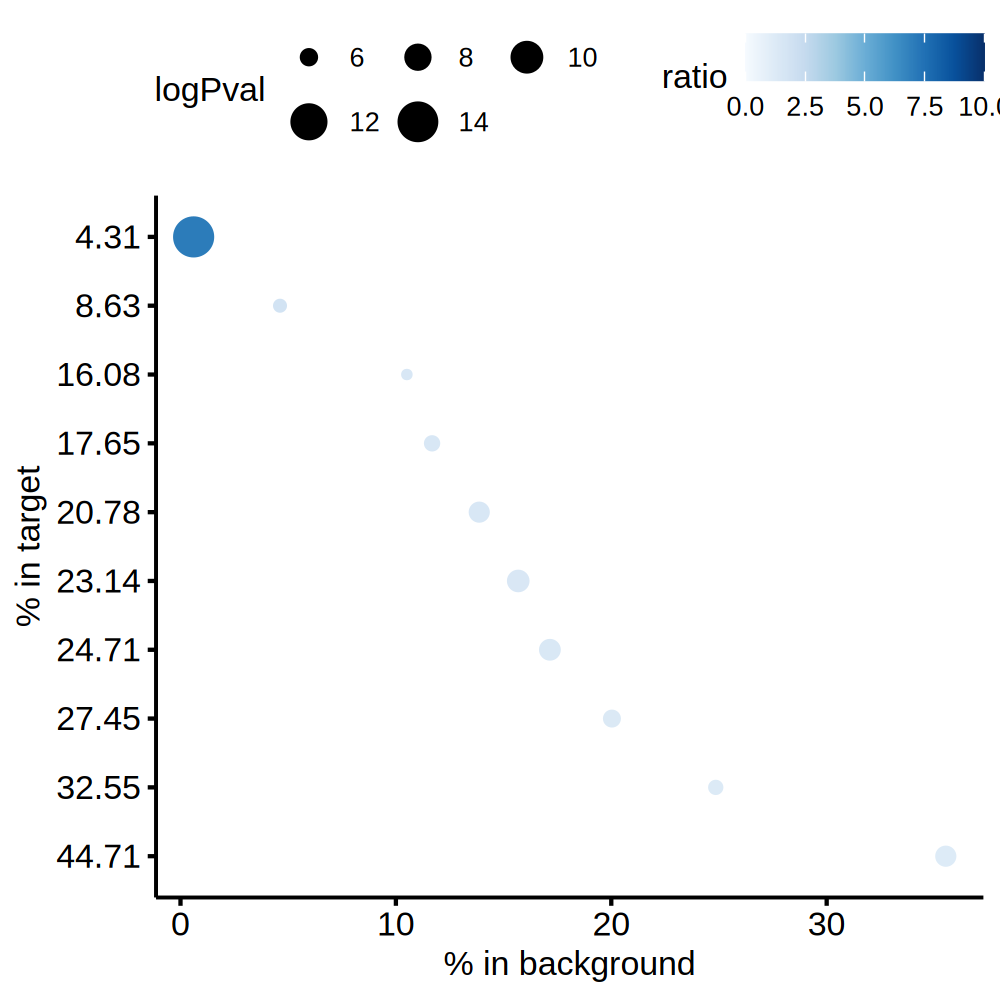

In [36]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[ratio > 10, ratio := 10]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(name, Consensus, `P-value`, target, background, ratio)] 
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 10))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
RARg(NR)/ES-RARg-ChIP-Seq(GSE30538)/Homer,AGGTCAAGGTCA,1e-06,4.31,0.61,7.065574
HOXA2(Homeobox)/mES-Hoxa2-ChIP-Seq(Donaldson_et_al.)/Homer,GYCATCMATCAT,1e-02,8.63,4.62,1.867965
TGA6(bZIP)/colamp-TGA6-DAP-Seq(GSE60143)/Homer,TGACGTCABC,1e-02,16.08,10.51,1.529971
AREB3(bZIP)/col-AREB3-DAP-Seq(GSE60143)/Homer,NKGMCACGTGDCMNN,1e-02,17.65,11.68,1.511130
NAP(NAC)/col-NAP-DAP-Seq(GSE60143)/Homer,ARGTTACGTRTN,1e-02,20.78,13.87,1.498198
NAM(NAC)/col-NAM-DAP-Seq(GSE60143)/Homer,RGTTRCGTRW,1e-02,23.14,15.68,1.475765
bZIP50(bZIP)/colamp-bZIP50-DAP-Seq(GSE60143)/Homer,GATGACGTCA,1e-02,24.71,17.15,1.440816
NFIL3(bZIP)/HepG2-NFIL3-ChIP-Seq(Encode)/Homer,VTTACGTAAYNNNNN,1e-02,27.45,20.03,1.370444
FoxD3(forkhead)/ZebrafishEmbryo-Foxd3.biotin-ChIP-seq(GSE106676)/Homer,TGTTTAYTTAGC,1e-02,32.55,24.85,1.309859


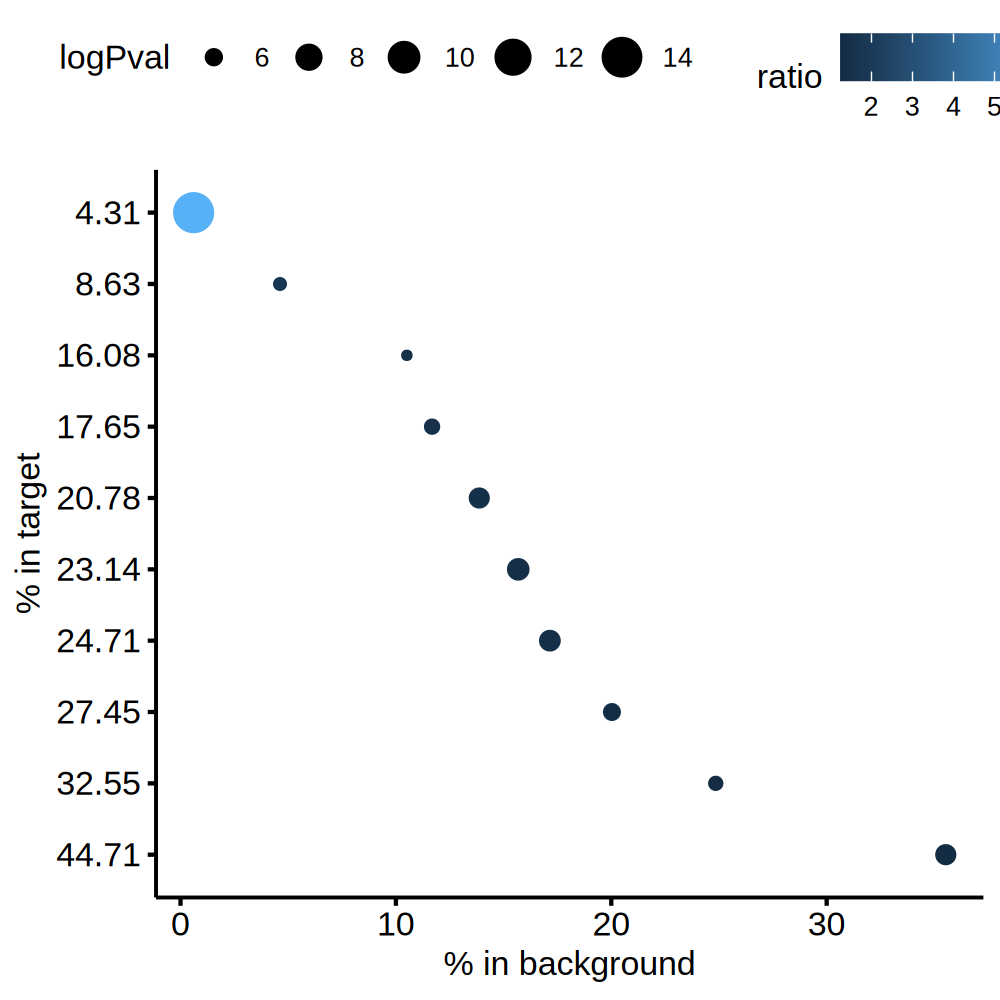

In [27]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') 


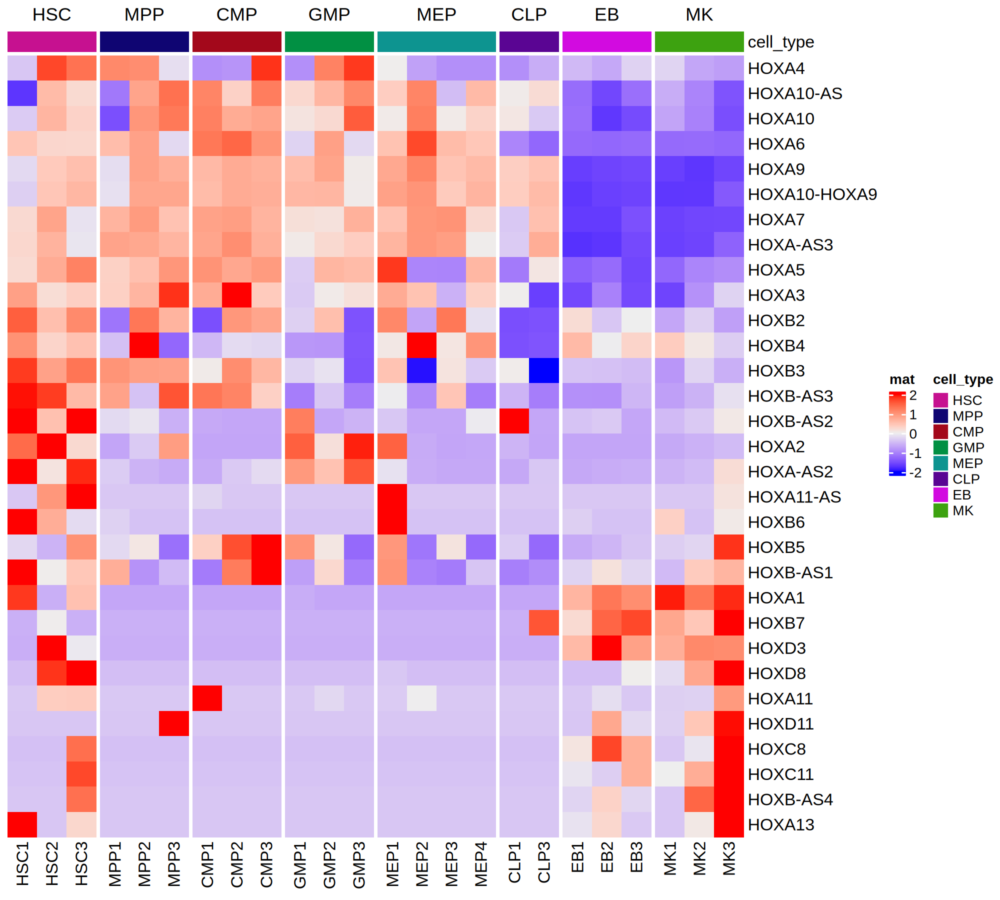

In [135]:
ov = coding_genes[grep('^HOX', coding_genes)]
ov = intersect(ov, rownames(logcpm_coding))
# all sig ones with FDr < 0.1
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)

plotdat = logcpm_coding[ov, rownames(dsn_all_df_n24)]

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df_n24[, 'cell_type', drop = F])
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(dsn_all_df_n24$cell_type, levels = cell_types))  
hp


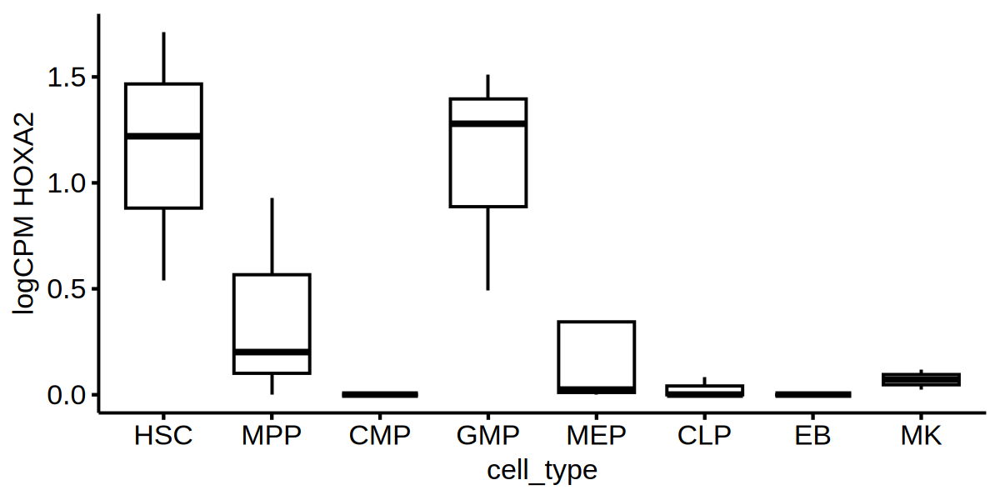

In [178]:
plotdat = logcpm_coding_t[, .(cell_type, HOXA2)]
plotdat[, cell_type := factor(cell_type, levels = cell_types)] 
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 200)
ggboxplot(plotdat, x = 'cell_type', y = 'HOXA2', outlier.shape = NA) + ylab('logCPM HOXA2')


Warning message:
"The input is a data frame-like object, convert it to a matrix."


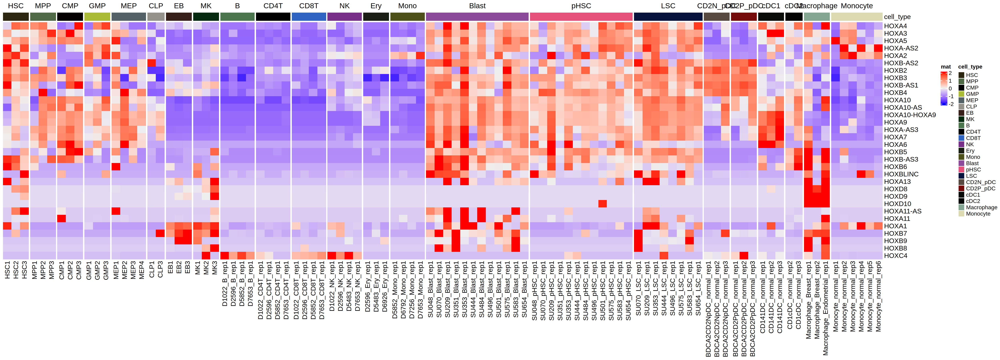

In [177]:
ov = coding_genes[grep('^HOX', coding_genes)]
ov = intersect(ov, rownames(logcpm_3batch))
# all sig ones with FDr < 0.1
options(repr.plot.width = 25, repr.plot.height = 9, repr.plot.res = 200)

plotdat = logcpm_3batch[ov, rownames(dsn_3batch_df)]

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_3batch_df[, 'cell_type', drop = F])
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(dsn_3batch_df$cell_type, levels = cell_types_3batch))  
hp


## run 6 MEP down-regulated LTR

In [41]:
run = 'run6' 
tmp1 = deg_telocal_dt_info[class_id == 'LTR', ]
dim(tmp1) # 71570
tmp2 = tmp1[logFC < 0 & PValue < 0.05 & .id %in% c('MEP'), ][!duplicated(rn), ]
tmp2[, start := start - 2000 ]
tmp2[, end := end - 2000 ]
tmp3[, start := start - 2000 ]
tmp3[, end := end - 2000 ]
tmp3 = tmp1[!(rn %in% tmp2$rn), ][!duplicated(rn), ]
dim(tmp2) # 529
dim(tmp3) # 70663
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(tmp2[, .(chr, start, end, rn)], file = pos_file, sep = '\t') 
fwrite(tmp3[, .(chr, start, end, rn)], file = neg_file, sep = '\t') 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file, ' -fdr 10 -p 10 -dumpFasta')
cmd


[1] 71570    16

[1] 723  16

[1] 2817   16

[1] "findMotifsGenome.pl data/deg_local_ltr_run6_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run6 -size given -len 8 -bg data/deg_local_ltr_run6_neg.bed -fdr 10 -p 10 -dumpFasta"

name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
HSF3,NTTCTAGAAKCTTCT,1e-12,34.30,22.43,1.529202
Fox:Ebox,NNNVCTGWGYAAACASN,1e-11,35.68,23.99,1.487286
Unknown6/Drosophila-Promoters/Homer,AATTTTAAAA,1e-14,40.25,26.58,1.514296
NLP7,TGRCCYTTCR,1e-11,47.58,34.86,1.364888
SOX1,CCATTGTTCB,1e-11,56.57,43.61,1.297180
dof43,NAAAAAGTDA,1e-11,58.23,45.29,1.285714
AT5G66940,NNHACTTTWT,1e-11,65.28,52.51,1.243192
AT2G28810,VAAAAAGTWA,1e-12,70.40,57.51,1.224135
AT5G63260,RAAAAAGTRA,1e-13,70.68,56.88,1.242616


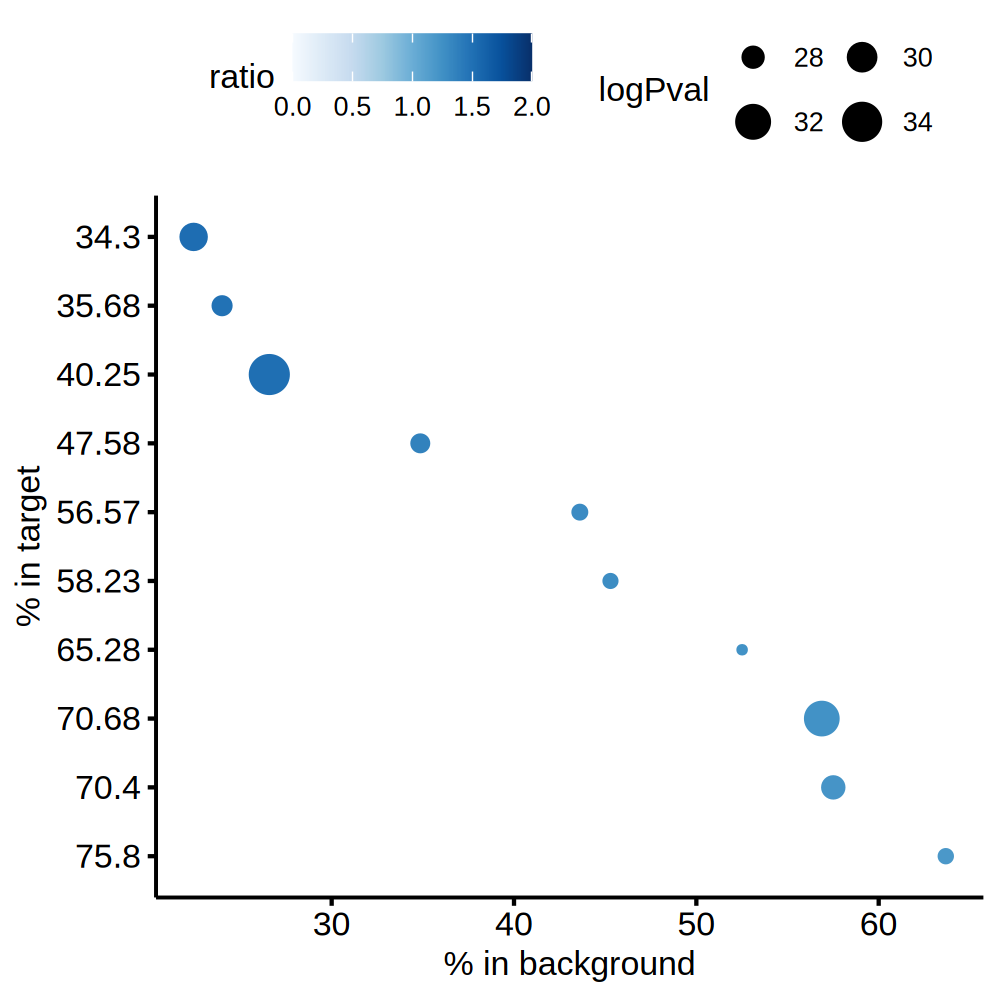

In [40]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[ratio > 10, ratio := 10]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(name, Consensus, `P-value`, target, background, ratio)] 
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 2))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


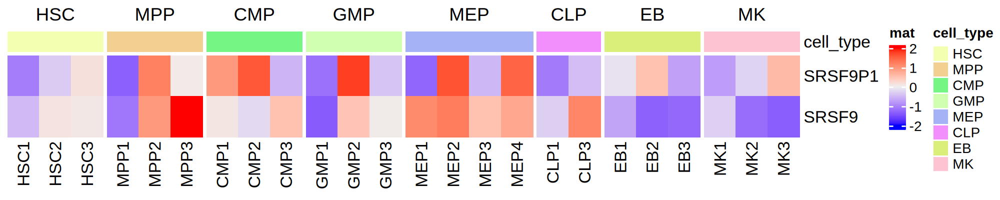

In [153]:
ov = coding_genes[grep('^SRSF9', coding_genes)]
ov = intersect(ov, rownames(logcpm_coding))
# all sig ones with FDr < 0.1
options(repr.plot.width = 10, repr.plot.height = 2, repr.plot.res = 200)

plotdat = logcpm_coding[ov, rownames(dsn_all_df_n24)]

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df_n24[, 'cell_type', drop = F])
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(dsn_all_df_n24$cell_type, levels = cell_types))  
hp


Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


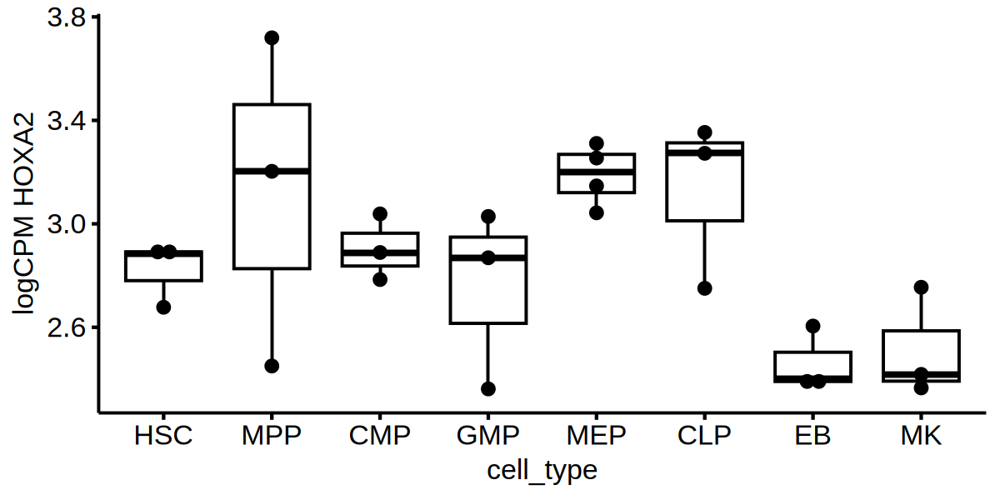

In [159]:
plotdat = logcpm_coding_t[, .(cell_type, SRSF9)]
plotdat[, cell_type := factor(cell_type, levels = cell_types)] 
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 200)
ggboxplot(plotdat, x = 'cell_type', y = 'SRSF9', outlier.shape = NA, add = 'dotplot') + ylab('logCPM HOXA2')


## run 7 MEP down-regulated LINE


In [186]:
run = 'run7' 
tmp1 = deg_telocal_dt_info[class_id == 'LINE', ]
dim(tmp1) # 71570
tmp2 = tmp1[logFC < 0 & PValue < 0.05 & .id == 'MEP', ][!duplicated(rn), ]
tmp3 = tmp1[!(rn %in% tmp2$rn), ][!duplicated(rn), ]
dim(tmp2) # 529
dim(tmp3) # 70663
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(tmp2[, .(chr, start, end, rn)], file = pos_file, sep = '\t') 
fwrite(tmp3[, .(chr, start, end, rn)], file = neg_file, sep = '\t') 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size 200 -len 8 -bg ', neg_file, ' -fdr 10 -p 10')
cmd


[1] 443738     16

[1] 5035   16

[1] 15846    16

[1] "findMotifsGenome.pl data/deg_local_ltr_run7_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run7 -size 200 -len 8 -bg data/deg_local_ltr_run7_neg.bed -fdr 10 -p 10"

Name,Consensus,P-value,target,background
<chr>,<chr>,<dbl>,<dbl>,<dbl>
AT1G24250(Orphan)/col-AT1G24250-DAP-Seq(GSE60143)/Homer,KTDGTTGGTDGTTGG,1e-04,4.73,3.69
ZNF711(Zf)/SHSY5Y-ZNF711-ChIP-Seq(GSE20673)/Homer,AGGCCTAG,1e-04,5.68,4.43
Phox2b(Homeobox)/CLBGA-PHOX2B-ChIP-Seq(GSE90683)/Homer,TTAATTNAATTA,1e-04,7.49,6.01
CES-1(Homeobox)/cElegans-L1-CES1-ChIP-Seq(modEncode)/Homer,AAATTSAATTTN,1e-04,13.55,11.59
SGR5(C2H2)/colamp-SGR5-DAP-Seq(GSE60143)/Homer,TTTGTCTTTTTT,1e-05,14.42,12.23
At5g08520(MYBrelated)/colamp-At5g08520-DAP-Seq(GSE60143)/Homer,ADBSTTATCY,1e-04,14.90,12.95
Prop1(Homeobox)/GHFT1-PROP1.biotin-ChIP-Seq(GSE77302)/Homer,NTAATBNAATTA,1e-04,18.15,16.01
IDD5(C2H2)/colamp-IDD5-DAP-Seq(GSE60143)/Homer,TTTTGTCTTTTTBTK,1e-04,20.08,18.00
PABPC1(?)/MEL-PABC1-CLIP-Seq(GSE69755)/Homer,HAATAAAGNN,1e-04,46.53,43.56


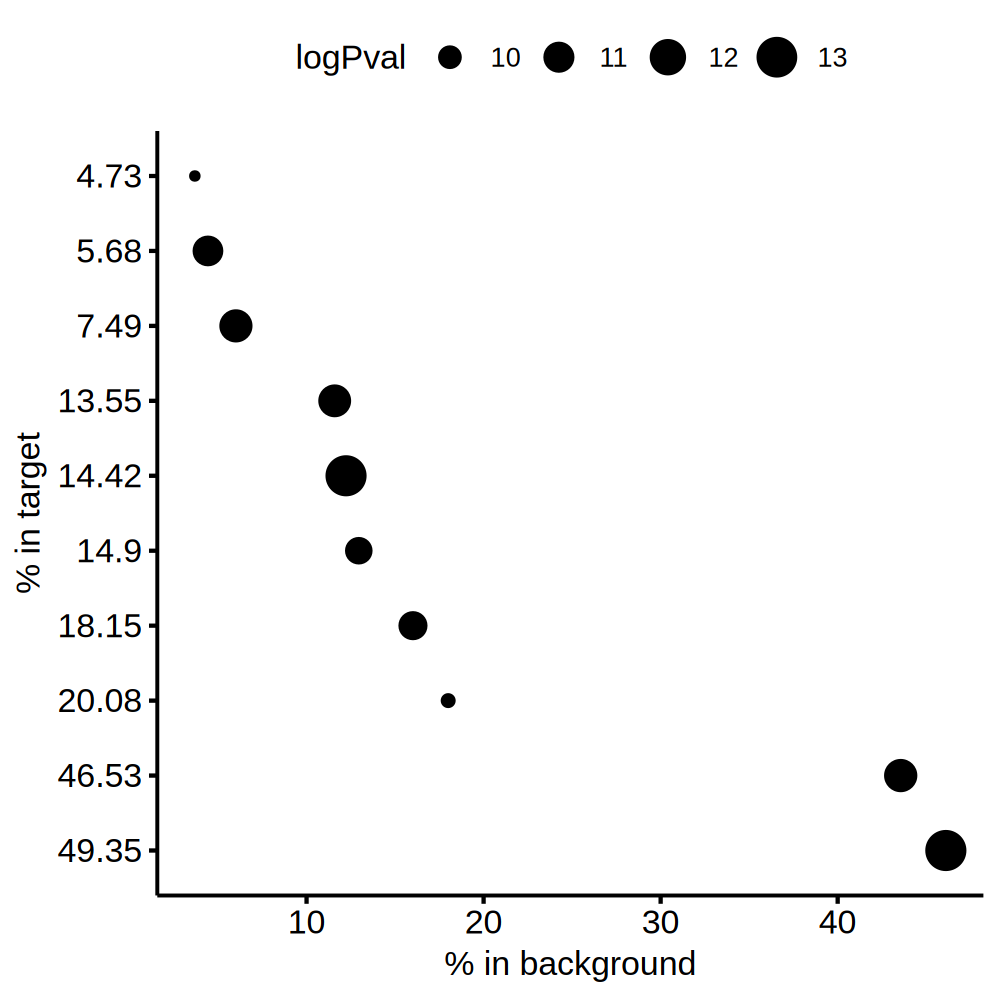

In [187]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, rr := target / background ]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background)] 
ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T) + ylab('% in background') + xlab('% in target') 


In [195]:
table(te_dt$class_id)


           DNA           DNA?           LINE Low_complexity            LTR 
        527321            148        1567840             17         751651 
            RC     Retroposon      Satellite           SINE         srpRNA 
          2267           7380          49729        1782180             16 
       Unknown 
         23274 

In [196]:
TE_class_IDs = c('SINE', 'Retroposon', 'LINE', 'LTR', 'DNA')
TE_class_IDs


[1] "SINE"       "Retroposon" "LINE"       "LTR"        "DNA"

In [198]:
table(te_dt[class_id=='Unknown', gene_id])


COMP-subunit_5SRNA_rnd-6_family-13719 COMP-subunit_5SRNA_rnd-6_family-13720 
                                  218                                   262 
  COMP-subunit_ACRO_rnd-5_family-1624   COMP-subunit_ACRO_rnd-5_family-1625 
                                  225                                   335 
    COMP-subunit_ACRO_rnd-5_family-37     COMP-subunit_ACRO_rnd-5_family-38 
                                  238                                   821 
    COMP-subunit_DAZ_rnd-1_family-113      COMP-subunit_DAZ_rnd-1_family-85 
                                    4                                    58 
  COMP-subunit_DNM1_rnd-6_family-2176  COMP-subunit_FAM90A_rnd-6_family-663 
                                  441                                   137 
COMP-subunit_FAM90A_rnd-6_family-7382 COMP-subunit_MER5A1_rnd-6_family-5959 
                                  100                                   330 
   COMP-subunit_RBMY_rnd-1_family-131    COMP-subunit_RBMY_rnd-1_family-154

## run 9: MEP up regulated

In [42]:
run = 'run9' 
tmp1 = deg_telocal_dt_info
dim(tmp1) # 71570
tmp2 = tmp1[logFC > 0 & PValue < 0.05 & .id == 'MEP', ][!duplicated(rn), ]
tmp3 = tmp1[!(rn %in% tmp2$rn), ][!duplicated(rn), ]
dim(tmp2) # 529
dim(tmp3) # 70663
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(tmp2[, .(chr, start, end, rn)], file = pos_file, sep = '\t') 
fwrite(tmp3[, .(chr, start, end, rn)], file = neg_file, sep = '\t') 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size 200 -len 8 -bg ', neg_file, ' -fdr 10 -p 10 -dumpFasta')
cmd


[1] 683665     16

[1] 2926   16

[1] 39781    16

[1] "findMotifsGenome.pl data/deg_local_ltr_run9_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run9 -size 200 -len 8 -bg data/deg_local_ltr_run9_neg.bed -fdr 10 -p 10 -dumpFasta"

name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Unknown3/Arabidopsis-Promoters/Homer,AYTAAACCGG,1e-02,1.06,0.58,1.827586
Srebp2,CGGTCACSCCAC,1e-02,4.99,3.89,1.282776
VRN1,TTTTTTTTTT,1e-03,13.19,11.14,1.184022
CEBP,ATTGCGCAAC,1e-02,14.87,13.09,1.135982
LRF,AAGACCCYYN,1e-03,18.05,15.76,1.145305
RLR1?/SacCer-Promoters/Homer,WTTTTCYYTTTT,1e-03,27.24,24.58,1.108218
ANAC046,ACACGYWAYC,1e-02,32.33,29.98,1.078386
REM19,AAAAAAAA,1e-03,33.32,30.13,1.105875
SeqBias: TA-repeat,TATATATATA,1e-04,67.22,63.68,1.055590


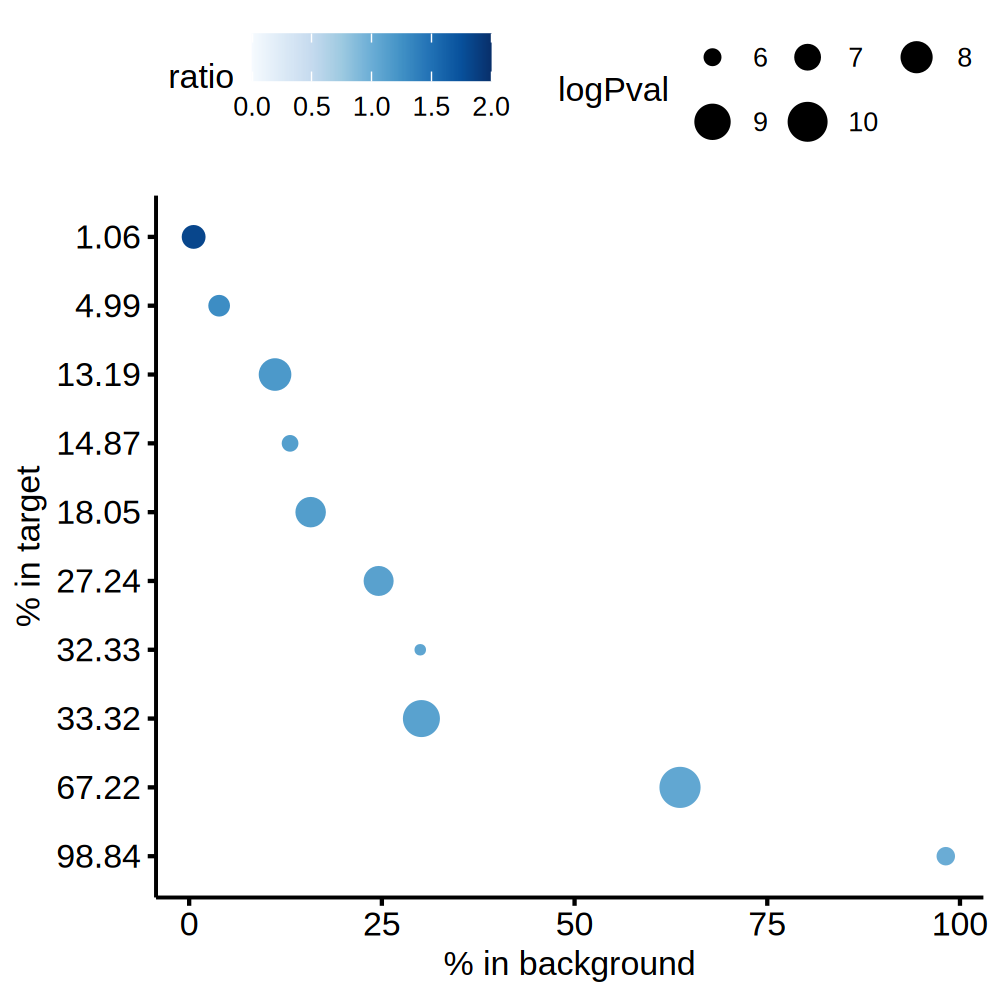

In [44]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[ratio > 10, ratio := 10]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(name, Consensus, `P-value`, target, background, ratio)] 
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 2))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


## run 10: MEP up regulated compared with EB and MK

In [291]:
run = 'run10' 
sel = deg_MEP__EB_MK[FDR < .1, rn]
tmp1 = deg_telocal_dt_info[rn %in% sel, ][!duplicated(rn), ]
tmp2 = deg_telocal_dt_info[!(rn %in% sel), ][class_id %in% TE_class_IDs, ][!duplicated(rn), ]

dim(tmp1) # 529
dim(tmp2) # 70663
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(tmp1[, .(chr, start, end, rn)], file = pos_file, sep = '\t') 
fwrite(tmp2[, .(chr, start, end, rn)], file = neg_file, sep = '\t') 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size 200 -len 8 -bg ', neg_file, ' -fdr 10 -p 10')
cmd


[1] 20615    16

[1] 21762    16

[1] "findMotifsGenome.pl data/deg_local_ltr_run10_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run10 -size 200 -len 8 -bg data/deg_local_ltr_run10_neg.bed -fdr 10 -p 10"

In [292]:
run

[1] "run10"

In [293]:
dim(tmp1)

[1] 20615    16

## run 11: MEP vs EB&MK LTR

In [16]:
add_meta_fun = function(dt){
    dt[, class_id := unlist(strsplit(rn, ':'))[4], by = 1:nrow(dt)]
    dt[, family_id:= unlist(strsplit(rn, ':'))[3], by = 1:nrow(dt)]
    dt[, gene_id  := unlist(strsplit(rn, ':'))[2], by = 1:nrow(dt)]
    dt[, transcript_id  := unlist(strsplit(rn, ':'))[1], by = 1:nrow(dt)]
    dt
}

deg_MEP__EB_MK = add_meta_fun(deg_MEP__EB_MK)

In [130]:
run = 'run11'
sel1 = unique(deg_MEP__EB_MK[FDR < .1 & class_id %in% c('LTR') & logFC < 0, rn])
sel2 = unique(deg_MEP__EB_MK[FDR >= .1 & class_id %in% c('LTR'), rn])
setkey(te_dt, 'idd')
sel1_bed = te_dt[sel1, .(chr, start, end, idd)][!duplicated(idd), ]
sel2_bed = te_dt[sel2, .(chr, start, end, idd)][!duplicated(idd) , ]
sel1_bed[, start := start - 2000 ]
sel1_bed[, end := end + 2000 ]
sel2_bed[, start := start - 2000 ]
sel2_bed[, end := end + 2000 ]
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(sel1_bed, file = pos_file, sep = '\t', col.names = F) 
fwrite(sel2_bed, file = neg_file, sep = '\t', col.names = F) 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file, ' -fdr 10 -p 10 -dumpFasta')
cmd


[1] "findMotifsGenome.pl data/deg_local_ltr_run11_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run11 -size given -len 8 -bg data/deg_local_ltr_run11_neg.bed -fdr 10 -p 10 -dumpFasta"

In [131]:
length(sel1)
length(sel2)

[1] 296

[1] 1441

In [ ]:
plotdat = fread(paste0('data/', run, '/homerMotifs.all.motifs'))
head

Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
WRKY7(WRKY)/colamp-WRKY7-DAP-Seq(GSE60143)/Homer,AAAAGTCAACGSHWD,1e-05,1.69,0.13,13.000000
AS2(LOBAS2)/col-AS2-DAP-Seq(GSE60143)/Homer,CCGDAAWWHMCGSCG,1e-02,3.38,1.18,2.864407
WRKY17(WRKY)/colamp-WRKY17-DAP-Seq(GSE60143)/Homer,GCGTTGACTTTT,1e-02,3.38,1.36,2.485294
AGL25(MADS)/colamp-AGL25-DAP-Seq(GSE60143)/Homer,TTTCCATWTWTGGAA,1e-02,21.62,15.08,1.433687
RAP212(AP2EREBP)/col-RAP212-DAP-Seq(GSE60143)/Homer,CGCCGCCATTTT,1e-02,31.76,25.36,1.252366
HAT1(Homeobox)/col-HAT1-DAP-Seq(GSE60143)/Homer,SCAATCATTGNN,1e-02,48.65,40.12,1.212612
SF1(NR)/H295R-Nr5a1-ChIP-Seq(GSE44220)/Homer,CAAGGHCANV,1e-02,59.46,51.03,1.165197
Unknown(Homeobox)/Limb-p300-ChIP-Seq/Homer,SSCMATWAAA,1e-03,93.58,87.56,1.068753
Hoxd10(Homeobox)/ChickenMSG-Hoxd10.Flag-ChIP-Seq(GSE86088)/Homer,GGCMATGAAA,1e-02,97.97,95.01,1.031155


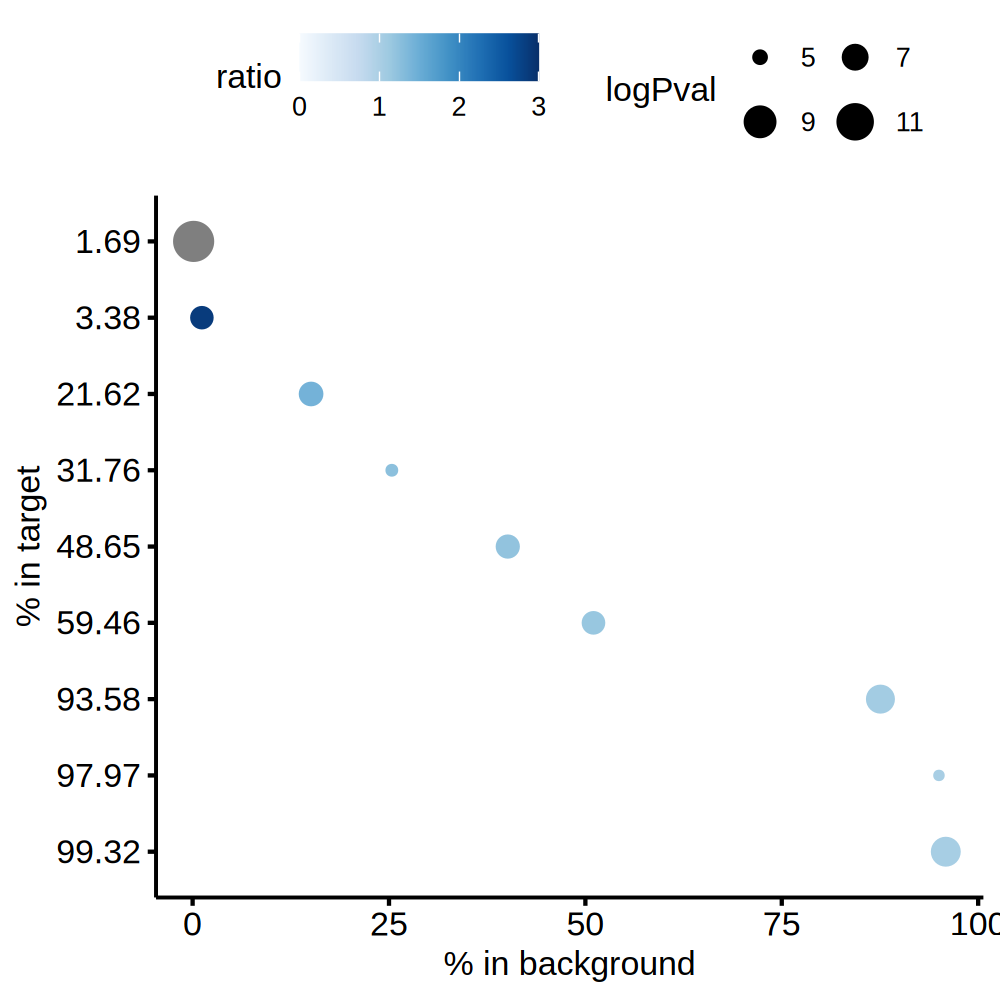

In [140]:
#up-regulated
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
plotdat[ratio > 10, ratio := 10]

myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 3)) 

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
WRKY11(WRKY)/col-WRKY11-DAP-Seq(GSE60143)/Homer,SCGTTGACTTTN,1e-09,24.65,19.12,1.289226
TCP7(TCP)/col-TCP7-DAP-Seq(GSE60143)/Homer,GTGGGSCCCACHHNN,1e-08,50.09,43.86,1.142043
SF1(NR)/H295R-Nr5a1-ChIP-Seq(GSE44220)/Homer,CAAGGHCANV,1e-11,54.81,47.22,1.160737
EWS:FLI1-fusion(ETS)/SK_N_MC-EWS:FLI1-ChIP-Seq(SRA014231)/Homer,VACAGGAAAT,1e-08,59.71,53.34,1.119423
Foxa3(Forkhead)/Liver-Foxa3-ChIP-Seq(GSE77670)/Homer,BSNTGTTTACWYWGN,1e-08,68.43,62.35,1.097514
Foxh1(Forkhead)/hESC-FOXH1-ChIP-Seq(GSE29422)/Homer,NNTGTGGATTSS,1e-08,83.13,77.91,1.067000
Sox9(HMG)/Limb-SOX9-ChIP-Seq(GSE73225)/Homer,AGGVNCCTTTGT,1e-09,87.32,82.45,1.059066
LEF1(HMG)/H1-LEF1-ChIP-Seq(GSE64758)/Homer,CCTTTGATST,1e-08,87.89,83.48,1.052827
ETV1(ETS)/GIST48-ETV1-ChIP-Seq(GSE22441)/Homer,AACCGGAAGT,1e-10,88.50,83.37,1.061533


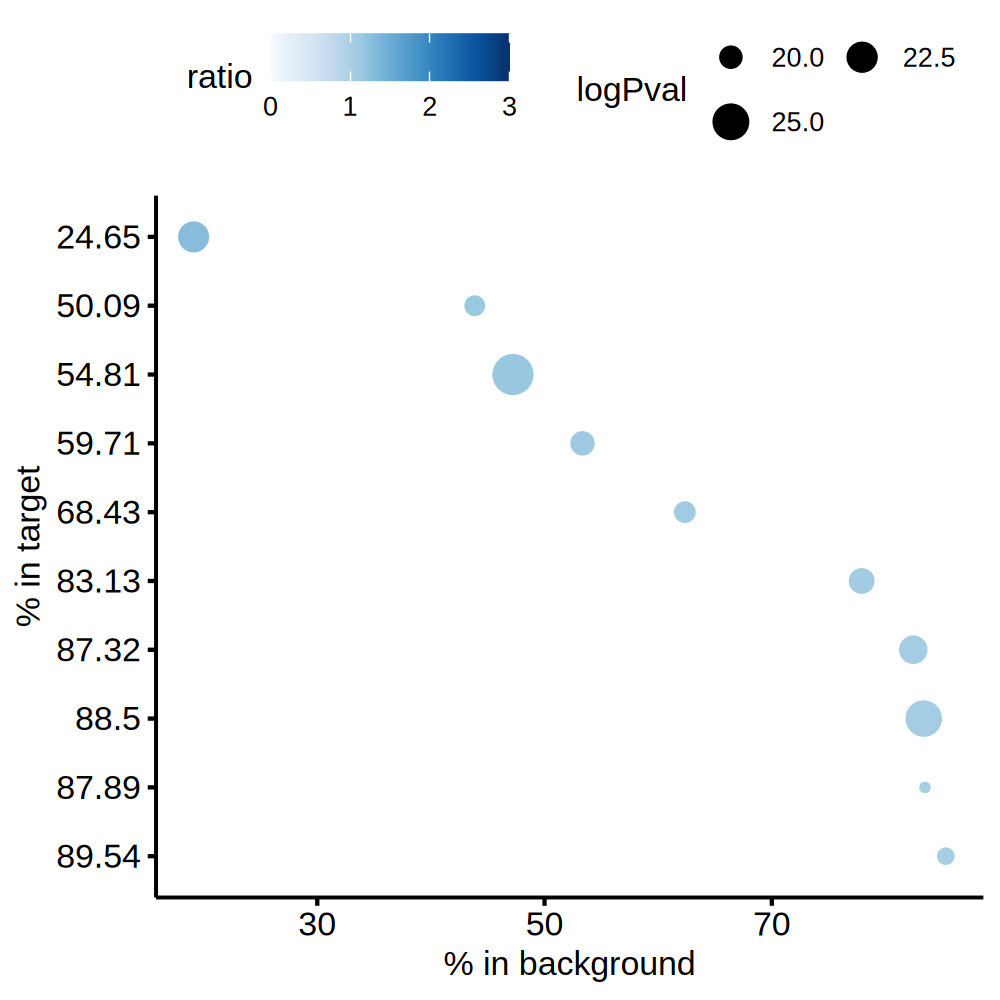

In [132]:
#all changed
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[ratio > 10, ratio := 10]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 3)) 

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


In [150]:
run = 'run11_short'
sel1 = unique(deg_MEP__EB_MK[FDR < .1 & class_id %in% c('LTR'), rn])
sel2 = unique(deg_MEP__EB_MK[FDR >= .1 & class_id %in% c('LTR'), rn])
setkey(te_dt, 'idd')
sel1_bed = te_dt[sel1, .(chr, start, end, idd)][!duplicated(idd), ]
sel2_bed = te_dt[sel2, .(chr, start, end, idd)][!duplicated(idd) , ]
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(sel1_bed, file = pos_file, sep = '\t', col.names = F) 
fwrite(sel2_bed, file = neg_file, sep = '\t', col.names = F) 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file, ' -fdr 10 -p 10 -dumpFasta')
cmd


[1] "findMotifsGenome.pl data/deg_local_ltr_run11_short_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run11_short -size given -len 8 -bg data/deg_local_ltr_run11_short_neg.bed -fdr 10 -p 10 -dumpFasta"

Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
VRN1(ABI3VP1)/col-VRN1-DAP-Seq(GSE60143)/Homer,TTTTTTTTTT,1e-26,11.25,5.33,2.110694
REM19(REM)/colamp-REM19-DAP-Seq(GSE60143)/Homer,AAAAAAAA,1e-22,24.75,16.36,1.512836
Pit1(Homeobox)/GCrat-Pit1-ChIP-Seq(GSE58009)/Homer,ATGMATATDC,1e-20,33.36,24.41,1.366653
EHF(ETS)/LoVo-EHF-ChIP-Seq(GSE49402)/Homer,AVCAGGAAGT,1e-20,33.65,24.57,1.369556
COUP-TFII(NR)/Artia-Nr2f2-ChIP-Seq(GSE46497)/Homer,AGRGGTCA,1e-23,36.85,26.77,1.376541
GTL1(Trihelix)/colamp-GTL1-DAP-Seq(GSE60143)/Homer,WWTTTACCKY,1e-23,38.31,28.23,1.357067
Sox21(HMG)/ESC-SOX21-ChIP-Seq(GSE110505)/Homer,BCCWTTGTBYKV,1e-21,44.09,34.13,1.291825
ARF2(ARF)/col-ARF2-DAP-Seq(GSE60143)/Homer,TTGTCGGMWN,1e-24,47.81,36.93,1.294611
SOX1(HMG)/NPC-SOX1-ChIP-Seq(GSE138215)/Homer,CCATTGTTCB,1e-25,48.14,36.84,1.306732


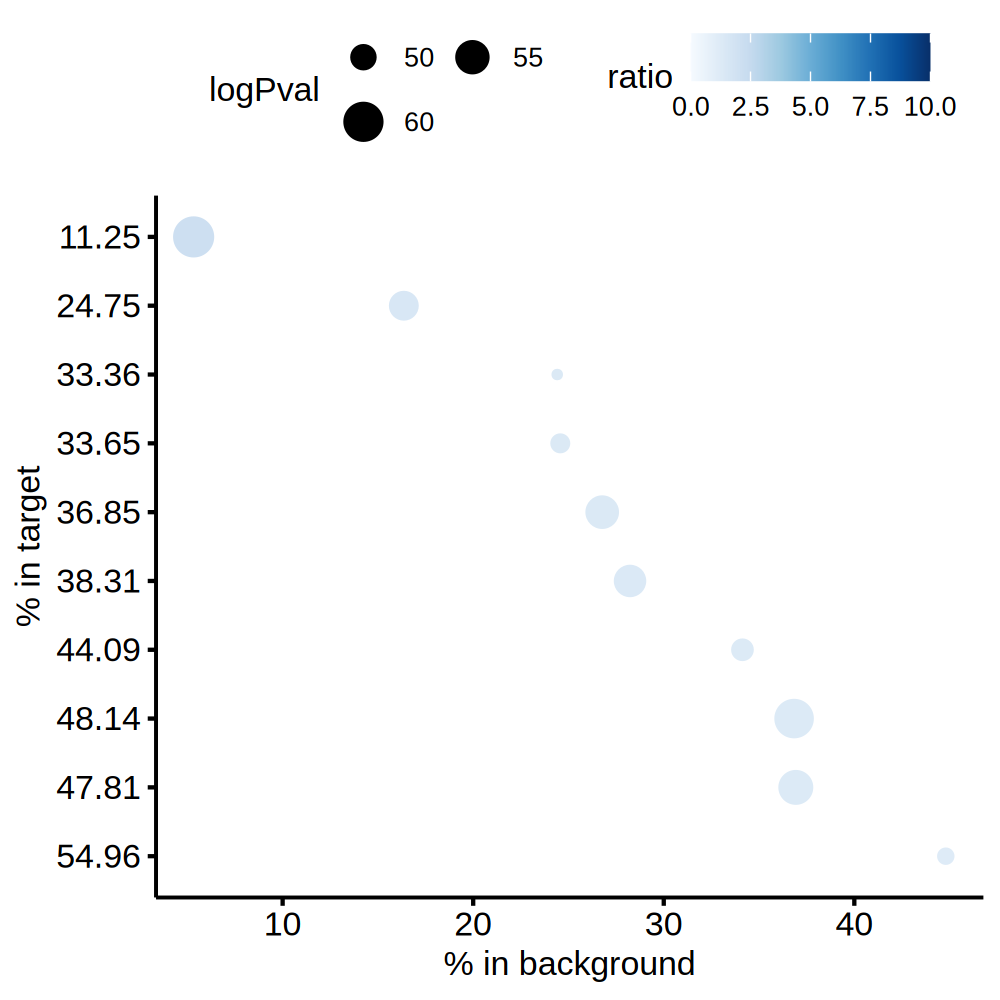

In [82]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[ratio > 10, ratio := 10]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 10))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ZNF317(Zf)/HEK293-ZNF317.GFP-ChIP-Seq(GSE58341)/Homer,GTCWGCTGTYYCTCT,1e-09,0.66,0.08,8.250000
"Oct4:Sox17(POU,Homeobox,HMG)/F9-Sox17-ChIP-Seq(GSE44553)/Homer",CCATTGTATGCAAAT,1e-06,1.69,0.70,2.414286
Nur77(NR)/K562-NR4A1-ChIP-Seq(GSE31363)/Homer,TGACCTTTNCNT,1e-04,2.12,1.08,1.962963
TCP1(TCP)/col-TCP1-DAP-Seq(GSE60143)/Homer,GGGGGCCCMMCN,1e-08,2.45,1.04,2.355769
NFkB-p65-Rel(RHD)/ThioMac-LPS-Expression(GSE23622)/Homer,GGAAATTCCC,1e-05,3.34,1.93,1.730570
TCP7(TCP)/col-TCP7-DAP-Seq(GSE60143)/Homer,GTGGGSCCCACHHNN,1e-06,4.75,2.82,1.684397
MyoG(bHLH)/C2C12-MyoG-ChIP-Seq(GSE36024)/Homer,AACAGCTG,1e-04,8.56,6.23,1.373997
ATHB21(HB)/colamp-ATHB21-DAP-Seq(GSE60143)/Homer,YCAATWAT,1e-04,10.02,7.51,1.334221
Ap4(bHLH)/AML-Tfap4-ChIP-Seq(GSE45738)/Homer,NAHCAGCTGD,1e-04,10.26,7.78,1.318766


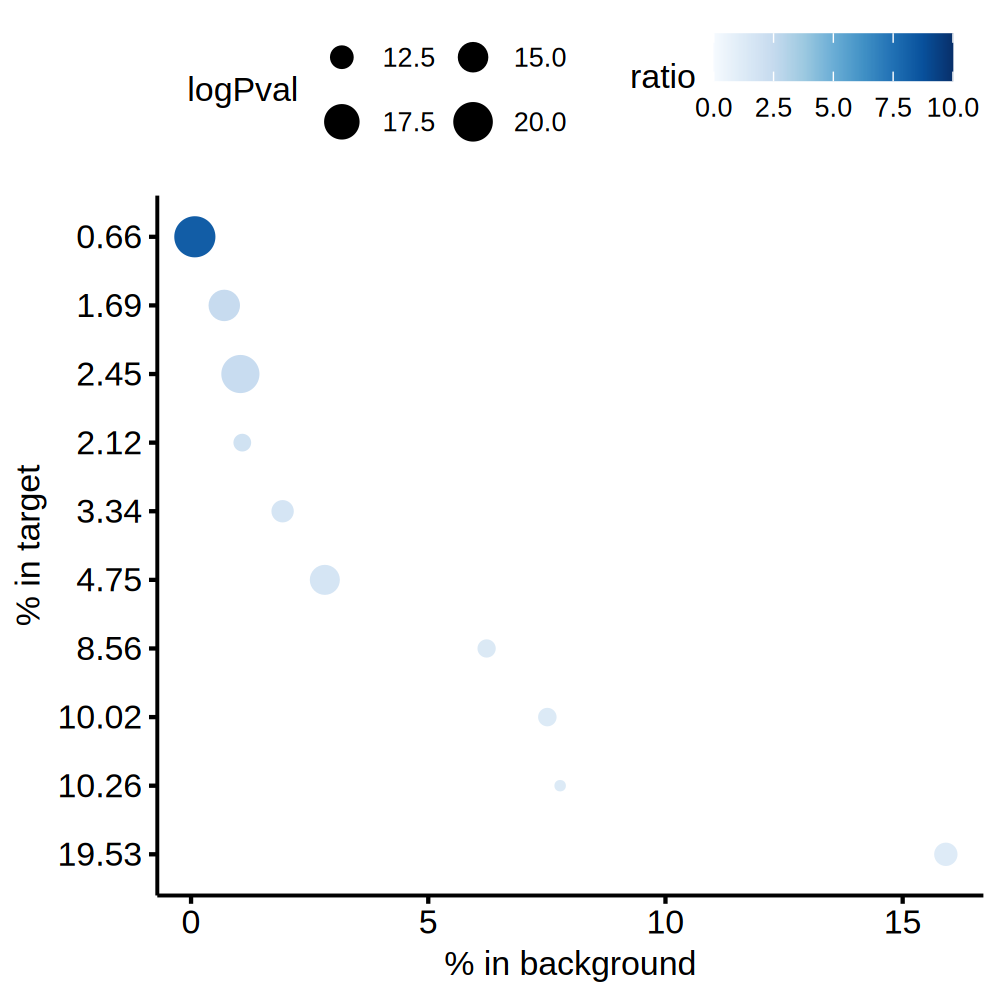

In [297]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[ratio > 10, ratio := 10]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 10))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


## run12: MEP up-regulated LINE

In [61]:
run = 'run12'
# LTR, LINE, SINE, Retroposon, DNA
deg_MEP__EB_MK = add_meta_fun(deg_MEP__EB_MK)
sel1 = unique(deg_MEP__EB_MK[FDR < .1 & class_id %in% c('LINE'), rn])
sel2 = unique(deg_MEP__EB_MK[FDR >= .1 & class_id %in% c('LINE'), rn])
setkey(te_dt, 'idd')
sel1_bed = te_dt[sel1, .(chr, start, end, idd)][!duplicated(idd), ]
sel2_bed = te_dt[sel2, .(chr, start, end, idd)][!duplicated(idd) , ]
#sel1_bed[, start := start - 2000 ]
#sel1_bed[, end := end + 2000 ]
#sel2_bed[, start := start - 2000 ]
#sel2_bed[, end := end + 2000 ]
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(sel1_bed, file = pos_file, sep = '\t', col.names = F) 
fwrite(sel2_bed, file = neg_file, sep = '\t', col.names = F) 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file, ' -fdr 10 -p 10 -dumpFasta ')
cmd


[1] "findMotifsGenome.pl data/deg_local_ltr_run12_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run12 -size given -len 8 -bg data/deg_local_ltr_run12_neg.bed -fdr 10 -p 10 -dumpFasta "

Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
At4g01280(MYBrelated)/colamp-At4g01280-DAP-Seq(GSE60143)/Homer,AAATATCT,1e-112,36.06,26.81,1.345021
Prop1(Homeobox)/GHFT1-PROP1.biotin-ChIP-Seq(GSE77302)/Homer,NTAATBNAATTA,1e-162,42.49,30.90,1.375081
GTL1(Trihelix)/colamp-GTL1-DAP-Seq(GSE60143)/Homer,WWTTTACCKY,1e-157,48.93,37.13,1.317802
RAV1(RAV)/colamp-RAV1-DAP-Seq(GSE60143)/Homer,TWWTTTCTGTTG,1e-109,50.29,40.37,1.245727
AT5G47660(Trihelix)/colamp-AT5G47660-DAP-Seq(GSE60143)/Homer,AWTTTTACCG,1e-113,54.44,44.31,1.228617
Sox21(HMG)/ESC-SOX21-ChIP-Seq(GSE110505)/Homer,BCCWTTGTBYKV,1e-120,57.65,47.19,1.221657
ATHB6(Homeobox)/col-ATHB6-DAP-Seq(GSE60143)/Homer,AATGATTG,1e-109,59.53,49.57,1.200928
hTCT(CPE),BCKTTCTYTTY,1e-125,62.77,52.13,1.204105
AT1G20910(ARID)/col-AT1G20910-DAP-Seq(GSE60143)/Homer,THAATTRAWN,1e-116,64.76,54.60,1.186081


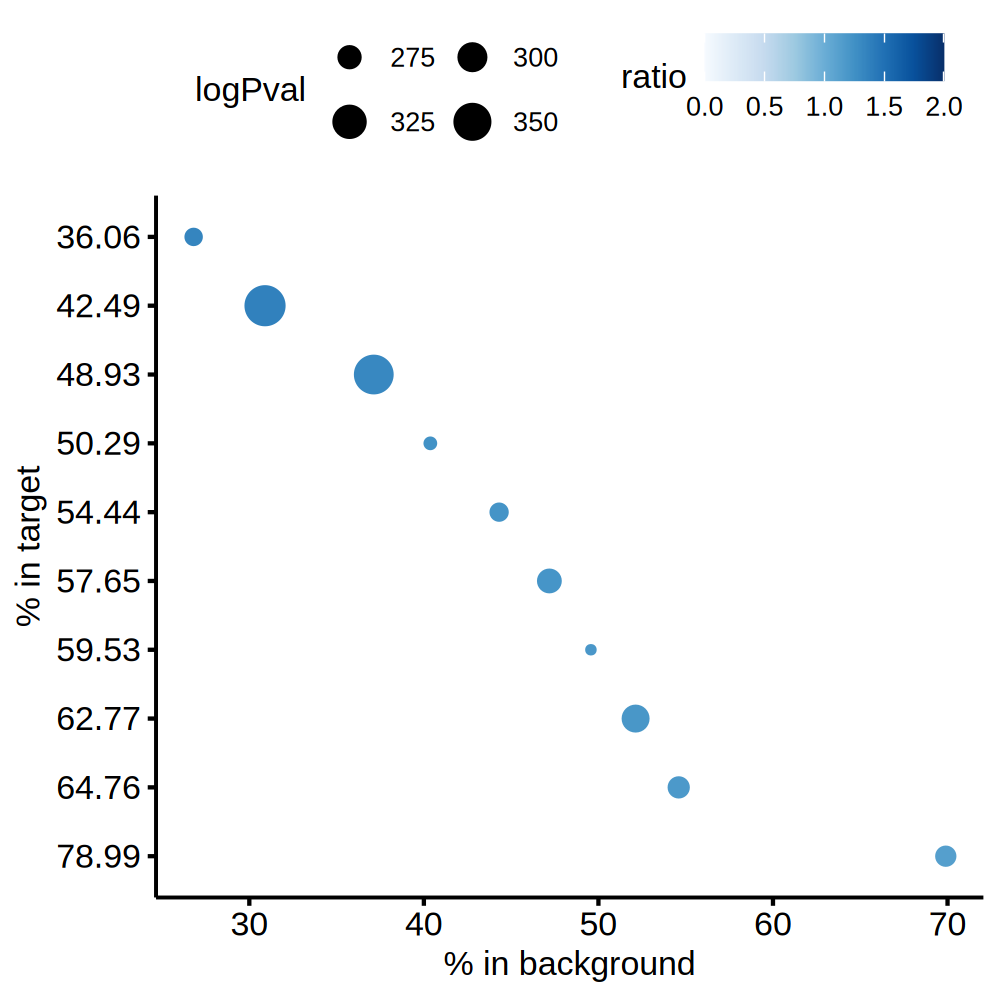

In [62]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[ratio > 10, ratio := 10]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 2))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


In [230]:
table(te_dt$class_id)


           DNA           DNA?           LINE Low_complexity            LTR 
        527321            148        1567840             17         751651 
            RC     Retroposon      Satellite           SINE         srpRNA 
          2267           7380          49729        1782180             16 
       Unknown 
         23274 

## run13: MEP up-regulated SINE

In [300]:
run = 'run13'
# LTR, LINE, SINE, Retroposon, DNA
deg_MEP__EB_MK = add_meta_fun(deg_MEP__EB_MK)
sel1 = unique(deg_MEP__EB_MK[FDR < .1 & class_id %in% c('SINE'), rn])
sel2 = unique(deg_MEP__EB_MK[FDR >= .1 & class_id %in% c('SINE'), rn])
setkey(te_dt, 'idd')
sel1_bed = te_dt[sel1, .(chr, start, end, idd)][!duplicated(idd), ]
sel2_bed = te_dt[sel2, .(chr, start, end, idd)][!duplicated(idd) , ]
sel1_bed[, start := start - 2000 ]
sel1_bed[, end := end + 2000 ]
sel2_bed[, start := start - 2000 ]
sel2_bed[, end := end + 2000 ]
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(sel1_bed, file = pos_file, sep = '\t', col.names = F) 
fwrite(sel2_bed, file = neg_file, sep = '\t', col.names = F) 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file, ' -fdr 10 -p 10 -dumpFasta ')
cmd


[1] "findMotifsGenome.pl data/deg_local_ltr_run13_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run13 -size 200 -len 8 -bg data/deg_local_ltr_run13_neg.bed -fdr 10 -p 10"

Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
HAP3(CCAATHAP3)/col-HAP3-DAP-Seq(GSE60143)/Homer,TGATGGAW,0.010,0.92,0.57,1.614035
TCP1(TCP)/col-TCP1-DAP-Seq(GSE60143)/Homer,GGGGGCCCMMCN,0.010,1.29,0.85,1.517647
Chop(bZIP)/MEF-Chop-ChIP-Seq(GSE35681)/Homer,ATTGCATCAT,0.010,2.12,1.63,1.300613
PSE(SNAPc)/K562-mStart-Seq/Homer,WAVTCACCMTAASYDAAAAG,0.001,3.60,2.78,1.294964
Atf3(bZIP)/GBM-ATF3-ChIP-Seq(GSE33912)/Homer,DATGASTCATHN,0.010,4.15,3.34,1.242515
BATF(bZIP)/Th17-BATF-ChIP-Seq(GSE39756)/Homer,DATGASTCAT,0.010,4.52,3.74,1.208556
AP-1(bZIP)/ThioMac-PU.1-ChIP-Seq(GSE21512)/Homer,VTGACTCATC,0.010,4.89,4.07,1.201474
RUNX(Runt)/HPC7-Runx1-ChIP-Seq(GSE22178)/Homer,SAAACCACAG,0.001,5.93,4.72,1.256356
SPL1(SBP)/colamp-SPL1-DAP-Seq(GSE60143)/Homer,HYGTACDTWH,0.010,10.89,9.70,1.122680


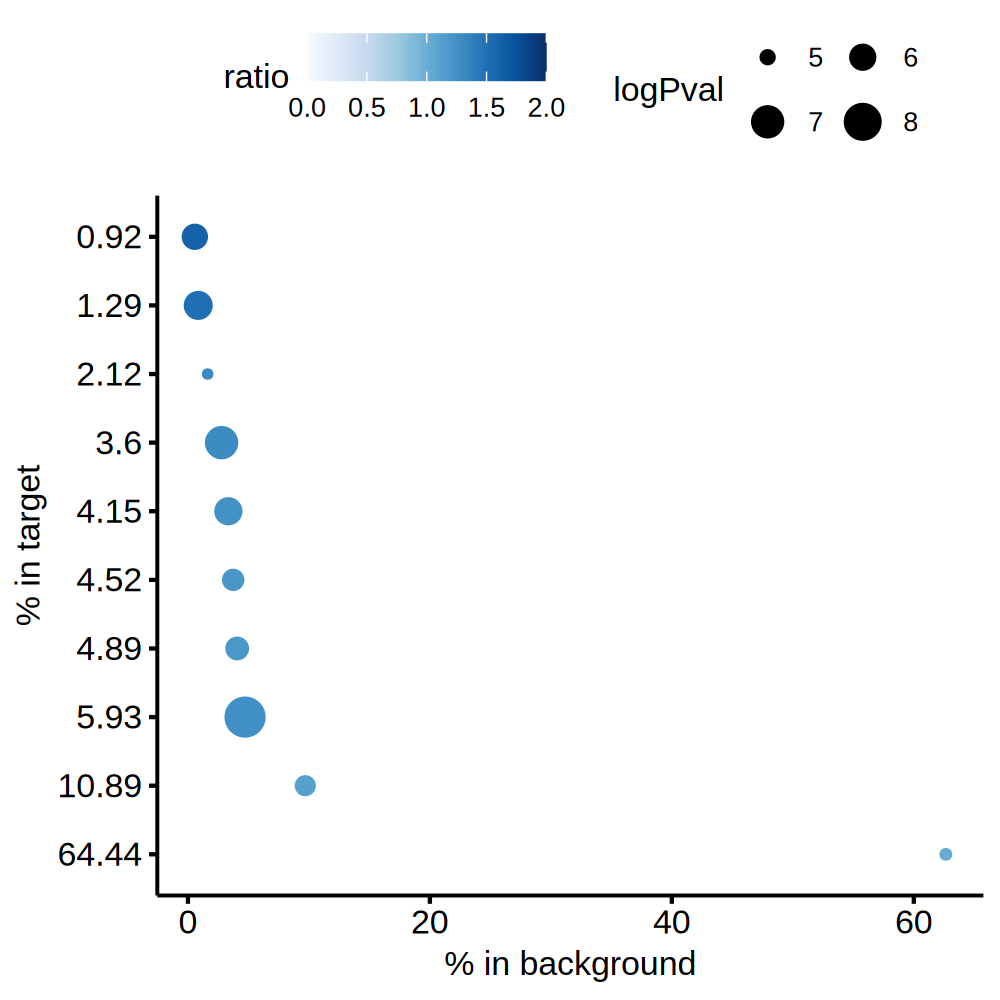

In [301]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[ratio > 10, ratio := 10]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 2))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


## run14: MEP up-regulated Retroposon

In [66]:
run = 'run14'
# LTR, LINE, SINE, Retroposon, DNA
deg_MEP__EB_MK = add_meta_fun(deg_MEP__EB_MK)
sel1 = unique(deg_MEP__EB_MK[FDR < .1 & class_id %in% c('Retroposon'), rn])
sel2 = unique(deg_MEP__EB_MK[FDR >= .1 & class_id %in% c('Retroposon'), rn])
setkey(te_dt, 'idd')
sel1_bed = te_dt[sel1, .(chr, start, end, idd)][!duplicated(idd), ]
sel2_bed = te_dt[sel2, .(chr, start, end, idd)][!duplicated(idd) , ]
sel1_bed[, start := start - 2000 ]
sel1_bed[, end := end + 2000 ]
sel2_bed[, start := start - 2000 ]
sel2_bed[, end := end + 2000 ]
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(sel1_bed, file = pos_file, sep = '\t', col.names = F) 
fwrite(sel2_bed, file = neg_file, sep = '\t', col.names = F) 
cmd = paste0(' findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file, ' -fdr 10 -p 10 -dumpFasta')
cmd


[1] " findMotifsGenome.pl data/deg_local_ltr_run14_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run14 -size given -len 8 -bg data/deg_local_ltr_run14_neg.bed -fdr 10 -p 10 -dumpFasta"

Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
"Brn1(POU,Homeobox)/NPC-Brn1-ChIP-Seq(GSE35496)/Homer",TATGCWAATBAV,1e-14,8.42,6.62,1.271903
"Oct6(POU,Homeobox)/NPC-Pou3f1-ChIP-Seq(GSE35496)/Homer",WATGCAAATGAG,1e-09,10.09,8.46,1.192671
Hoxa10(Homeobox)/ChickenMSG-Hoxa10.Flag-ChIP-Seq(GSE86088)/Homer,GGYAATGAAA,1e-11,10.27,8.49,1.209658
PSE(SNAPc)/K562-mStart-Seq/Homer,WAVTCACCMTAASYDAAAAG,1e-12,11.55,9.61,1.201873
Prop1(Homeobox)/GHFT1-PROP1.biotin-ChIP-Seq(GSE77302)/Homer,NTAATBNAATTA,1e-11,16.89,14.69,1.149762
Sox21(HMG)/ESC-SOX21-ChIP-Seq(GSE110505)/Homer,BCCWTTGTBYKV,1e-14,25.42,22.50,1.129778
Sox3(HMG)/NPC-Sox3-ChIP-Seq(GSE33059)/Homer,CCWTTGTY,1e-15,28.08,24.93,1.126354
SOX1(HMG)/NPC-SOX1-ChIP-Seq(GSE138215)/Homer,CCATTGTTCB,1e-09,32.35,29.74,1.087761
hTCT(CPE),BCKTTCTYTTY,1e-12,34.22,31.24,1.095391


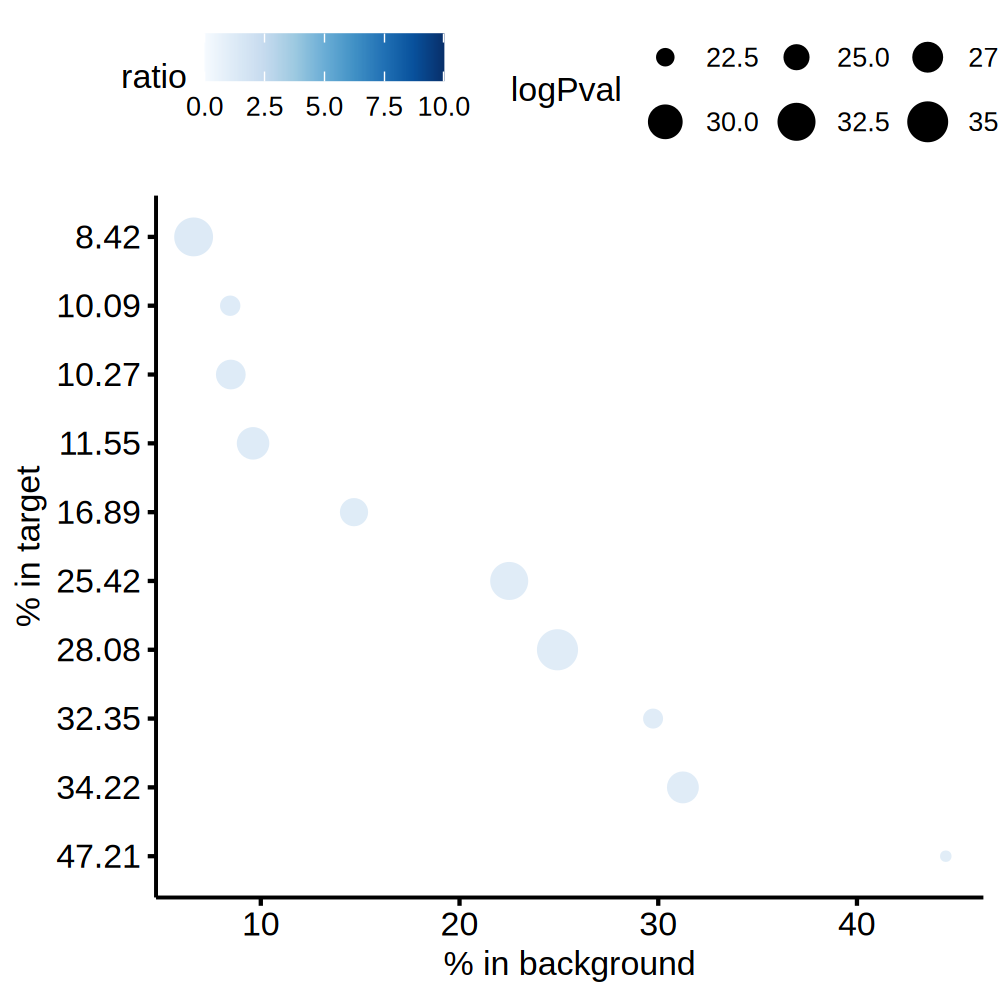

In [53]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
plotdat[ratio > 10, ratio := 10]
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 10))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
"LXRE(NR),DR4/RAW-LXRb.biotin-ChIP-Seq(GSE21512)/Homer",RGGTTACTANAGGTCA,0.010,71.43,9.35,7.639572
NFY(CCAAT)/Promoter/Homer,RGCCAATSRG,0.010,71.43,29.31,2.437052
PU.1(ETS)/ThioMac-PU.1-ChIP-Seq(GSE21512)/Homer,AGAGGAAGTG,0.010,71.43,28.96,2.466506
Stat3(Stat)/mES-Stat3-ChIP-Seq(GSE11431)/Homer,CTTCCGGGAA,0.010,71.43,29.31,2.437052
STAT5(Stat)/mCD4+-Stat5-ChIP-Seq(GSE12346)/Homer,RTTTCTNAGAAA,0.010,71.43,20.25,3.527407
WT1(Zf)/Kidney-WT1-ChIP-Seq(GSE90016)/Homer,MCTCCCMCRCAB,0.010,71.43,19.95,3.580451
Stat3+il21(Stat)/CD4-Stat3-ChIP-Seq(GSE19198)/Homer,SVYTTCCNGGAARB,0.001,85.71,29.31,2.924258
WRKY43(WRKY)/colamp-WRKY43-DAP-Seq(GSE60143)/Homer,NCGTTGACTTTT,0.001,85.71,8.71,9.840413
WRKY3(WRKY)/col-WRKY3-DAP-Seq(GSE60143)/Homer,NCKTTGACYDDN,0.001,100.00,37.92,2.637131


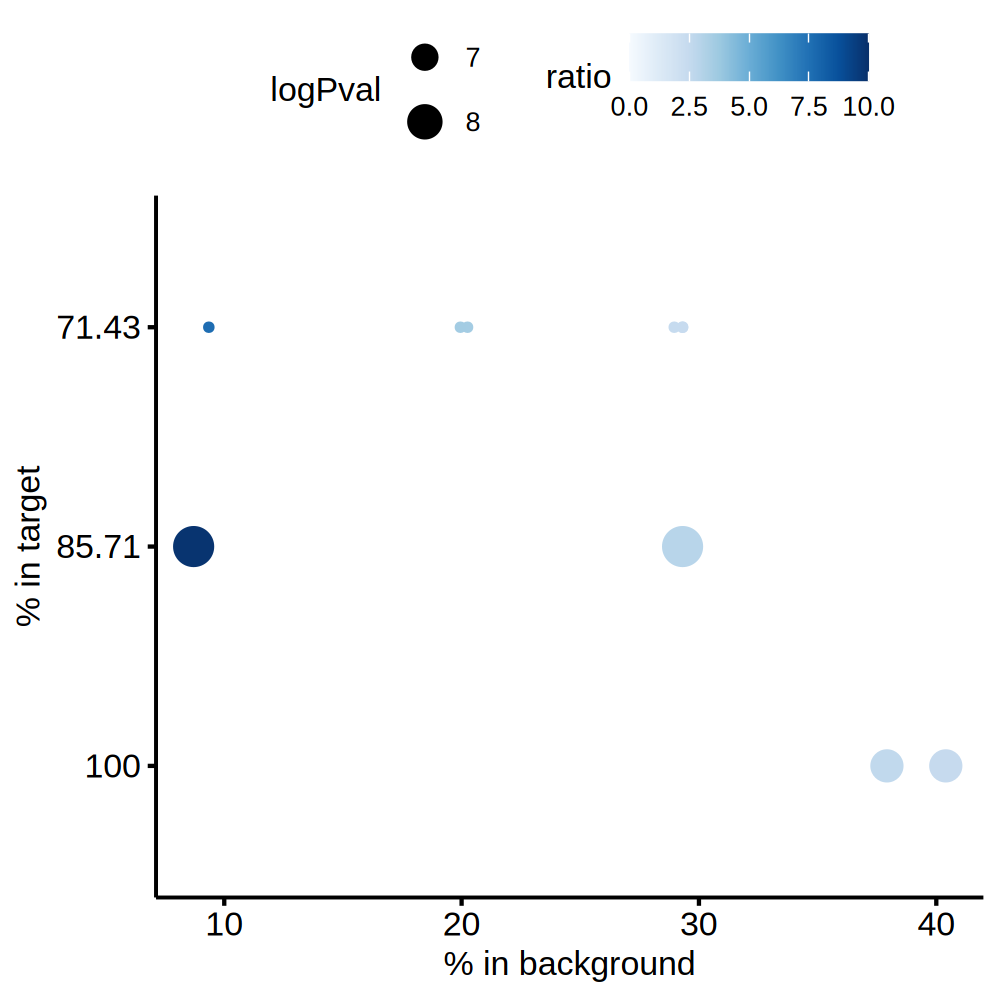

In [67]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
plotdat[ratio > 10, ratio := 10]
myPalette <- colorRampPalette(brewer.pal(9, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, 10))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))


## run15: MEP up-regulated DNA

In [64]:
run = 'run15_short'
# LTR, LINE, SINE, Retroposon, DNA
deg_MEP__EB_MK = add_meta_fun(deg_MEP__EB_MK)
sel1 = unique(deg_MEP__EB_MK[FDR < .1 & class_id %in% c('DNA'), rn])
sel2 = unique(deg_MEP__EB_MK[FDR >= .1 & class_id %in% c('DNA'), rn])
setkey(te_dt, 'idd')
sel1_bed = te_dt[sel1, .(chr, start, end, idd)][!duplicated(idd), ]
sel2_bed = te_dt[sel2, .(chr, start, end, idd)][!duplicated(idd) , ]
#sel1_bed[, start := start - 2000 ]
#sel1_bed[, end := end + 2000 ]
#sel2_bed[, start := start - 2000 ]
#sel2_bed[, end := end + 2000 ]
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(sel1_bed, file = pos_file, sep = '\t', col.names = F) 
fwrite(sel2_bed, file = neg_file, sep = '\t', col.names = F) 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file, ' -fdr 10 -p 10 -dumpFasta')
cmd


[1] "findMotifsGenome.pl data/deg_local_ltr_run15_short_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run15_short -size given -len 8 -bg data/deg_local_ltr_run15_short_neg.bed -fdr 10 -p 10 -dumpFasta"

In [250]:
library(RColorBrewer)

Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Fra1(bZIP)/BT549-Fra1-ChIP-Seq(GSE46166)/Homer,NNATGASTCATH,1e-15,9.47,4.82,1.964730
BATF(bZIP)/Th17-BATF-ChIP-Seq(GSE39756)/Homer,DATGASTCAT,1e-15,9.93,5.11,1.943249
Fos(bZIP)/TSC-Fos-ChIP-Seq(GSE110950)/Homer,NDATGASTCAYN,1e-14,9.99,5.30,1.884906
Atf3(bZIP)/GBM-ATF3-ChIP-Seq(GSE33912)/Homer,DATGASTCATHN,1e-16,10.10,5.19,1.946050
AP-1(bZIP)/ThioMac-PU.1-ChIP-Seq(GSE21512)/Homer,VTGACTCATC,1e-16,11.37,6.11,1.860884
Pdx1(Homeobox)/Islet-Pdx1-ChIP-Seq(SRA008281)/Homer,YCATYAATCA,1e-17,22.52,14.63,1.539303
ATHB7(Homeobox)/col-ATHB7-DAP-Seq(GSE60143)/Homer,AATGATTG,1e-15,23.27,15.80,1.472785
caudal(Homeobox)/Drosophila-Embryos-ChIP-Chip(modEncode)/Homer,GGYCATAAAW,1e-17,24.60,16.51,1.490006
CRC(C2C2YABBY)/col-CRC-DAP-Seq(GSE60143)/Homer,TWATSATA,1e-18,34.47,25.00,1.378800


Warning message in brewer.pal(11, "Blues"):
"n too large, allowed maximum for palette Blues is 9
Returning the palette you asked for with that many colors
"


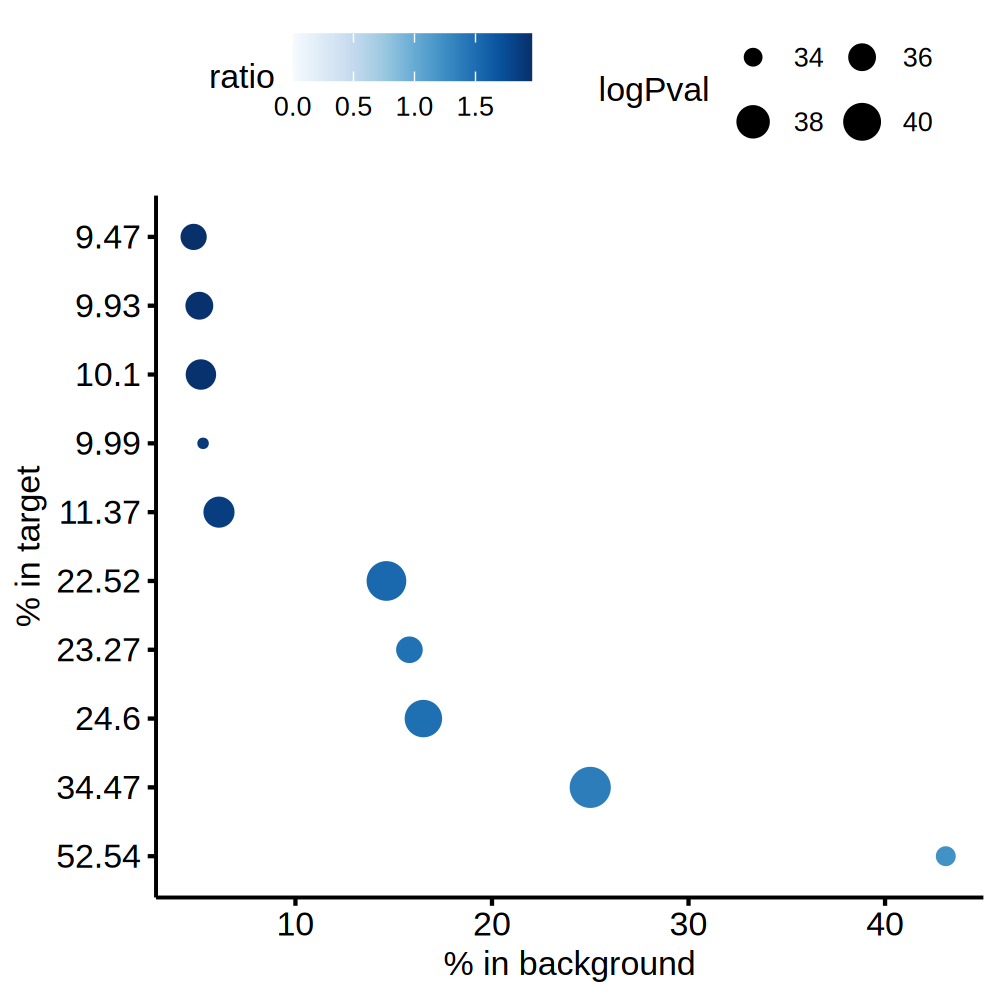

In [65]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
plotdat[ratio > 10, ratio := 10 ]
myPalette <- colorRampPalette(brewer.pal(11, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, max(plotdat[1:10, ratio])))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))



Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
"OCT:OCT(POU,Homeobox,IR1)/NPC-Brn2-ChIP-Seq(GSE35496)/Homer",ATGAATWATTCATGA,1e-04,0.64,0.16,4.000000
JunB(bZIP)/DendriticCells-Junb-ChIP-Seq(GSE36099)/Homer,RATGASTCAT,1e-04,4.85,3.07,1.579805
Fra1(bZIP)/BT549-Fra1-ChIP-Seq(GSE46166)/Homer,NNATGASTCATH,1e-07,5.77,3.18,1.814465
BATF(bZIP)/Th17-BATF-ChIP-Seq(GSE39756)/Homer,DATGASTCAT,1e-05,5.77,3.58,1.611732
Fos(bZIP)/TSC-Fos-ChIP-Seq(GSE110950)/Homer,NDATGASTCAYN,1e-07,6.18,3.51,1.760684
Atf3(bZIP)/GBM-ATF3-ChIP-Seq(GSE33912)/Homer,DATGASTCATHN,1e-07,6.29,3.59,1.752089
AP-1(bZIP)/ThioMac-PU.1-ChIP-Seq(GSE21512)/Homer,VTGACTCATC,1e-04,6.47,4.31,1.501160
Sox4(HMG)/proB-Sox4-ChIP-Seq(GSE50066)/Homer,YCTTTGTTCC,1e-04,8.95,6.34,1.411672
AT1G76880(Trihelix)/col-AT1G76880-DAP-Seq(GSE60143)/Homer,ACGGTAAAAW,1e-04,13.45,10.52,1.278517


Warning message in brewer.pal(11, "Blues"):
"n too large, allowed maximum for palette Blues is 9
Returning the palette you asked for with that many colors
"


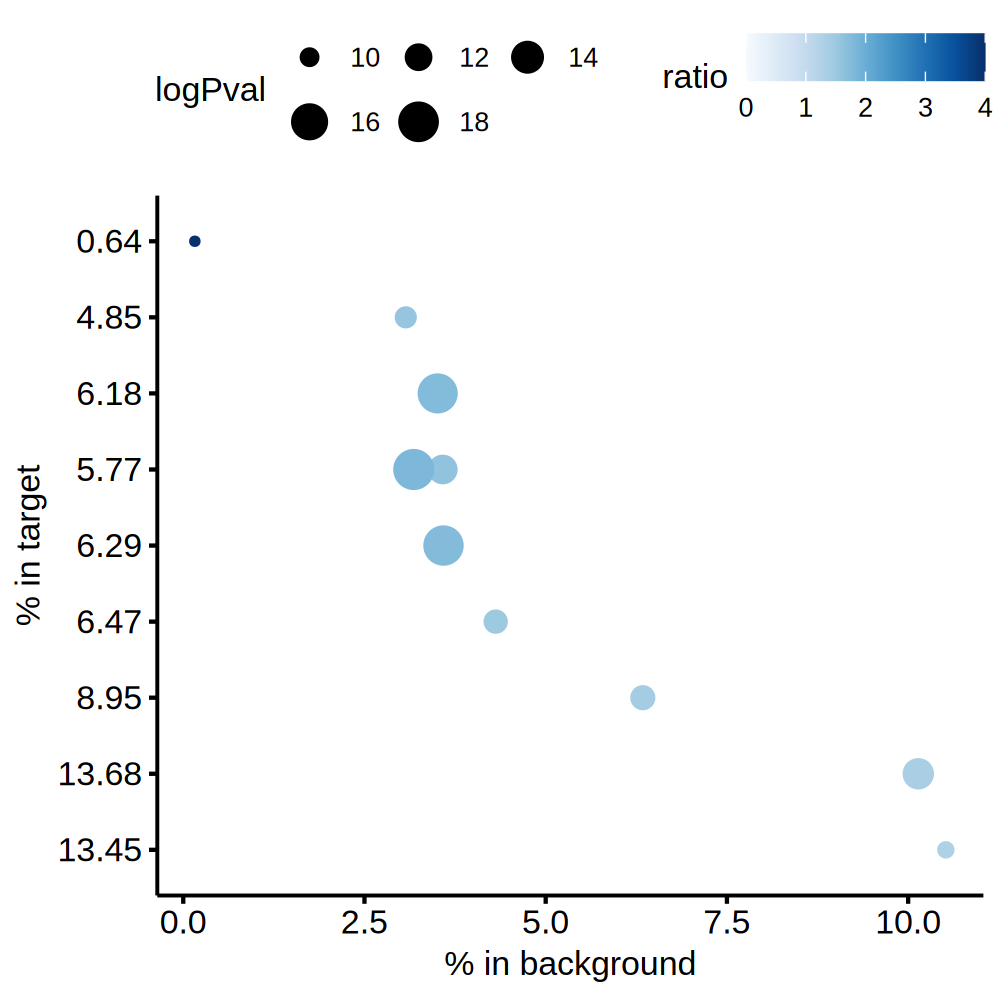

In [305]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
plotdat[ratio > 10, ratio := 10 ]
myPalette <- colorRampPalette(brewer.pal(11, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, max(plotdat[1:10, ratio])))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))



## run 16, down-regulated in MEP vs EB/MK

In [117]:
run = 'run16'
sel1 = unique(deg_MEP__EB_MK[logFC < 0 & FDR < .1 & class_id %in% c('LTR'), rn])
sel2 = unique(deg_MEP__EB_MK[FDR < .1 & class_id %in% c('LTR'), rn])
setkey(te_dt, 'idd')
sel1_bed = te_dt[sel1, .(chr, start, end, idd)][!duplicated(idd), ]
sel2_bed = te_dt[sel2, .(chr, start, end, idd)][!duplicated(idd) , ]
sel1_bed[, start := start - 2000 ]
sel1_bed[, end := end + 2000 ]
sel2_bed[, start := start - 2000 ]
sel2_bed[, end := end + 2000 ]
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(sel1_bed, file = pos_file, sep = '\t', col.names = F) 
fwrite(sel2_bed, file = neg_file, sep = '\t', col.names = F) 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file, ' -fdr 10 -p 10 -dumpFasta')
cmd


[1] "findMotifsGenome.pl data/deg_local_ltr_run11_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run11 -size given -len 8 -bg data/deg_local_ltr_run11_neg.bed -fdr 10 -p 10 -dumpFasta"

Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
AS2(LOBAS2)/col-AS2-DAP-Seq(GSE60143)/Homer,CCGDAAWWHMCGSCG,0.010,3.06,0.99,3.090909
CTCF(Zf)/WholeFly-dCTCF-ChIP-seq(GSE175402)/Homer,RTGGCGCCATCTAGCGGHCA,0.001,5.44,2.10,2.590476
BZR1(BZR)/col-BZR1-DAP-Seq(GSE60143)/Homer,NNCRCACGTGCG,0.010,9.18,5.50,1.669091
PUCHI(AP2EREBP)/colamp-PUCHI-DAP-Seq(GSE60143)/Homer,GCGCCGTY,0.010,13.95,8.89,1.569179
HSFA1E(HSF)/col-HSFA1E-DAP-Seq(GSE60143)/Homer,TTCTAGAAGCTTCTA,0.010,16.33,11.19,1.459339
RAP212(AP2EREBP)/col-RAP212-DAP-Seq(GSE60143)/Homer,CGCCGCCATTTT,0.010,31.29,24.40,1.282377
Unknown4/Drosophila-Promoters/Homer,AAAAATACCRMA,0.010,38.44,30.27,1.269904
HAT1(Homeobox)/col-HAT1-DAP-Seq(GSE60143)/Homer,SCAATCATTGNN,0.010,48.64,41.53,1.171202
ANAC057(NAC)/colamp-ANAC057-DAP-Seq(GSE60143)/Homer,DVCKTGNNNNNCAMG,0.010,67.69,60.59,1.117181


Warning message in brewer.pal(11, "Blues"):
"n too large, allowed maximum for palette Blues is 9
Returning the palette you asked for with that many colors
"


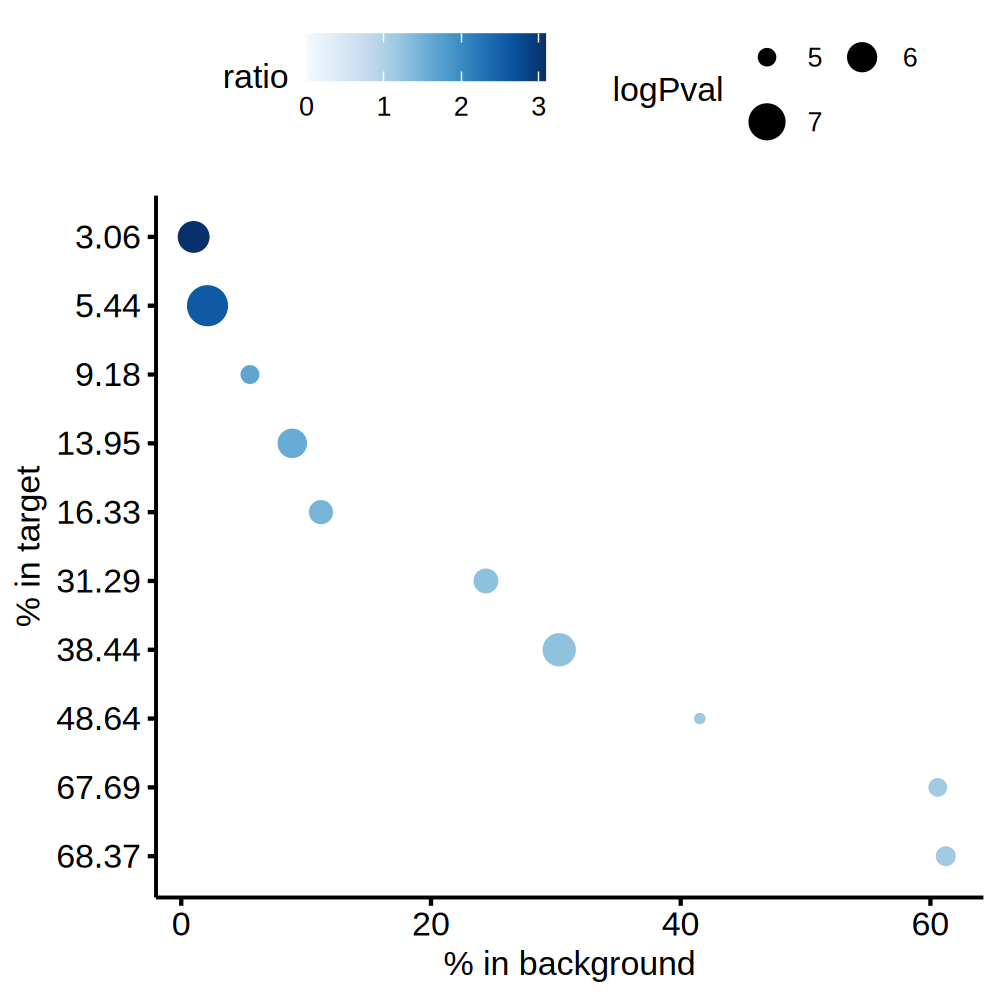

In [119]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
plotdat[ratio > 10, ratio := 10 ]
myPalette <- colorRampPalette(brewer.pal(11, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, max(plotdat[1:10, ratio])))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))



In [125]:
run = 'run16'
sel1 = unique(deg_MEP__EB_MK[logFC < 0 & FDR < .1 & class_id %in% c('LTR'), rn])
sel2 = unique(deg_MEP__EB_MK[FDR < .1 & class_id %in% c('LTR'), rn])
setkey(te_dt, 'idd')
sel1_bed = te_dt[sel1, .(chr, start, end, idd)][!duplicated(idd), ]
sel2_bed = te_dt[sel2, .(chr, start, end, idd)][!duplicated(idd) , ]
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(sel1_bed, file = pos_file, sep = '\t', col.names = F) 
fwrite(sel2_bed, file = neg_file, sep = '\t', col.names = F) 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size given -len 8 -bg ', neg_file, ' -fdr 10 -p 10 -dumpFasta')
cmd
length(sel1)
length(sel2)

[1] "findMotifsGenome.pl data/deg_local_ltr_run16_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run16 -size given -len 8 -bg data/deg_local_ltr_run16_neg.bed -fdr 10 -p 10 -dumpFasta"

[1] 296

[1] 2125

Name,Consensus,P-value,target,background,ratio
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
AS2(LOBAS2)/col-AS2-DAP-Seq(GSE60143)/Homer,CCGDAAWWHMCGSCG,0.10,0.68,0.00,Inf
AT1G10720(BSD)/col-AT1G10720-DAP-Seq(GSE60143)/Homer,TTCTAGAAKCTTCTA,0.10,1.01,0.27,3.740741
HSFA6A(HSF)/col-HSFA6A-DAP-Seq(GSE60143)/Homer,RGAAGNTTCTAGAAN,0.01,1.35,0.23,5.869565
PLT1(AP2EREBP)/colamp-PLT1-DAP-Seq(GSE60143)/Homer,GCACGAWTYCCGAGG,0.10,2.36,1.12,2.107143
O2(bZIP)/Corn-O2-ChIP-Seq(GSE63991)/Homer,GCTGACGTGGCA,0.10,2.70,1.33,2.030075
ERF3(AP2EREBP)/colamp-ERF3-DAP-Seq(GSE60143)/Homer,ATGGCGGCGG,0.01,6.76,3.80,1.778947
"PAX3:FKHR-fusion(Paired,Homeobox)/Rh4-PAX3:FKHR-ChIP-Seq(GSE19063)/Homer",ACCRTGACTAATTNN,0.10,10.14,7.30,1.389041
ERF4(AP2EREBP)/colamp-ERF4-DAP-Seq(GSE60143)/Homer,WDWTGGCGGCGG,0.10,10.81,8.26,1.308717
HOXA3(Homeobox)/mEmbryo-Hoxa3-ChIP-Seq(E-MTAB-8607)/Homer,ATGATTGATGGS,0.10,11.15,8.02,1.390274


Warning message in brewer.pal(11, "Blues"):
"n too large, allowed maximum for palette Blues is 9
Returning the palette you asked for with that many colors
"


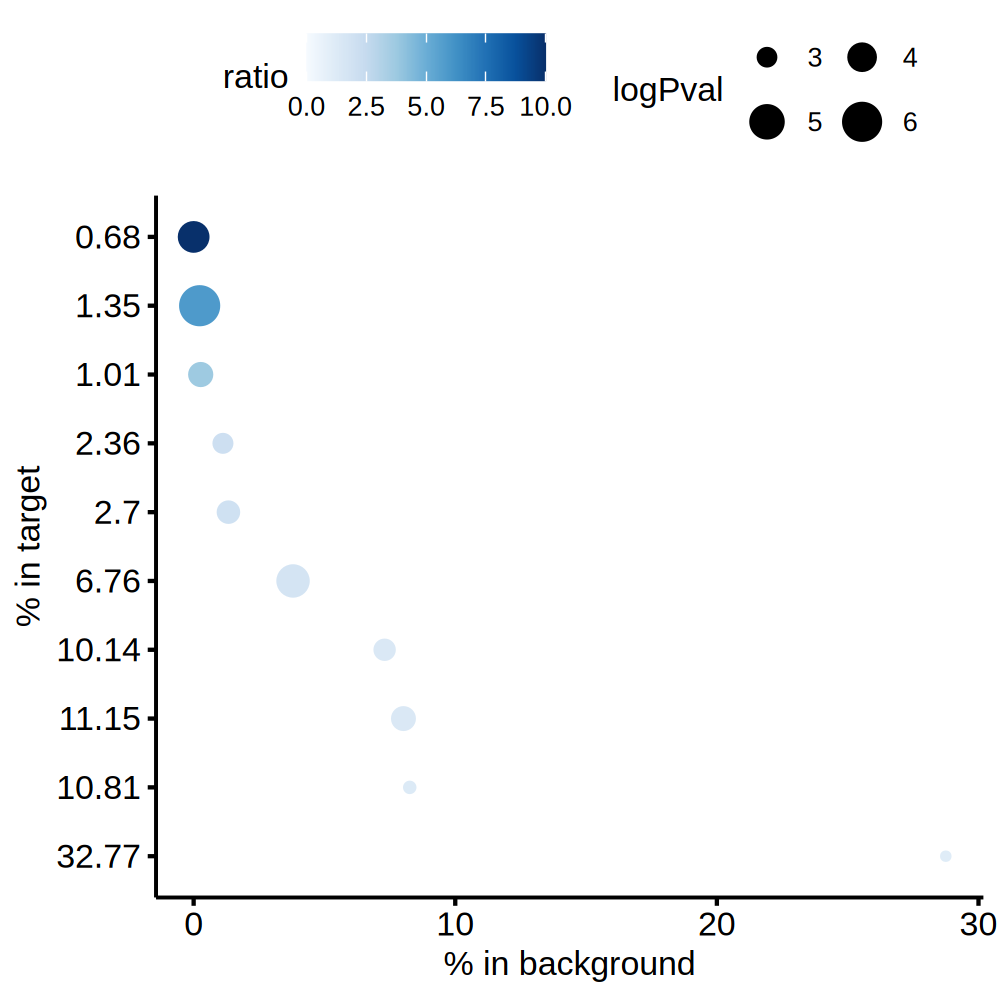

In [126]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background, ratio)] 
plotdat[ratio > 10, ratio := 10 ]
myPalette <- colorRampPalette(brewer.pal(11, "Blues"))
sc <- scale_colour_gradientn(colours = myPalette(100), limits=c(0, max(plotdat[1:10, ratio])))

ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') + sc +
guides(size=guide_legend(nrow=2,byrow=TRUE))



## run 8: DEG TE in EB & MK

In [193]:
run = 'run8' 
tmp1 = deg_telocal_dt_info[.id %in% c('EB', 'MK'), ]
dim(tmp1) # 71570
tmp2 = tmp1[logFC > 0 & PValue < 0.05, ][!duplicated(rn), ]
tmp3 = tmp1[!(rn %in% tmp2$rn), ][!duplicated(rn), ]
dim(tmp2) # 529
dim(tmp3) # 70663
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(tmp2[, .(chr, start, end, rn)], file = pos_file, sep = '\t') 
fwrite(tmp3[, .(chr, start, end, rn)], file = neg_file, sep = '\t') 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size 200 -len 8 -bg ', neg_file, ' -fdr 10 -p 10')
cmd


[1] 128870     16

[1] 417  16

[1] 23896    16

[1] "findMotifsGenome.pl data/deg_local_ltr_run8_pos.bed /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa data/run8 -size 200 -len 8 -bg data/deg_local_ltr_run8_neg.bed -fdr 10 -p 10"

Name,Consensus,P-value,target,background
<chr>,<chr>,<dbl>,<dbl>,<dbl>
ANAC017(NAC)/colamp-ANAC017-DAP-Seq(GSE60143)/Homer,TMCTTGNNNNNCAAG,0.010,1.16,0.25
AT1G19040(NAC)/col-AT1G19040-DAP-Seq(GSE60143)/Homer,CTTGNDNHNCAAGYW,0.001,1.54,0.32
bHLH157(bHLH)/col-bHLH157-DAP-Seq(GSE60143)/Homer,KACACGTCTCTY,0.010,2.90,1.20
MYB98(MYB)/col-MYB98-DAP-Seq(GSE60143)/Homer,NWDCCGTTAC,0.001,4.44,2.13
NTM2(NAC)/col-NTM2-DAP-Seq(GSE60143)/Homer,CTTRTNNNAYAAGBH,0.010,5.79,3.34
ZNF416(Zf)/HEK293-ZNF416.GFP-ChIP-Seq(GSE58341)/Homer,WDNCTGGGCA,0.001,11.39,6.94
MYB(HTH)/ERMYB-Myb-ChIPSeq(GSE22095)/Homer,GGCVGTTR,0.010,20.85,15.83
FOXA1(Forkhead)/MCF7-FOXA1-ChIP-Seq(GSE26831)/Homer,WAAGTAAACA,0.010,28.96,23.45
Tbx5(T-box)/HL1-Tbx5.biotin-ChIP-Seq(GSE21529)/Homer,AGGTGTCA,0.010,31.27,25.78


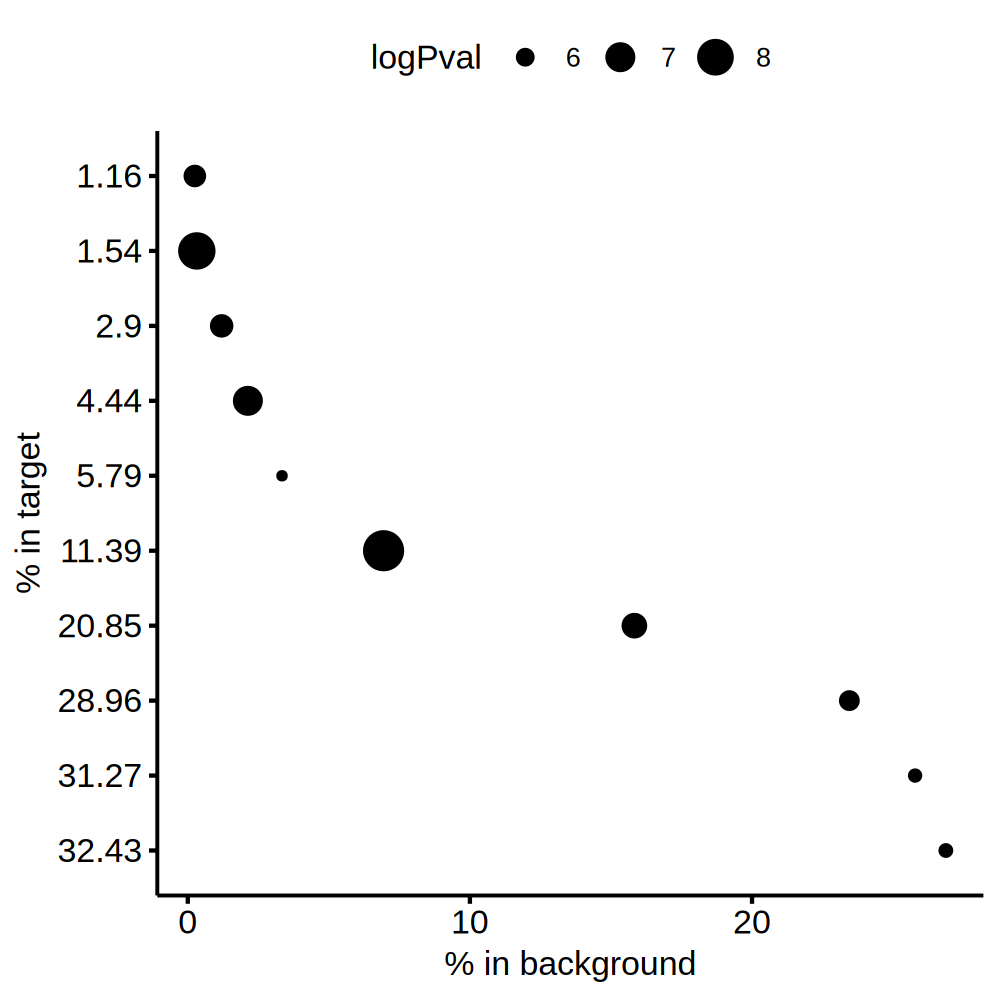

In [190]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, ratio := target / background ]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background)] 
ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T, color = 'ratio') + ylab('% in background') + xlab('% in target') 


In [ ]:
ov = coding_genes[grep('^HOX', coding_genes)]
ov = intersect(ov, rownames(logcpm_coding))
# all sig ones with FDr < 0.1
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)

plotdat = logcpm_coding[ov, rownames(dsn_all_df_n24)]

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df_n24[, 'cell_type', drop = F])
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(dsn_all_df_n24$cell_type, levels = cell_types))  
hp


In [ ]:
plotdat = logcpm_coding_t[, .(cell_type, HOXA2)]
plotdat[, cell_type := factor(cell_type, levels = cell_types)] 
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 200)
ggboxplot(plotdat, x = 'cell_type', y = 'HOXA2', outlier.shape = NA) + ylab('logCPM HOXA2')


## backup

In [ ]:
run = 'run5' 
tmp1 = deg_telocal_dt_info[class_id == 'LTR', ]
dim(tmp1) # 71570
tmp2 = tmp1[logFC < 0 & PValue < 0.05 & .id == 'CMP', ][!duplicated(rn), ]
tmp3 = tmp1[!(rn %in% tmp2$rn), ][!duplicated(rn), ]
dim(tmp2) # 529
dim(tmp3) # 70663
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(tmp2[, .(chr, start, end, rn)], file = pos_file, sep = '\t') 
fwrite(tmp3[, .(chr, start, end, rn)], file = neg_file, sep = '\t') 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size 200 -len 8 -bg ', neg_file, ' -fdr 10 -p 10')
cmd


In [ ]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 200)
plotdat = fread(paste0('data/', run, '/knownResults.txt'))
setnames(plotdat, 1, 'Name')
setnames(plotdat, 4, 'logPval')
setnames(plotdat, 7, 'target')
setnames(plotdat, 9, 'background')
plotdat[, target := as.numeric(sub('%', '', target))] 
plotdat[, background := as.numeric(sub('%', '', background))] 
plotdat[, rr := target / background ]
plotdat[, logPval := -logPval]
plotdat[, name := sub('\\(.*', '', Name)]
plotdat[1:10,][order(target), .(Name, Consensus, `P-value`, target, background)] 
ggdotchart(plotdat[1:10, ], x = 'target', size = 'logPval', y = 'background', rotate = T) + ylab('% in background') + xlab('% in target') 


In [ ]:
ov = coding_genes[grep('^HOX', coding_genes)]
ov = intersect(ov, rownames(logcpm_coding))
# all sig ones with FDr < 0.1
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)

plotdat = logcpm_coding[ov, rownames(dsn_all_df_n24)]

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df_n24[, 'cell_type', drop = F])
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(dsn_all_df_n24$cell_type, levels = cell_types))  
hp


In [ ]:
plotdat = logcpm_coding_t[, .(cell_type, HOXA2)]
plotdat[, cell_type := factor(cell_type, levels = cell_types)] 
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 200)
ggboxplot(plotdat, x = 'cell_type', y = 'HOXA2', outlier.shape = NA) + ylab('logCPM HOXA2')


In [ ]:
run = 'run2'
tmp1 = deg_telocal_dt_info[class_id == 'LTR', ]
dim(tmp1) # 71570
tmp2 = tmp1[logFC < 0 & PValue < 0.01 & .id == 'CMP', ] 
tmp3 = tmp1[!(rn %in% tmp2$rn), ]
dim(tmp2) # 529
dim(tmp3) # 70663
pos_file = paste0('data/deg_local_ltr_', run, '_pos.bed')
neg_file = paste0('data/deg_local_ltr_', run, '_neg.bed')
fwrite(tmp2[, .(chr, start, end, rn)], file = pos_file, sep = '\t') 
fwrite(tmp3[, .(chr, start, end, rn)], file = neg_file, sep = '\t') 
cmd = paste0('findMotifsGenome.pl ', pos_file, ' ', REFERENCE_GENOME_FASTA, ' data/', run, ' -size 200 -len 8 -bg ', neg_file, ' -fdr 10 -p 10')
cmd


In [51]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan"

In [46]:
tmp = deg_telocal_dt_info[abs(logFC) > 2 & PValue < 0.01, ]
table(tmp[, class_id])
table(deg_telocal_dt_info[, class_id])
dim(tmp)


       DNA       LINE        LTR Retroposon  Satellite       SINE    Unknown 
       553       4701        907          2         84       1293          6 


       DNA       DNA?       LINE        LTR         RC Retroposon  Satellite 
     49062         40     443738      71570          8        143       3039 
      SINE    Unknown 
    115553        512 

[1] 7546   16

Submitted	7/8/2024, 3:25:19 PM
Expires	7/12/2024, 3:25:19 PM
(Primary) Sequences	A set of 296 DNA sequences, between 4023 and 11202 in length (average length 4601.7), from the file target.fa.
Control Sequences	A set of 1433 DNA sequences, between 4011 and 12427 in length (average length 4614.8), from the file background.fa.
Background	A 0-order background model generated from the supplied sequences.
Discovery Mode	Differential Enrichment: optimizes the significance of the relative enrichment of motif sites
Site Distribution	Zero or one occurrence (of a contributing motif site) per sequence.
Motif Count	Searching for 3 motifs.
Motif Width	Between 6 wide and 50 wide (inclusive).

# motif analysis followed

In [193]:
gene_sel = c('ZNF317', 'ZNF41', 'ZNF711', 'STAT3', 'STAT5', 'NR1H3', 'NR1H4', 'SPI1', 'BCL11A', 'RBPJ', 'CTCF', 
             'FOXA1', 'SF1', 'HOXA9', 'LIN28A', 'UPC2', 'DAZAP1', 'CNOT4', 'ZKSCAN1', 'HNRNPA2B1'
)

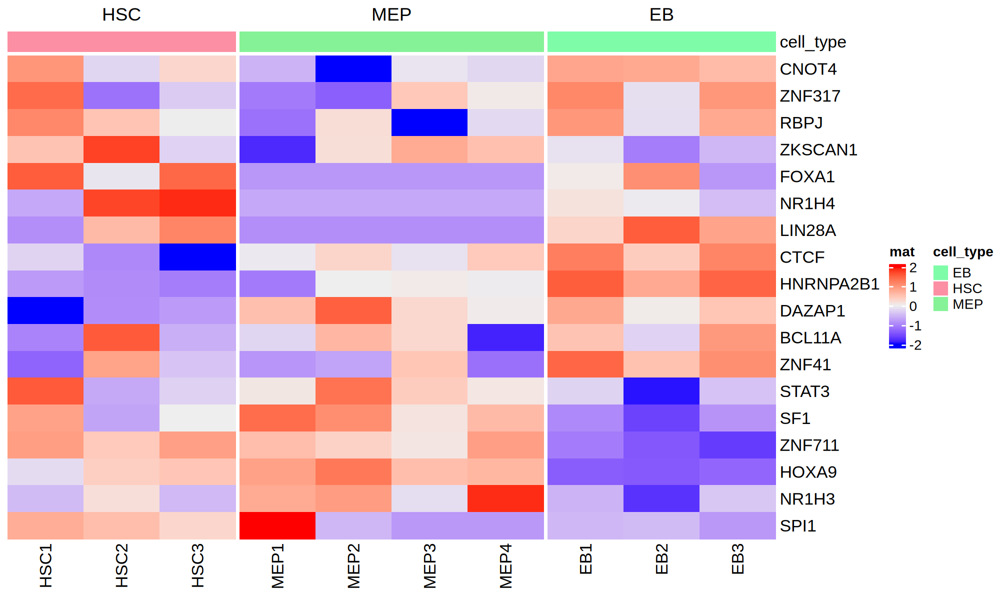

In [195]:
dsn_sel = dsn_telocal[dsn_telocal$cell_type %in% c('HSC', 'MEP', 'EB'), , drop = F]
plotdat = logcpm_all[rownames(logcpm_all) %in% gene_sel, rownames(dsn_sel)] 

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
column_ha = HeatmapAnnotation(df = dsn_sel[, 'cell_type', drop = F])

options(repr.plot.width = 10, repr.plot.height = 6, repr.plot.res = 200)
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,   row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(dsn_sel$cell_type, levels = cell_types))  
hp


In [207]:
hgnc = fread('hgnc_complete_set.txt')
dim(hgnc)


[1] 43857    54

In [221]:
head(hgnc[grep('STAT', symbol), .(symbol, gene_group)])

symbol,gene_group
<chr>,<chr>
STAT1,SH2 domain containing
STAT2,SH2 domain containing
STAT3,SH2 domain containing
STAT4,SH2 domain containing
STAT4-AS1,Antisense RNAs
STAT5A,SH2 domain containing


In [210]:
dim(plotdat)

[1] 736  10

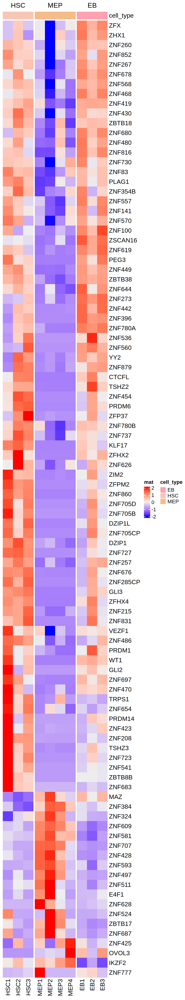

In [238]:
gene_sel = hgnc[grep('STAT', symbol), symbol]
gene_sel = hgnc[grep('Forkhead boxes', gene_group), symbol]
gene_sel = hgnc[grep('Zinc fingers C2H2-type', gene_group), symbol]
gene_sel = intersect(gene_sel, deg_coding_dt[PValue < 0.05 & .id == 'MEP', rn])
dsn_sel = dsn_telocal[dsn_telocal$cell_type %in% c('HSC', 'MEP', 'EB'), , drop = F]
plotdat = logcpm_all[rownames(logcpm_all) %in% gene_sel, rownames(dsn_sel)] 

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
column_ha = HeatmapAnnotation(df = dsn_sel[, 'cell_type', drop = F])

options(repr.plot.width = 5, repr.plot.height = 27, repr.plot.res = 200)
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,   row_names_gp = grid::gpar(size = 5), 
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(dsn_sel$cell_type, levels = cell_types))  
hp


In [235]:
head(deg_coding_dt)

.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
HSC,OR11K2P,9.380614,-2.944438,2.118393e-09,0.0000838354
HSC,LOC124906836,7.401834,-2.141472,2.917073e-08,0.0005772158
HSC,RPL31P64,8.223059,-3.186283,6.894059e-08,0.0009094413
HSC,KRTAP6-1,7.981290,-4.024737,9.548944e-08,0.0009447486
HSC,PCDHA7,7.744114,-4.179213,1.936259e-07,0.0015325491
HSC,PRPF4BP1,5.585529,-3.700205,5.287894e-07,0.0034878068


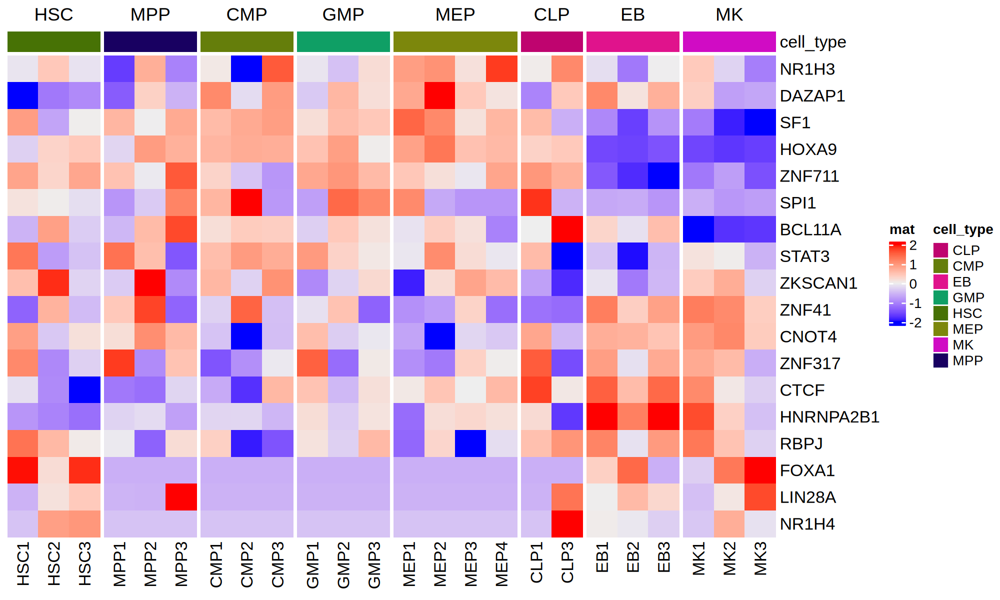

In [196]:
dsn_sel = dsn_telocal[dsn_telocal$cell_type %in% c('MEP', 'EB', 'MK'), , drop = F]
plotdat = logcpm_all[rownames(logcpm_all) %in% gene_sel, rownames(dsn_telocal)] 

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])

options(repr.plot.width = 10, repr.plot.height = 6, repr.plot.res = 200)
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,   row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  
hp


In [ ]:
# all sig ones with FDr < 0.1
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)

dsn_row = unique(deg_MEP__EB_MK[FDR < .1 & abs(logFC) > 1 & class_id %in% c('LTR', 'Retroposon', 'DNA'), ])
dsn_row = setDF(dsn_row, rownames = dsn_row$rn)
sel = dsn_row$rn
plotdat = logcpm_telocal_mep[sel1, ] 
dim(plotdat)

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_sel[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = dsn_row[, c('class_id'), drop = F]) 

options(repr.plot.width = 10, repr.plot.height = 14, repr.plot.res = 200)
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,   row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha,  left_annotation = column_ra, row_split = dsn_row$class_id,
        column_split = factor(dsn_sel$cell_type, levels = cell_types))  
hp


[1] 3867   10

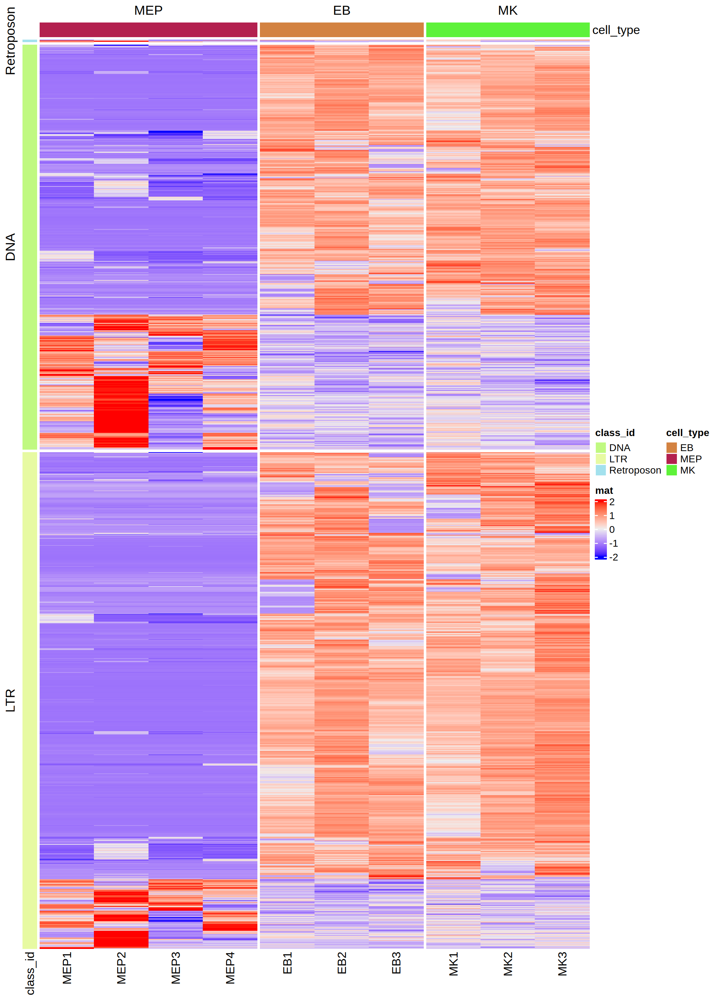

In [114]:
# all sig ones with FDr < 0.1
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)

dsn_row = unique(deg_MEP__EB_MK[FDR < .1 & abs(logFC) > 1 & class_id %in% c('LTR', 'Retroposon', 'DNA'), ])
dsn_row = setDF(dsn_row, rownames = dsn_row$rn)
sel = dsn_row$rn
plotdat = logcpm_telocal_mep[sel1, ] 
dim(plotdat)

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_sel[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = dsn_row[, c('class_id'), drop = F]) 

options(repr.plot.width = 10, repr.plot.height = 14, repr.plot.res = 200)
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,   row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha,  left_annotation = column_ra, row_split = dsn_row$class_id,
        column_split = factor(dsn_sel$cell_type, levels = cell_types))  
hp

In [80]:
head(logcpm_telocal_mep)

,MEP1,MEP2,MEP3,MEP4,EB1,EB2,EB3,MK1,MK2,MK3
AluJb_dup100004:AluJb:Alu:SINE,1.4349667,1.496906,0.000000,1.0370980,1.9615589,1.4581888,1.536417,2.547558,2.5274319,1.2862370
AluJb_dup100089:AluJb:Alu:SINE,2.7777866,1.005737,0.000000,0.0000000,1.9615589,1.7829292,2.314491,3.500016,2.6778989,2.6144123
AluJb_dup100090:AluJb:Alu:SINE,0.3764291,1.005737,0.000000,0.0000000,0.9272705,1.4581888,2.115751,2.258034,2.1347538,2.8420784
AluJb_dup100092:AluJb:Alu:SINE,1.3197360,0.000000,0.000000,0.2050833,2.6911350,2.3095568,2.857365,3.060589,2.4717863,2.8162977
AluJb_dup100111:AluJb:Alu:SINE,3.2634273,5.616625,2.820710,2.2669411,2.4590079,0.6013289,1.867464,1.664330,0.5174381,0.0000000
AluJb_dup100112:AluJb:Alu:SINE,3.3472455,4.848715,2.998499,3.3905084,2.6911350,0.9742138,2.115751,2.258034,1.6226195,0.6275667


In [ ]:
chr2    113281073       113285306       MER4-int_dup620:MER4-int:ERV1:LTR

In [21]:
113281073 - 113285306

[1] -4233

In [13]:
data(ArabidopsisPromoters)

In [14]:
ArabidopsisPromoters

DNAStringSet object of length 50:
     width seq                                              names               
 [1]  1000 CATACAAGTAACAGAAAAACCGA...ACACTTTTGTCCGAAAACTAAG AT4G28150
 [2]  1000 TCGCTCATAGTTCTCCTAGATCG...AAATCCCAGTATTACCAACTTC AT1G19380
 [3]  1000 AATTGAAGGCTTTTACATCTTGG...TTGAAAGTCTTCAAGCAGACGC AT4G19520
 [4]  1000 TCGTAAAGTTAAAGGGAGACGTC...TTTAATAATCACATCTCTTACC AT1G03850
 [5]  1000 TACTTTTATGGATCATCATCAGA...TGTGTAATGACGATGAAAGATG AT5G01810
 ...   ... ...
[46]  1000 ACAGCAAAAACTGAGGTGCGAAC...CAGAGAGGACTGAGGAAATTCA AT5G22690
[47]  1000 GAATTGTGATACTATACTAATTG...GCCGTGCCCTTCATTTTCAGAA AT1G05670
[48]  1000 CATGCTTGGTTGGTTCTTCTTGT...AAACTTAGTGCCACTTAGACAC AT1G06160
[49]  1000 AGTTTATTGAATTAAGTTTTTAG...TAAGGAACGTTCAAGAACCAAA AT5G24660
[50]  1000 AGCGGTATATAAAAGTTAGTGCT...AGGATGTTGATGCATGAAAATC AT3G19200

In [ ]:
scan_sequences

# TE summary based on GTF

In [52]:
telocal_sel = fread('data/telocal_sel.xls')
head(telocal_sel)


rn,.id,logFC,logCPM,PValue,FDR,updn,tag,chr,rmsk,⋯,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd_2
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP,-10.394113,6.156018,1.119425e-03,0.09111988,dn,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,32919806,32920060,1044,-,.,ALR/Alpha,ALR/Alpha_dup314,centr,Satellite,chr16_32919806_32920060__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite
ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP,-10.394113,6.156018,1.119425e-03,0.09111988,dn,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,32920075,32952929,1308,-,.,ALR/Alpha,ALR/Alpha_dup314,centr,Satellite,chr16_32920075_32952929__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite
ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,MEP,-10.519311,6.279623,8.760105e-04,0.08353937,dn,MEP_ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,32952964,32975480,1325,+,.,ALR/Alpha,ALR/Alpha_dup315,centr,Satellite,chr16_32952964_32975480__ALR/Alpha_dup315:ALR/Alpha:centr:Satellite
ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,CLP,7.377682,3.151155,1.170015e-04,0.55519789,up,CLP_ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,chr15,UCSC_rmsk,⋯,15876497,15883791,1177,+,.,ALR/Alpha,ALR/Alpha_dup426,centr,Satellite,chr15_15876497_15883791__ALR/Alpha_dup426:ALR/Alpha:centr:Satellite
ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,MEP,-10.245376,6.009376,1.407620e-03,0.09796758,dn,MEP_ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,chr12,UCSC_rmsk,⋯,34408244,34452774,1272,-,.,ALR/Alpha,ALR/Alpha_dup602,centr,Satellite,chr12_34408244_34452774__ALR/Alpha_dup602:ALR/Alpha:centr:Satellite
ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,MPP,6.753373,4.349032,2.443891e-05,0.17332893,up,MPP_ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,chr9,UCSC_rmsk,⋯,42411679,42415274,1195,-,.,ALR/Alpha,ALR/Alpha_dup787,centr,Satellite,chr9_42411679_42415274__ALR/Alpha_dup787:ALR/Alpha:centr:Satellite


In [65]:
nrow(telocal_sel)

[1] 1505

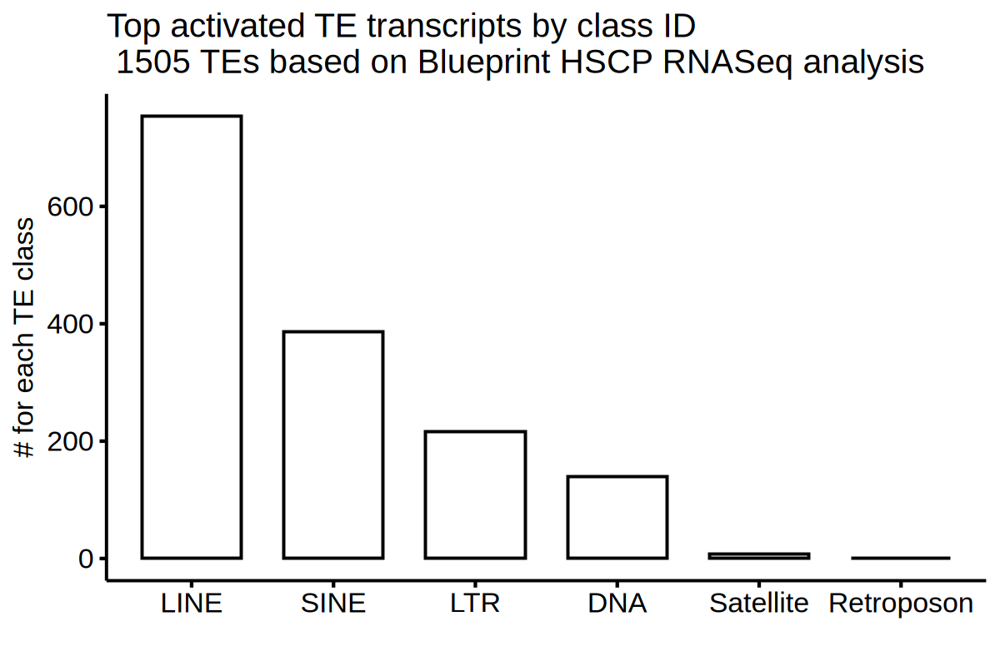

In [67]:
telocal_sel[, nn := nrow(.SD), by = 'class_id']
plotdat = telocal_sel[!duplicated(class_id), ]
plotdat = plotdat[order(nn, decreasing = T), ]

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
ggbarplot(plotdat, x = 'class_id', y = 'nn') + xlab('') + ylab('# for each TE class') + 
ggtitle('Top activated TE transcripts by class ID\n 1505 TEs based on Blueprint HSCP RNASeq analysis')


In [13]:
te_dt[, ww := end - start ] 


In [23]:
class_id_freq = table(te_dt$class_id)
class_id_freq = as.data.table(class_id_freq)
setnames(class_id_freq, c('class_id', 'number'))
class_id_freq = class_id_freq[order(number, decreasing = T), ]
class_id_freq

class_id,number
<chr>,<int>
SINE,1782180
LINE,1567840
LTR,751651
DNA,527321
Satellite,49729
Unknown,23274
Retroposon,7380
RC,2267
DNA?,148


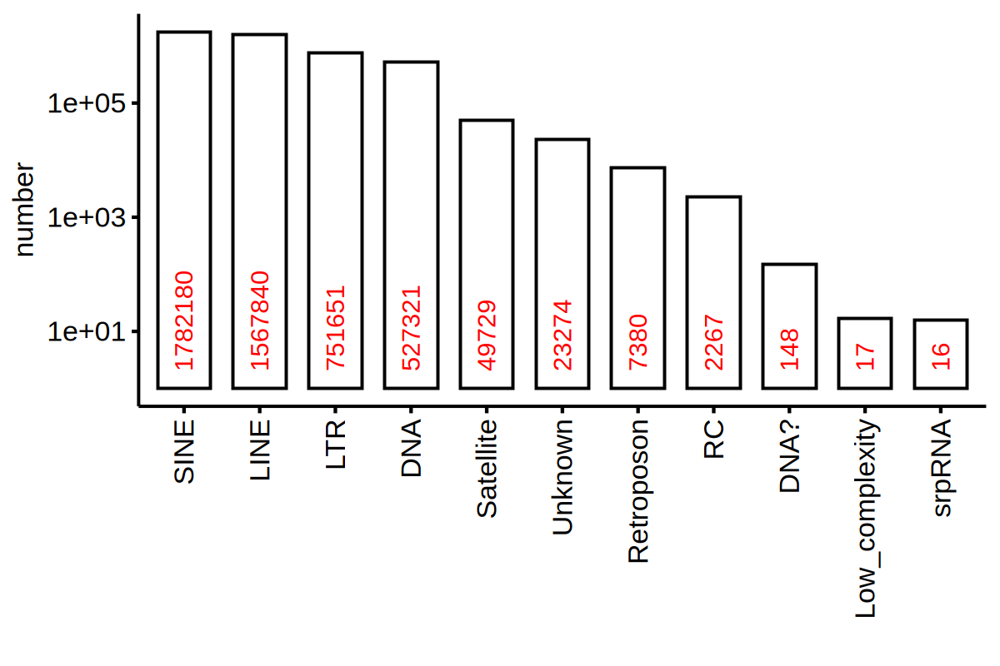

In [45]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
ggbarplot(class_id_freq, x = 'class_id', y = 'number') + theme(axis.text.x = element_text(angle = 90, vjust = .5, hjust = 1)) + xlab('') + 
scale_y_continuous(trans='log10') + annotate(geom = "text", x = 1:11, y = 2, label = class_id_freq$number, color = "red", angle = 90, vjust = .5, hjust = 0)



In [49]:
te_dt[, family_nn := nrow(.SD), by = 'family_id' ] 
family_id_nn = te_dt[!duplicated(family_id), ] 
head(family_id_nn)


chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2,ww,ll,family_nn
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite,chr1_2710_4402__TAR1_dup164:TAR1:subtelo:Satellite,1692,164841316,201
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR,chr1_4083_4533__LTR60B_dup190:LTR60B:ERV1:LTR,450,273806534,183553
chr1,UCSC_rmsk,exon,4664,5263,1304,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_4664_5263__L1MC3_dup5932:L1MC3:L1:LINE,599,636588645,981465
chr1,UCSC_rmsk,exon,5687,6131,2442,+,.,MSTA1,MSTA1_dup469,ERVL-MaLR,LTR,MSTA1_dup469:MSTA1:ERVL-MaLR:LTR,chr1_5687_6131__MSTA1_dup469:MSTA1:ERVL-MaLR:LTR,444,273806534,351557
chr1,UCSC_rmsk,exon,12273,12571,2329,+,.,AluY,AluY_dup96151,Alu,SINE,AluY_dup96151:AluY:Alu:SINE,chr1_12273_12571__AluY_dup96151:AluY:Alu:SINE,298,392098234,1205643
chr1,UCSC_rmsk,exon,14342,14427,190,+,.,MIRb,MIRb_dup184492,MIR,SINE,MIRb_dup184492:MIRb:MIR:SINE,chr1_14342_14427__MIRb_dup184492:MIRb:MIR:SINE,85,392098234,574467


In [47]:
te_dt[, ll := sum(.SD$ww), by = 'class_id']
class_id_ll = te_dt[!duplicated(class_id), ]
class_id_ll


chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2,ww,ll
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite,chr1_2710_4402__TAR1_dup164:TAR1:subtelo:Satellite,1692,164841316
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR,chr1_4083_4533__LTR60B_dup190:LTR60B:ERV1:LTR,450,273806534
chr1,UCSC_rmsk,exon,4664,5263,1304,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_4664_5263__L1MC3_dup5932:L1MC3:L1:LINE,599,636588645
chr1,UCSC_rmsk,exon,12273,12571,2329,+,.,AluY,AluY_dup96151,Alu,SINE,AluY_dup96151:AluY:Alu:SINE,chr1_12273_12571__AluY_dup96151:AluY:Alu:SINE,298,392098234
chr1,UCSC_rmsk,exon,19731,19815,295,-,.,MER112,MER112_dup3643,hAT-Charlie,DNA,MER112_dup3643:MER112:hAT-Charlie:DNA,chr1_19731_19815__MER112_dup3643:MER112:hAT-Charlie:DNA,84,109266601
chr1,UCSC_rmsk,exon,61829,61890,241,-,.,UCON41,UCON41_dup503,Unknown,Unknown,UCON41_dup503:UCON41:Unknown:Unknown,chr1_61829_61890__UCON41_dup503:UCON41:Unknown:Unknown,61,5391325
chr1,UCSC_rmsk,exon,157687,157800,355,+,.,SVA_E,SVA_E_dup842,SVA,Retroposon,SVA_E_dup842:SVA_E:SVA:Retroposon,chr1_157687_157800__SVA_E_dup842:SVA_E:SVA:Retroposon,113,4668727
chr1,UCSC_rmsk,exon,3260748,3260858,270,-,.,Helitron3Na_Mam,Helitron3Na_Mam_dup821,Helitron,RC,Helitron3Na_Mam_dup821:Helitron3Na_Mam:Helitron:RC,chr1_3260748_3260858__Helitron3Na_Mam_dup821:Helitron3Na_Mam:Helitron:RC,110,458721
chr1,UCSC_rmsk,exon,19940621,19940634,307,-,.,7SLRNA,AluY_dup97248,srpRNA,srpRNA,AluY_dup97248:7SLRNA:srpRNA:srpRNA,chr1_19940621_19940634__AluY_dup97248:7SLRNA:srpRNA:srpRNA,13,724


In [17]:
options(repr.plot.width = 10, repr.plot.height = 7, repr.plot.res = 200)
ggbarplot(te_dt, 'class_id')

In [16]:
te_dt[class_id == 'LTR' & ww > 100000, ]

chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2,ww
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
chrY,UCSC_rmsk,exon,20961204,21226263,2653,-,.,LTR12B,LTR12B_dup126,ERV1,LTR,LTR12B_dup126:LTR12B:ERV1:LTR,chrY_20961204_21226263__LTR12B_dup126:LTR12B:ERV1:LTR,265059


In [ ]:
ggdensity(te_dt, x = "weight", fill = "lightgray", add = "mean", rug = TRUE) + facet_by 


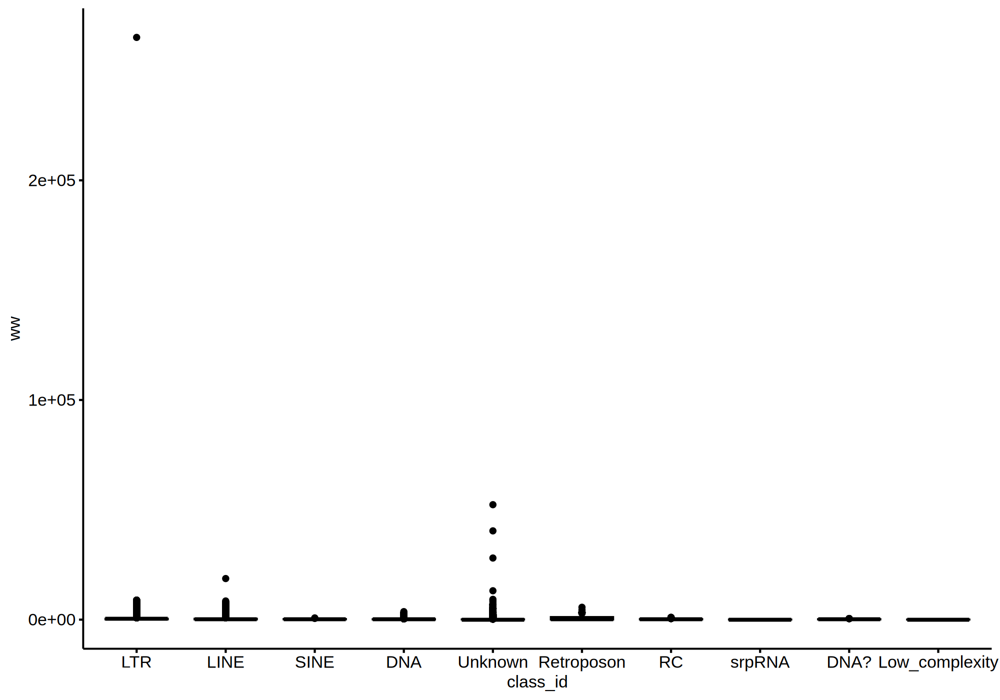

In [15]:
options(repr.plot.width = 10, repr.plot.height = 7, repr.plot.res = 200)
ggboxplot(te_dt[class_id != 'Satellite', ], x = 'class_id', y = 'ww')

In [12]:
head(te_dt)

chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite,chr1_2710_4402__TAR1_dup164:TAR1:subtelo:Satellite
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR,chr1_4083_4533__LTR60B_dup190:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4534,4660,505,-,.,LTR60B,LTR60B_dup191,ERV1,LTR,LTR60B_dup191:LTR60B:ERV1:LTR,chr1_4534_4660__LTR60B_dup191:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4664,5263,1304,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_4664_5263__L1MC3_dup5932:L1MC3:L1:LINE
chr1,UCSC_rmsk,exon,5275,5528,1403,+,.,MER34C_v,MER34C_v_dup375,ERV1,LTR,MER34C_v_dup375:MER34C_v:ERV1:LTR,chr1_5275_5528__MER34C_v_dup375:MER34C_v:ERV1:LTR
chr1,UCSC_rmsk,exon,5529,5686,3544,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_5529_5686__L1MC3_dup5932:L1MC3:L1:LINE


In [51]:
head(telocal_sel)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'telocal_sel' not found


# annotate and summarize top TE

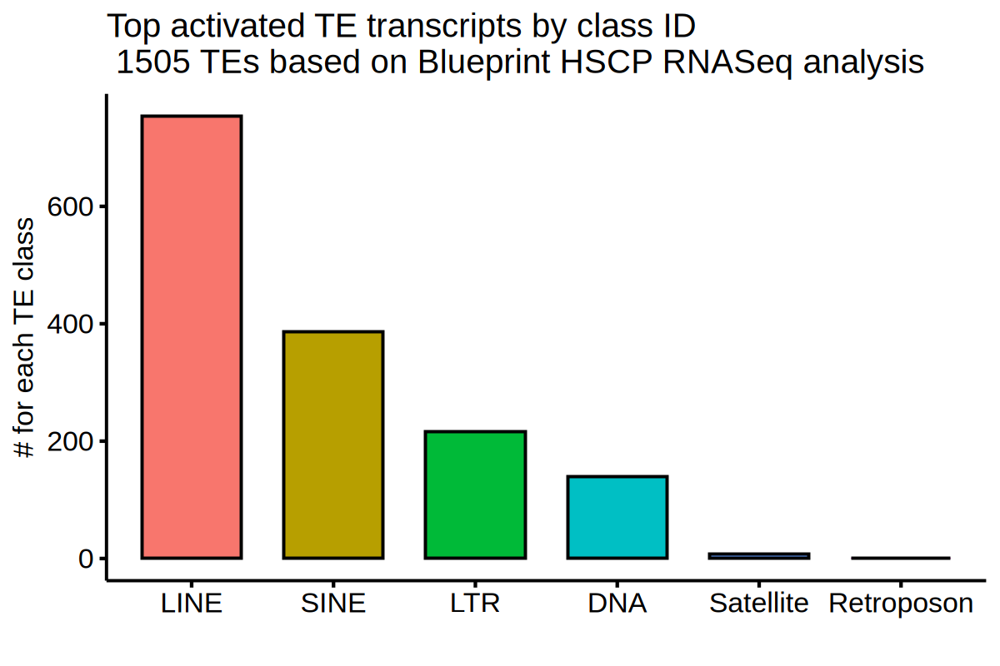

In [73]:
telocal_sel_seqino = copy(telocal_sel)
telocal_sel_seqino[, nn := nrow(.SD), by = 'class_id']
plotdat = telocal_sel_seqino[!duplicated(class_id), ]
plotdat = plotdat[order(nn, decreasing = T), ]

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
ggbarplot(plotdat, x = 'class_id', y = 'nn', fill = 'class_id') + xlab('') + ylab('# for each TE class') + 
ggtitle('Top activated TE transcripts by class ID\n 1505 TEs based on Blueprint HSCP RNASeq analysis') + rremove('legend')


In [51]:
telocal_sel_seqino = merge(telocal_sel, te_dt, by.x = 'rn', by.y = 'idd', all.x = T)
telocal_sel_seqino[, ctype_gene := paste0(.id, '__', rn)]
telocal_sel_seqino[, cell_type := .id]
fwrite(telocal_sel_seqino, file = 'data/telocal_sel_may29.xls', sep = '\t')


In [59]:
head(telocal_sel_seqino)

rn,.id,logFC,logCPM,PValue,FDR,updn,tag,chr,rmsk,⋯,width,strand,score,gene_id,transcript_id,family_id,class_id,idd_2,ctype_gene,cell_type
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP,-10.394113,6.156018,1.119425e-03,0.09111988,dn,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,1044,-,.,ALR/Alpha,ALR/Alpha_dup314,centr,Satellite,chr16_32919806_32920060__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP
ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP,-10.394113,6.156018,1.119425e-03,0.09111988,dn,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,1308,-,.,ALR/Alpha,ALR/Alpha_dup314,centr,Satellite,chr16_32920075_32952929__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP
ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,MEP,-10.519311,6.279623,8.760105e-04,0.08353937,dn,MEP_ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,1325,+,.,ALR/Alpha,ALR/Alpha_dup315,centr,Satellite,chr16_32952964_32975480__ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,MEP__ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,MEP
ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,CLP,7.377682,3.151155,1.170015e-04,0.55519789,up,CLP_ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,chr15,UCSC_rmsk,⋯,1177,+,.,ALR/Alpha,ALR/Alpha_dup426,centr,Satellite,chr15_15876497_15883791__ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,CLP__ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,CLP
ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,MEP,-10.245376,6.009376,1.407620e-03,0.09796758,dn,MEP_ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,chr12,UCSC_rmsk,⋯,1272,-,.,ALR/Alpha,ALR/Alpha_dup602,centr,Satellite,chr12_34408244_34452774__ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,MEP__ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,MEP
ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,MPP,6.753373,4.349032,2.443891e-05,0.17332893,up,MPP_ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,chr9,UCSC_rmsk,⋯,1195,-,.,ALR/Alpha,ALR/Alpha_dup787,centr,Satellite,chr9_42411679_42415274__ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,MPP__ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,MPP


In [60]:
tmp = data.frame(seqname = telocal_sel_seqino$chr, start = telocal_sel_seqino$start, end = telocal_sel_seqino$end, name = telocal_sel_seqino$ctype_gene)
gr = GRanges(tmp)
gr_anno = annotatePeak(gr, TxDb=txdb, tssRegion=c(-3000, 3000), verbose=FALSE, annoDb = 'org.Hs.eg.db', addFlankGeneInfo = T)
telocal_anno_dt = as.data.table(gr_anno@anno, keep.rownames = T)
head(telocal_anno_dt)


'select()' returned 1:many mapping between keys and columns

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


rn,seqnames,start,end,width,strand,name,annotation,geneChr,geneStart,⋯,geneStrand,geneId,transcriptId,distanceToTSS,ENSEMBL,SYMBOL,GENENAME,flank_txIds,flank_geneIds,flank_gene_distances
<chr>,<fct>,<int>,<int>,<int>,<fct>,<chr>,<chr>,<int>,<int>,⋯,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,chr16,32919806,32920060,255,*,MEP__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,"Exon (ENST00000621154.1/ENST00000621154.1, exon 4 of 15)",16,32878706,⋯,2,386757,ENST00000431994.5,-34305,ENSG00000290985,SLC6A10P,"solute carrier family 6 member 10, pseudogene",NA,NA,NA
2,chr16,32920075,32952929,32855,*,MEP__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,"Exon (ENST00000621154.1/ENST00000621154.1, exon 5 of 15)",16,32878706,⋯,2,386757,ENST00000431994.5,-34574,ENSG00000290985,SLC6A10P,"solute carrier family 6 member 10, pseudogene",NA,NA,NA
3,chr16,32952964,32975480,22517,*,MEP__ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,"Exon (ENST00000567619.1/ENST00000567619.1, exon 2 of 3)",16,32878706,⋯,2,386757,ENST00000431994.5,-67463,ENSG00000290985,SLC6A10P,"solute carrier family 6 member 10, pseudogene",NA,NA,NA
4,chr15,15876497,15883791,7295,*,CLP__ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,Distal Intergenic,15,20012741,⋯,1,105379202,ENST00000611556.1,-4128950,NA,FAM30B,family with sequence similarity 30 member B,NA,NA,NA
5,chr12,34408244,34452774,44531,*,MEP__ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,Distal Intergenic,12,34191037,⋯,2,124903068,ENST00000660987.1,-188998,NA,LOC124903068,uncharacterized LOC124903068,NA,NA,NA
6,chr9,42411679,42415274,3596,*,MPP__ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,"Exon (ENST00000454088.2/ENST00000454088.2, exon 1 of 1)",9,42566993,⋯,2,103908605,ENST00000428895.1,154036,NA,FAM88E,family with sequence similarity 88 member E,NA,NA,NA


In [61]:
telocal_sel_seqino_ann = merge(telocal_sel_seqino[!duplicated(ctype_gene), ], telocal_anno_dt, by.x = 'ctype_gene', by.y = 'name', all.x = T)

In [50]:
head(telocal_sel_seqino_ann)
dim(telocal_sel_seqino_ann)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'telocal_sel_seqino_ann' not found


In [11]:
head(te_dt)


chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite,chr1_2710_4402__TAR1_dup164:TAR1:subtelo:Satellite
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR,chr1_4083_4533__LTR60B_dup190:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4534,4660,505,-,.,LTR60B,LTR60B_dup191,ERV1,LTR,LTR60B_dup191:LTR60B:ERV1:LTR,chr1_4534_4660__LTR60B_dup191:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4664,5263,1304,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_4664_5263__L1MC3_dup5932:L1MC3:L1:LINE
chr1,UCSC_rmsk,exon,5275,5528,1403,+,.,MER34C_v,MER34C_v_dup375,ERV1,LTR,MER34C_v_dup375:MER34C_v:ERV1:LTR,chr1_5275_5528__MER34C_v_dup375:MER34C_v:ERV1:LTR
chr1,UCSC_rmsk,exon,5529,5686,3544,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_5529_5686__L1MC3_dup5932:L1MC3:L1:LINE


In [63]:
gr_anno

Annotated peaks generated by ChIPseeker
1505/1505  peaks were annotated
Genomic Annotation Summary:
             Feature  Frequency
8   Promoter (<=1kb)  9.7674419
9   Promoter (1-2kb)  5.8471761
10  Promoter (2-3kb)  5.1827243
4             5' UTR  0.3986711
3             3' UTR  3.0564784
1           1st Exon  1.1295681
6         Other Exon  2.7242525
2         1st Intron 15.1495017
7       Other Intron 27.1096346
5  Distal Intergenic 29.6345515

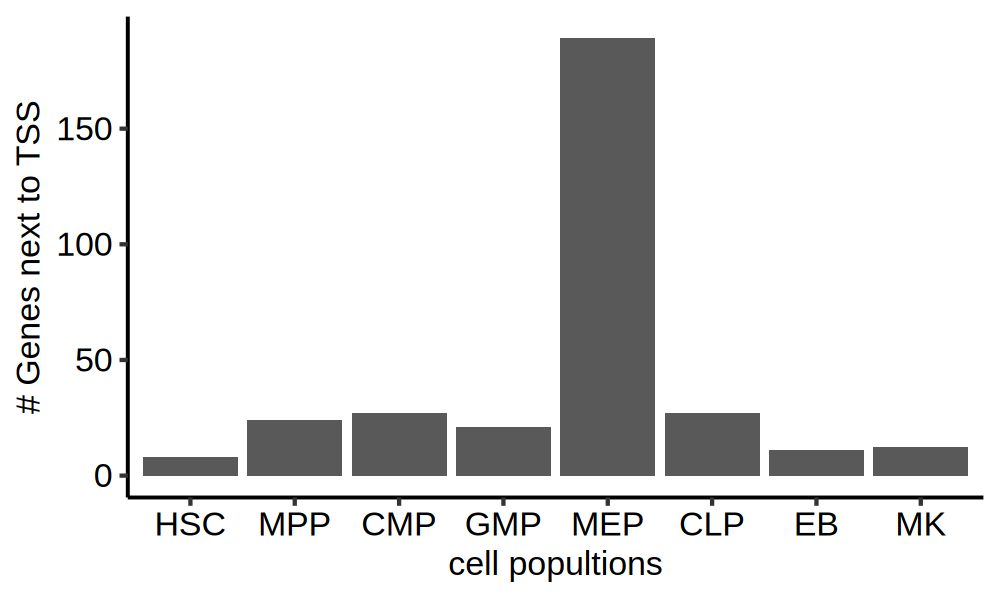

In [70]:
tmp = as.data.frame.matrix(table(telocal_sel_seqino_ann[!is.na(SYMBOL) & abs(distanceToTSS) < 3100, SYMBOL],  telocal_sel_seqino_ann[!is.na(SYMBOL) & abs(distanceToTSS) < 3100, cell_type]) )
tmp2 = as.data.table(apply(tmp, 2, sum), keep.rownames = T)
setnames(tmp2, c('cell_type', 'ene_num'))
tmp2[, cell_type := factor(cell_type, levels = c(cell_types))] 
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(tmp2, aes(cell_type, ene_num)) + geom_bar(stat = 'identity') + theme_pubr() + xlab('cell popultions') + ylab('# Genes next to TSS')


In [71]:
gs = telocal_sel_seqino_ann[!is.na(SYMBOL) & abs(distanceToTSS) < 3000 & cell_type == 'CMP', SYMBOL]
yy = enrichGO(gs, OrgDb = org.Hs.eg.db, keyType = 'SYMBOL', ont="BP", pvalueCutoff=0.01)


In [ ]:
enrichGO

In [ ]:
yy_res = as.data.table(yy@result)
yy_res = yy_res[order(pvalue), ]


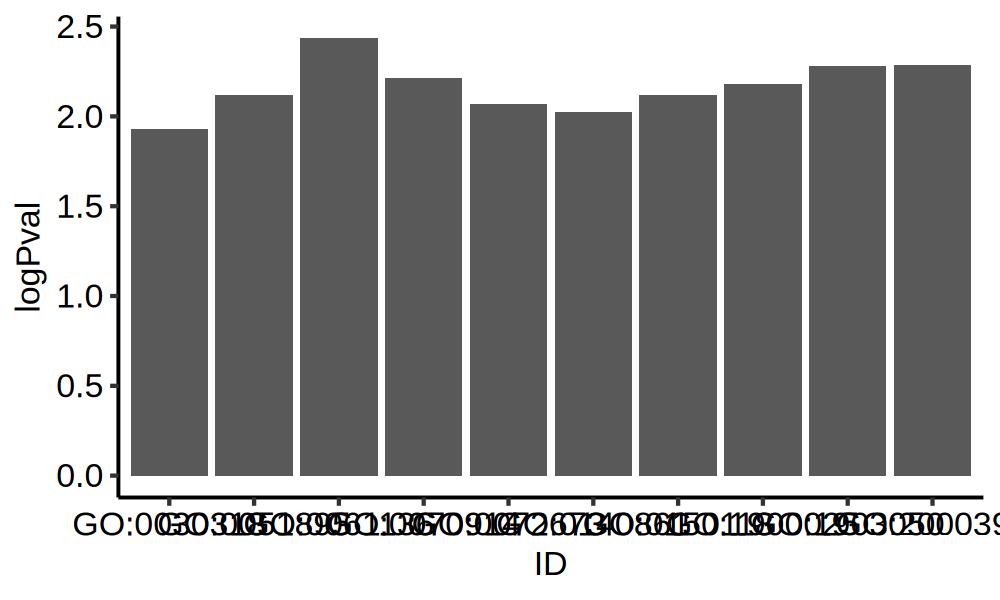

In [78]:
yy_res[, logPval := -log(pvalue, 10)] 
ggplot(yy_res[1:10, ], aes(ID, logPval)) + geom_bar(stat = 'identity') + theme_pubr()


In [75]:
head(yy_res)
                

ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count,logFDR
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>
GO:0061136,regulation of proteasomal protein catabolic process,2/9,196/18870,0.003683105,0.1072957,0.06507301,PSMC2/FHIT,2,0.9694178
GO:2000392,regulation of lamellipodium morphogenesis,1/9,11/18870,0.005235313,0.1072957,0.06507301,CORO1C,1,0.9694178
GO:1903050,regulation of proteolysis involved in protein catabolic process,2/9,235/18870,0.005248195,0.1072957,0.06507301,PSMC2/FHIT,2,0.9694178
GO:0070914,UV-damage excision repair,1/9,13/18870,0.006184567,0.1072957,0.06507301,DDB2,1,0.9694178
GO:1900025,negative regulation of substrate adhesion-dependent cell spreading,1/9,14/18870,0.006658891,0.1072957,0.06507301,CORO1C,1,0.9694178
GO:0051895,negative regulation of focal adhesion assembly,1/9,16/18870,0.007606937,0.1072957,0.06507301,CORO1C,1,0.9694178


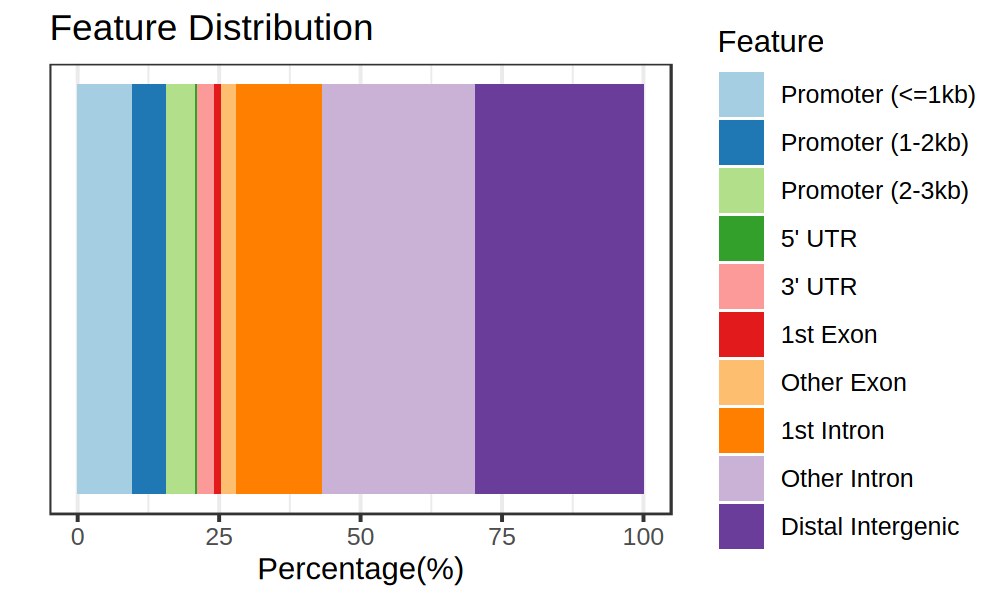

In [79]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
plotAnnoBar(gr_anno)

# TE tree plot

## prepare the data

In [ ]:
# lvl1 : TE => class id
# lvl2 : class id => family id
# lvl3 : family id => gene id
# lvl4 : gene id => transcript id

In [108]:
graph_dt = readRDS('data/te_dt_may08.rds')
graph_dt[class_id == family_id, family_id := paste0(family_id, '_F')]
graph_dt[family_id == gene_id, gene_id := paste0(gene_id, '_G')]
graph_dt[gene_id == transcript_id, transcript_id := paste0(transcript_id, '_Tx')]

graph_dt[family_id %in% graph_dt$class_id, family_id := paste0(family_id, '_F')]
graph_dt[gene_id %in% graph_dt$family_id, gene_id := paste0(family_id, '_G')]
graph_dt[transcript_id %in% graph_dt$gene_id, transcript_id := paste0(family_id, '_Tx')]


In [191]:
tmp1 = graph_dt[!duplicated(class_id), .(class_id)]
setnames(tmp1, 1, 'to')
tmp1[, from := 'TE'] 
tmp1 = relocate(tmp1, 2)
tmp1$lvl = 'lvl1'

tmp2 = graph_dt[!duplicated(family_id), .(class_id, family_id)]
setnames(tmp2, c('from', 'to'))
tmp2$lvl = 'lvl2'

tmp3 = graph_dt[!duplicated(gene_id), .(family_id, gene_id)]
setnames(tmp3, c('from', 'to'))
tmp3$lvl = 'lvl3'

tmp4 = graph_dt[!duplicated(transcript_id), .(gene_id, transcript_id)]
setnames(tmp4, c('from', 'to'))
tmp4$lvl = 'lvl4'

graph_dt_2 = rbindlist(list(tmp1, tmp2, tmp3, tmp4), use.names=TRUE )
graph_dt_2[, from_ori := from]
graph_dt_2[, to_ori := to]

fwrite(graph_dt_2, file = 'data/graph_dt')

graph_dt = copy(graph_dt_2)
remove(graph_dt_2)


In [ ]:
graph_dt[, nn := 1:nrow(graph_dt)] # nn added for convenient reference
# if lvl4 has problem:
lvl4_dt = graph_dt[from == to & lvl == 'lvl4', ]
graph_dt[nn %in% lvl4_dt$nn, to := paste0(to, '_Tx')]


In [158]:
graph_dt[from == to, ]

from,to,lvl,nn
<chr>,<chr>,<chr>,<int>
Unknown,Unknown,lvl2,24
LTR,LTR,lvl2,26
Satellite,Satellite,lvl2,31
DNA,DNA,lvl2,34
srpRNA,srpRNA,lvl2,51
DNA?,DNA?,lvl2,53
Low_complexity,Low_complexity,lvl2,61
Alu,Alu,lvl3,110
MIR,MIR,lvl3,117


In [1]:
head(graph_dt)

,from,to,lvl,from_ori,to_ori
,<chr>,<chr>,<chr>,<chr>,<chr>
1,TE,Satellite,lvl1,TE,Satellite
2,TE,LTR,lvl1,TE,LTR
3,TE,LINE,lvl1,TE,LINE
4,TE,SINE,lvl1,TE,SINE
5,TE,DNA,lvl1,TE,DNA
6,TE,Unknown,lvl1,TE,Unknown


In [2]:
deg_MEPCMP

ERROR: Error: object 'deg_MEPCMP' not found


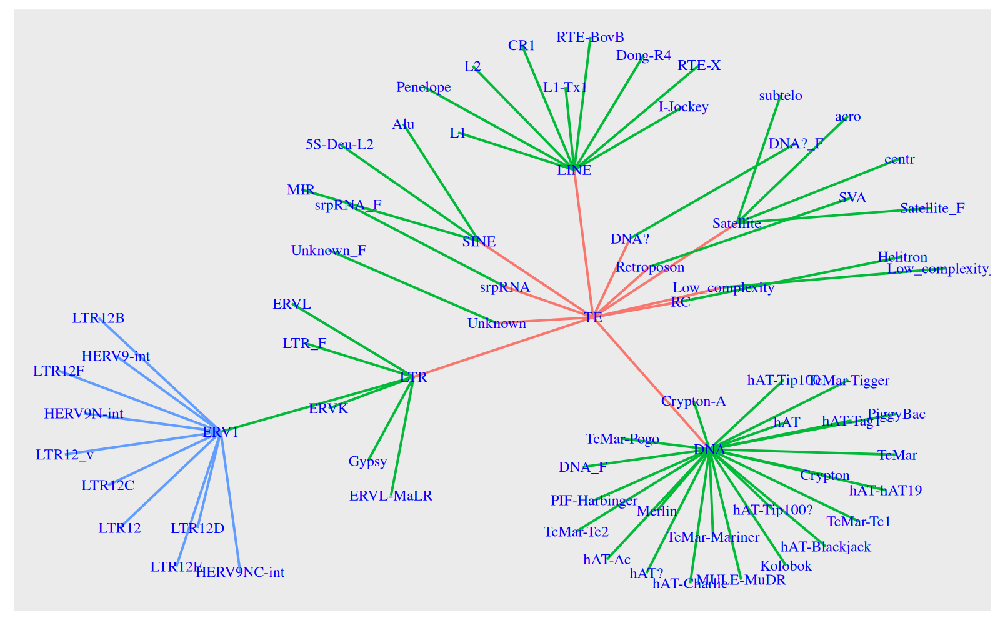

In [192]:
plotdat0 = graph_dt[lvl %in% c('lvl1', 'lvl2'), ] 
plotdat1 = graph_dt[grepl('HERV9', to) & lvl == 'lvl3', ] 
plotdat2 = graph_dt[grepl('LTR12', to) & lvl == 'lvl3', ] 
plotdat = rbind(plotdat0, plotdat1, plotdat2)
plotdat = as_tbl_graph(plotdat)

options(repr.plot.width = 8, repr.plot.height = 5, repr.plot.res = 200)
ggraph(plotdat, layout = 'stress') +  geom_edge_link(aes(colour = factor(lvl))) +  #geom_node_point() + 
  geom_node_text(aes(label = name),  colour = 'blue', size=3, show.legend = FALSE, family = "serif") + theme(legend.position = "none")


## tree plot for CMP vs HSC

In [21]:
head(deg_MEPCMP)

.id,rn,logFC,logCPM,PValue,FDR,batch,target,class_id,family_id,gene_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
deg_MEP_EB,Ricksha_c:MULE-MuDR:DNA,1.794502,9.671313,3.537422e-15,3.855790e-12,MEP,EB,DNA,MULE-MuDR,Ricksha_c
deg_MEP_EB,MER4-int:ERV1:LTR,-1.552194,10.178204,8.196779e-12,4.467245e-09,MEP,EB,LTR,ERV1,MER4-int
deg_MEP_EB,HERV1_I:ERV1:LTR,4.016606,8.909953,1.601935e-11,5.820362e-09,MEP,EB,LTR,ERV1,HERV1_I
deg_MEP_EB,MER1B:hAT-Charlie:DNA,1.311878,11.324185,1.354780e-10,3.691776e-08,MEP,EB,DNA,hAT-Charlie,MER1B
deg_MEP_EB,MER92C:ERV1:LTR,-6.102215,4.219076,1.113748e-09,2.011836e-07,MEP,EB,LTR,ERV1,MER92C
deg_MEP_EB,MER31-int:ERV1:LTR,-1.827139,9.028825,1.243251e-09,2.011836e-07,MEP,EB,LTR,ERV1,MER31-int


In [ ]:
te_sel = deg_MEPCMP[batch == 'CMP' & target == 'HSC' & FDR < 0.05 & logFC > 1 & class_id == 'LINE', ]
plotdat0 = graph_dt[lvl %in% c('lvl2') & from %in% te_sel$class_id, ] 
plotdat1 = graph_dt[lvl %in% c('lvl3') & from %in% te_sel$family_id, ] 
plotdat2 = graph_dt[lvl %in% c('lvl4') & from %in% te_sel$gene_id, ] 
plotdat = rbind(plotdat0, plotdat1, plotdat2)
head(plotdat)
#plotdat = as_tbl_graph(plotdat)


In [ ]:
options(repr.plot.width = 8, repr.plot.height = 5, repr.plot.res = 200)
ggraph(plotdat, layout = 'stress') +  geom_edge_link(aes(colour = factor(lvl))) +  #geom_node_point() + 
  geom_node_text(aes(label = name),  colour = 'blue', size=3, show.legend = FALSE, family = "serif") + theme(legend.position = "none")


In [ ]:
plotdat0 = graph_dt[from == 'LINE' & lvl %in% c('lvl2', 'lvl3'), ] 
plotdat1 = graph_dt[grepl('HERV9', to) & lvl == 'lvl3', ] 
plotdat2 = graph_dt[grepl('LTR12', to) & lvl == 'lvl3', ] 
plotdat = rbind(plotdat0, plotdat1, plotdat2)
plotdat = as_tbl_graph(plotdat)

options(repr.plot.width = 8, repr.plot.height = 5, repr.plot.res = 200)
ggraph(plotdat, layout = 'stress') +  geom_edge_link(aes(colour = factor(lvl))) +  #geom_node_point() + 
  geom_node_text(aes(label = name),  colour = 'blue', size=3, show.legend = FALSE, family = "serif") + theme(legend.position = "none")


# BCAT in HSPC

In [14]:
genes = c('BCAT1', 'BCAT2', 'SLC7A8', 'BCKDK')
genes = c('BCAT1', 'BCAT2', 'SLC7A8')


rn,BCAT1,BCAT2,SLC7A8,cell_type
<chr>,<dbl>,<dbl>,<dbl>,<fct>
CLP1,5.101753,3.517052,1.5381969,CLP
CLP3,5.090762,2.128723,0.3149615,CLP
CMP1,5.424535,4.072155,2.5423603,CMP
CMP2,5.884538,4.104046,3.1154551,CMP
CMP3,4.958027,4.062217,2.9162621,CMP
EB1,5.923482,3.894558,0.3836219,EB


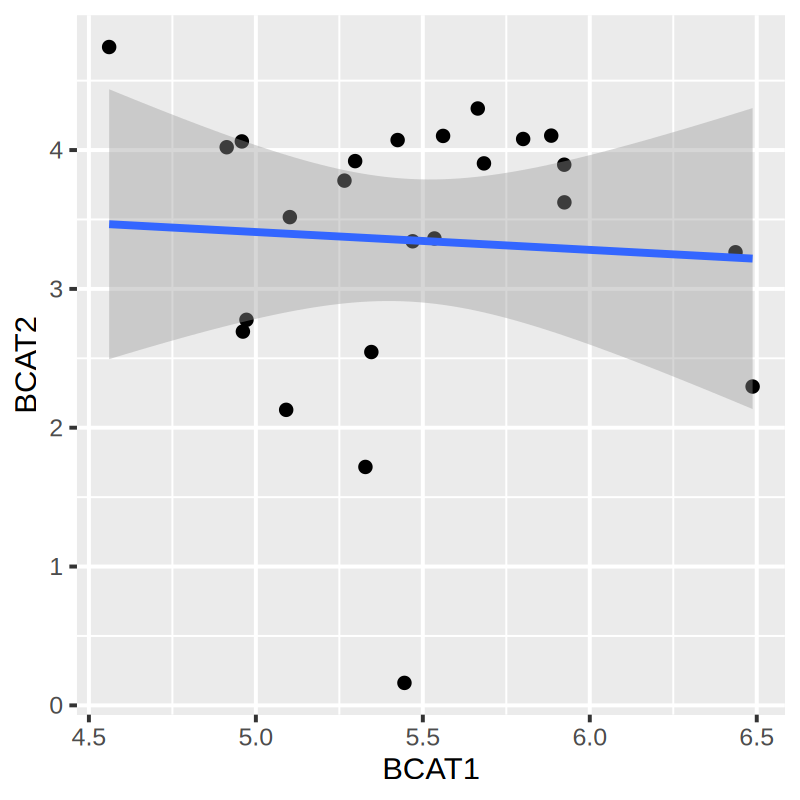

In [15]:
plotdat = as.data.table(t(logcpm_coding[genes, ]), keep.rownames = T)
plotdat[, cell_type := sub('\\d+', '', rn)]
plotdat[, cell_type := factor(cell_type, levels = cell_types)] 
plotdat = plotdat[rn != 'CLP2', ]
head(plotdat)

ggplot(plotdat, aes(BCAT1, BCAT2)) + geom_point() + stat_smooth(method = "lm",  formula = y ~ x,  geom = "smooth") 


In [20]:
plotdat = as.data.table(t(logcpm_coding[genes, ]), keep.rownames = T)
plotdat[, cell_type := sub('\\d+', '', rn)]
plotdat[, cell_type := factor(cell_type, levels = cell_types)] 
plotdat = plotdat[rn != 'CLP2', ]
plotdat = melt(plotdat)
setnames(plotdat, c('sample_name', 'cell_type', 'gene_name', 'expression'))

head(plotdat)

Warning message in melt.data.table(plotdat):
"id.vars and measure.vars are internally guessed when both are 'NULL'. All non-numeric/integer/logical type columns are considered id.vars, which in this case are columns [rn, cell_type, ...]. Consider providing at least one of 'id' or 'measure' vars in future."


sample_name,cell_type,gene_name,expression
<chr>,<fct>,<fct>,<dbl>
CLP1,CLP,BCAT1,5.101753
CLP3,CLP,BCAT1,5.090762
CMP1,CMP,BCAT1,5.424535
CMP2,CMP,BCAT1,5.884538
CMP3,CMP,BCAT1,4.958027
EB1,EB,BCAT1,5.923482


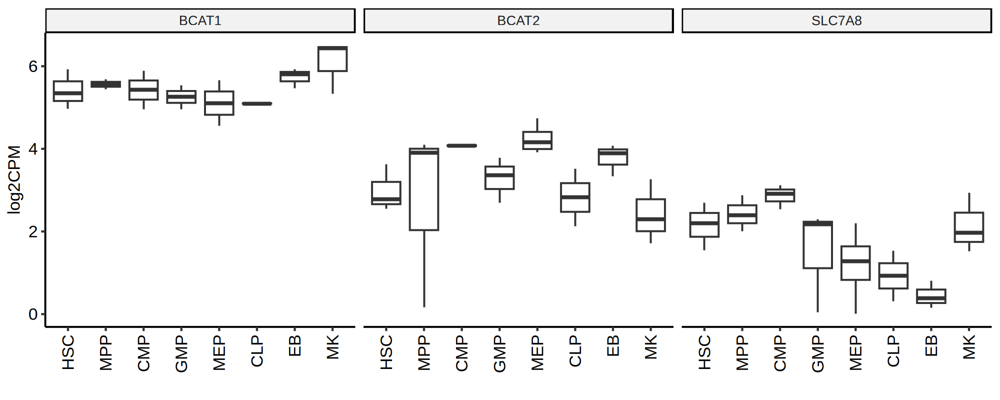

In [21]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(cell_type, expression)) + geom_boxplot(outlier.colour = NA) + 
facet_wrap(~ gene_name, ncol = 4) + theme_pubr() + xlab('') + ylab('log2CPM') +
theme(axis.text.x = element_text(angle = 90, vjust = .5, hjust = 1))


,BCAT1,BCAT2,SLC7A8
BCAT1,1.0000000,-0.1797741,0.2846963
BCAT2,-0.1797741,1.0000000,-0.1216906
SLC7A8,0.2846963,-0.1216906,1.0000000


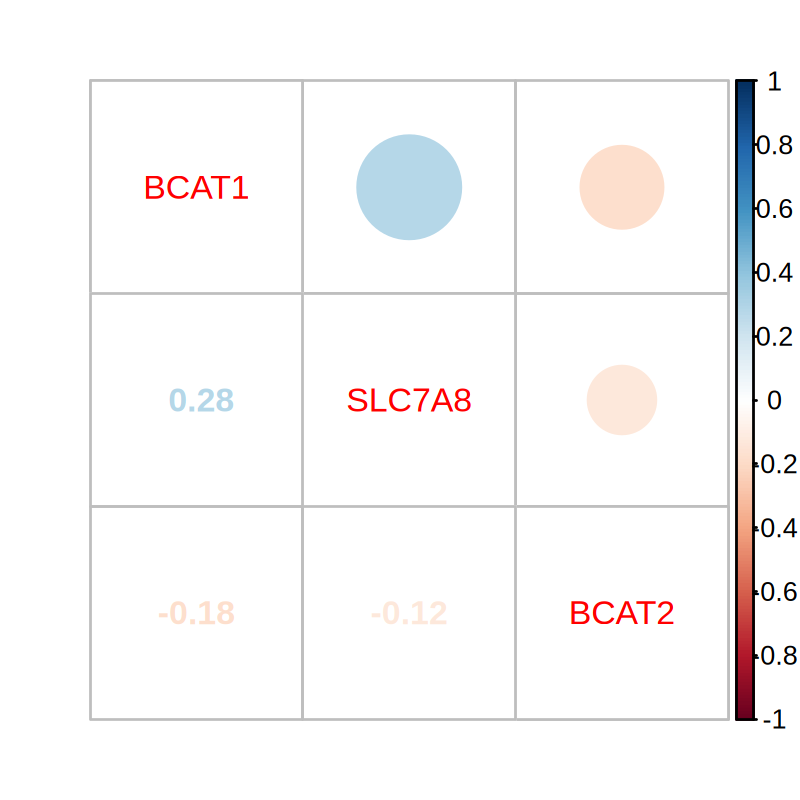

In [22]:
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 200)
plotdat = as.data.table(t(logcpm_coding[genes, ]), keep.rownames = F)
plotdat = cor(plotdat)
head(plotdat)
#corrplot(plotdat, method = 'ellipse') # colorful number
corrplot.mixed(plotdat, order = 'AOE')


In [45]:
plotdat = as.data.frame(t(logcpm_coding[genes, ]))
plotdat = as.data.table(plotdat, keep.rownames = T)
plotdat[, cell_type := sub('\\d+', '', rn) ]
head(tmp2)


rn,BCAT1,BCAT2,SLC7A8,cell_type
<chr>,<dbl>,<dbl>,<dbl>,<chr>
CLP1,5.101753,3.517052,1.5381969,CLP
CLP2,3.016596,4.331236,0.0000000,CLP
CLP3,5.090762,2.128723,0.3149615,CLP
CMP1,5.424535,4.072155,2.5423603,CMP
CMP2,5.884538,4.104046,3.1154551,CMP
CMP3,4.958027,4.062217,2.9162621,CMP


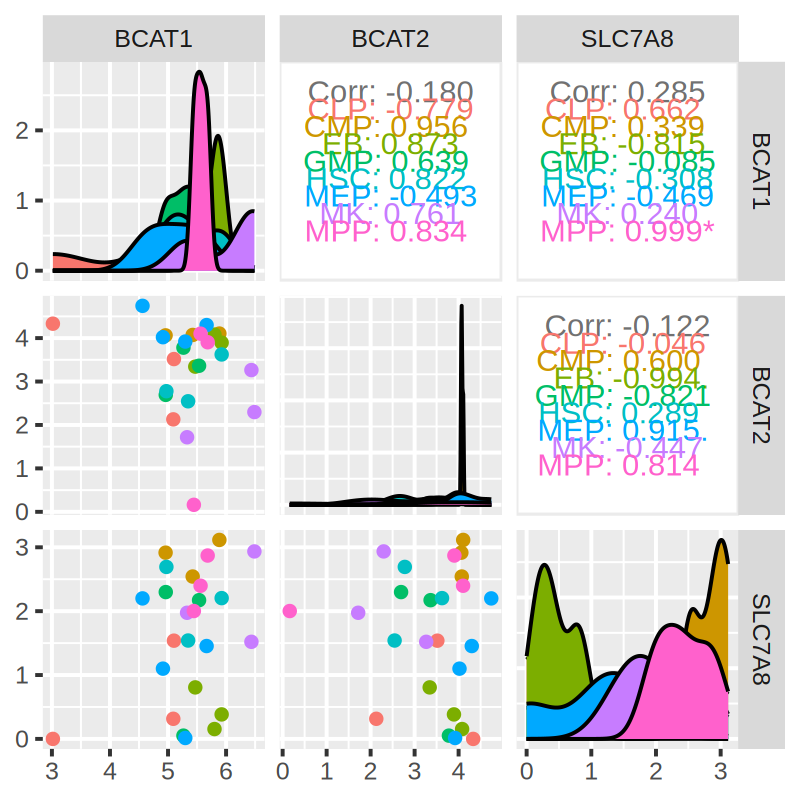

In [46]:
ggpairs(plotdat, columns = 2:4, aes(color = cell_type))


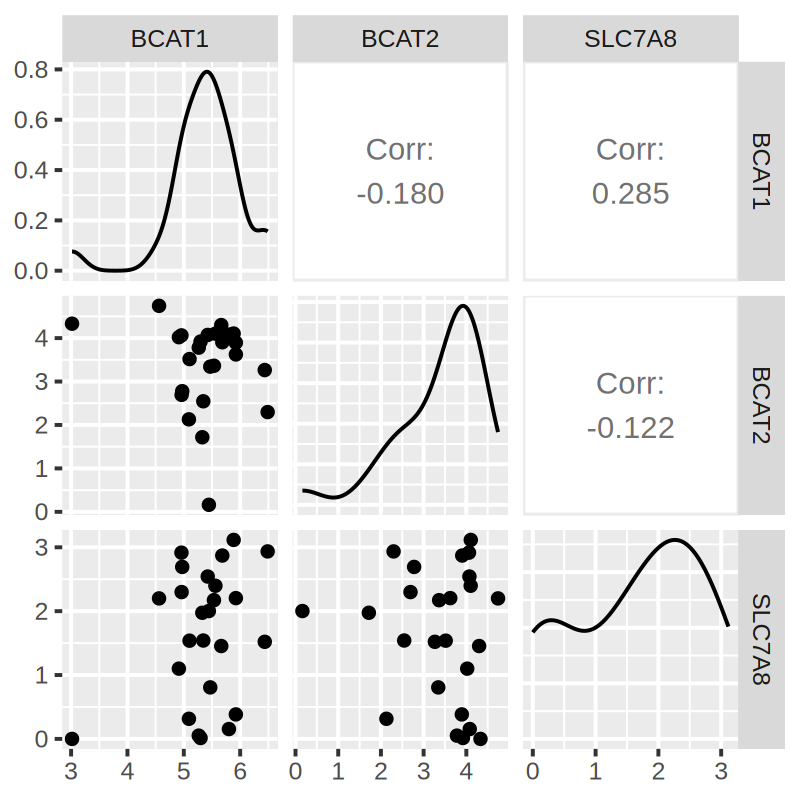

In [48]:
ggpairs(plotdat, columns = 2:4)


# plot along the chromosome

In [925]:
library(OmicCircos)

In [ ]:
data ("UCSC.mm10.chr" , package="OmicCircos") ;
UCSC.mm10.chr

In [932]:
chrom_size_file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/genomes/t2t/t2t_sizes_genome'
chrom_size = fread(chrom_size_file)
chrom_size = chrom_size[chrom != 'chrM', ]
setnames(chrom_size, c('chrom', 'chrom_len'))
chrom_size[, start := cumsum(c(1, chrom_size$chrom_len[1:(nrow(chrom_size) - 1)]))] 
chrom_size[, end := cumsum( chrom_len )]
chrom_size


Warning message in eval(jsub, SDenv, parent.frame()):
"integer overflow in 'cumsum'; use 'cumsum(as.numeric(.))'"


chrom,chrom_len,start,end
<chr>,<int>,<dbl>,<int>
chr1,248387328,1,248387328
chr2,242696752,248387329,491084080
chr3,201105948,491084081,692190028
chr4,193574945,692190029,885764973
chr5,182045439,885764974,1067810412
chr6,172126628,1067810413,1239937040
chr7,160567428,1239937041,1400504468
chrX,154259566,1400504469,1554764034
chr9,150617247,1554764035,1705381281


# backup code 

In [ ]:
mm = rep(-1, length(cell_types))
deg_list = lapply(1:length(mm), function(ii){
    mm_ii = mm
    mm_ii[ii] = 1
    deg = glmQLFTest(fit, contrast = mm_ii) 
    deg = topTags(deg, n = nrow(fit$counts))
    as.data.table(deg$table, keep.rownames = T)

})


In [ ]:
names(deg_list) = cell_types
deg_dt = rbindlist(deg_list, idcol = T)
head(deg_dt)


In [304]:
deg = as.data.table(deg$table, keep.rownames = T)


In [281]:
cell_type_deg_list = lapply(cell_types, function(cc) {
    dsn_all_df$ctype = 'Other'
    dsn_all_df$ctype[dsn_all_df$cell_type == cc] = cc
    dsn_all_df$ctype = factor(dsn_all_df$ctype, levels = c('Other', cc))

    subtype = factor(dsn_all_df$ctype)
    subtype = relevel(subtype, ref = 'Other')

    dge = DGEList(counts=mtx_all_df, group = subtype)
    dge <- calcNormFactors(dge)

    keep = filterByExpr(dge)
    dge = dge[keep, , keep.lib.sizes=FALSE]
    dge = normLibSizes(dge)
    design = model.matrix( ~ 0 + subtype)
    dge = estimateDisp(dge, design)
    et <- exactTest(dge)
    deg = topTags(et, n = length(keep))
    as.data.table(deg$table, keep.rownames = T)
})


In [282]:
names(cell_type_deg_list) = cell_types
cell_type_deg_dt = rbindlist(cell_type_deg_list, idcol = T)
head(cell_type_deg_dt)


.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
CLP,LOC729732,7.099587,2.520014,8.771559e-15,3.578270e-10
CLP,RPL9P32,5.824768,1.811781,1.850210e-13,3.773874e-09
CLP,JCHAIN,7.466197,8.304650,4.735865e-13,6.439830e-09
CLP,ACAD8,-10.188906,4.046673,2.783873e-12,2.839133e-08
CLP,TP53INP1,3.710188,7.483967,4.106388e-12,3.350320e-08
CLP,DNTT,8.111659,7.080440,4.185078e-11,2.845434e-07


In [277]:
(cell_type_deg_dt)


<0 x 0 matrix>

In [271]:
cell_types

[1] "CLP" "CMP" "EB"  "GMP" "HSC" "MEP" "MK"  "MPP"

In [272]:
dim(cell_type_deg_dt[.id == 'MEP' & abs(logFC) > 1 & FDR < 0.05, ])

[1] 38365     7

In [250]:
summary(cell_type_deg_dt[.id == 'MEP' & abs(logFC) > 1 & FDR < 0.05, logFC])


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-29.848 -29.848 -21.944 -22.595 -17.030  -5.269 

In [235]:
deg_sig = cell_type_deg_dt[abs(logFC) > 1 & FDR < 0.05, ]
length(unique(deg_sig[, rn]))


[1] 40794

In [236]:
head(deg_sig$rn)

[1] "AMD1"   "HADHB"  "FTO"    "STARD7" "SEC31A" "CFLAR"

In [ ]:
lapply(all_samples

In [ ]:
my.contrasts = makeContrasts(MNX1vsCD34=MNX1 - CD34, MNX1vsAML=MNX1 - Others, AMLvsCD34 = Others - CD34, levels=design)
MNX1vsCD34 = glmQLFTest(fit, contrast=my.contrasts[,"MNX1vsCD34"])
MNX1vsCD34 = topTags(MNX1vsCD34, n=nrow(MNX1vsCD34$table), adjust.method="fdr")

MNX1vsAML = glmQLFTest(fit, contrast=my.contrasts[,"MNX1vsAML"])
MNX1vsAML = topTags(MNX1vsAML, n=nrow(MNX1vsAML$table), adjust.method="fdr")

AMLvsCD34 = glmQLFTest(fit, contrast=my.contrasts[,"AMLvsCD34"])
AMLvsCD34 = topTags(AMLvsCD34, n=nrow(AMLvsCD34$table), adjust.method="fdr")


## maSigPro

In [218]:
#Time	Replicate	Control	ME	MX	MX_ME
head(dsn_all)


sample_name,cell_type
<chr>,<chr>
CLP1,CLP
CLP2,CLP
CLP3,CLP
CMP1,CMP
CMP2,CMP
CMP3,CMP


In [265]:
dsn_time = copy(dsn_all) 
dsn_time[, cell_type := as.integer(factor(cell_type, levels = cell_types)) ] 
dsn_time[, Time := as.integer(cell_type)] 
#dsn_time[, Replicate := as.integer(sub('(\\d+)', '', sample_name))] 
#dsn_time[, Replicate := sub('(\\d+)', '\1', sample_name)] 
dsn_time[grep('1', sample_name), Replicate := 1]
dsn_time[grep('2', sample_name), Replicate := 2]
dsn_time[grep('3', sample_name), Replicate := 3]
dsn_time[, HSC := as.integer(dsn_time$cell_type == 'HSC')]
dsn_time[, MPP := as.integer(dsn_time$cell_type == 'MPP')]
dsn_time[, CLP := as.integer(dsn_time$cell_type == 'CLP')]
dsn_time[, MEP := as.integer(dsn_time$cell_type == 'MEP')]
dsn_time[, CMP := as.integer(dsn_time$cell_type == 'CMP')]
dsn_time[, GMP := as.integer(dsn_time$cell_type == 'GMP')]
dsn_time[, EB := as.integer(dsn_time$cell_type == 'EB')]
dsn_time[, MK := as.integer(dsn_time$cell_type == 'MK')]
dsn_time_df = setDF(dsn_time[, 3:ncol(dsn_time)], rownames = dsn_time$sample_name) 
head(dsn_time_df) 


,Time,Replicate,HSC,MPP,CLP,MEP,CMP,GMP,EB,MK
,<int>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
CLP1,6,1,0,0,0,0,0,0,0,0
CLP2,6,2,0,0,0,0,0,0,0,0
CLP3,6,3,0,0,0,0,0,0,0,0
CMP1,3,1,0,0,0,0,0,0,0,0
CMP2,3,2,0,0,0,0,0,0,0,0
CMP3,3,3,0,0,0,0,0,0,0,0


In [ ]:
design = make.design.matrix(dsn_time_df, degree = 2)
fit <- p.vector(mtx_coding_df, design, Q = 0.3, MT.adjust = "BH", min.obs = 20)
tstep <- T.fit(fit, step.method = "backward", alfa = 0.05)
sigs <- get.siggenes(tstep, rsq = 0.6, vars = "groups")


In [276]:
names(sigs$sig.genes) 

[1] "HSC"      "MPPvsHSC" "CLPvsHSC" "MEPvsHSC" "CMPvsHSC" "GMPvsHSC" "EBvsHSC" 
[8] "MKvsHSC"

In [277]:
sigs_see = see.genes(sigs$sig.genes$MPPvsHSC, show.fit = T, dis = design$dis, cluster.method = "hclust" ,cluster.data = 1, k = 4)
head(sigs_see) 


[1] "warning: NULL data. No visualization possible"


,HSC,MPP,CLP,MEP,CMP,GMP,EB,MK
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
CLP1,0,0,0,0,0,0,0,0
CLP2,0,0,0,0,0,0,0,0
CLP3,0,0,0,0,0,0,0,0
CMP1,0,0,0,0,0,0,0,0
CMP2,0,0,0,0,0,0,0,0
CMP3,0,0,0,0,0,0,0,0
EB1,0,0,0,0,0,0,0,0
EB2,0,0,0,0,0,0,0,0
EB3,0,0,0,0,0,0,0,0


## using Seurat 

In [205]:
oo <- CreateSeuratObject(counts = mtx_all_df, project = "blue", min.cells = 3, min.features = 200)


Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Data is of class data.frame. Coercing to dgCMatrix."


In [206]:
oo

An object of class Seurat 
48581 features across 25 samples within 1 assay 
Active assay: RNA (48581 features, 0 variable features)
 1 layer present: counts

In [211]:
oo[["percent.mt"]] <- PercentageFeatureSet(oo, pattern = "^MT-")


Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"The following requested variables were not found: percent.mt"


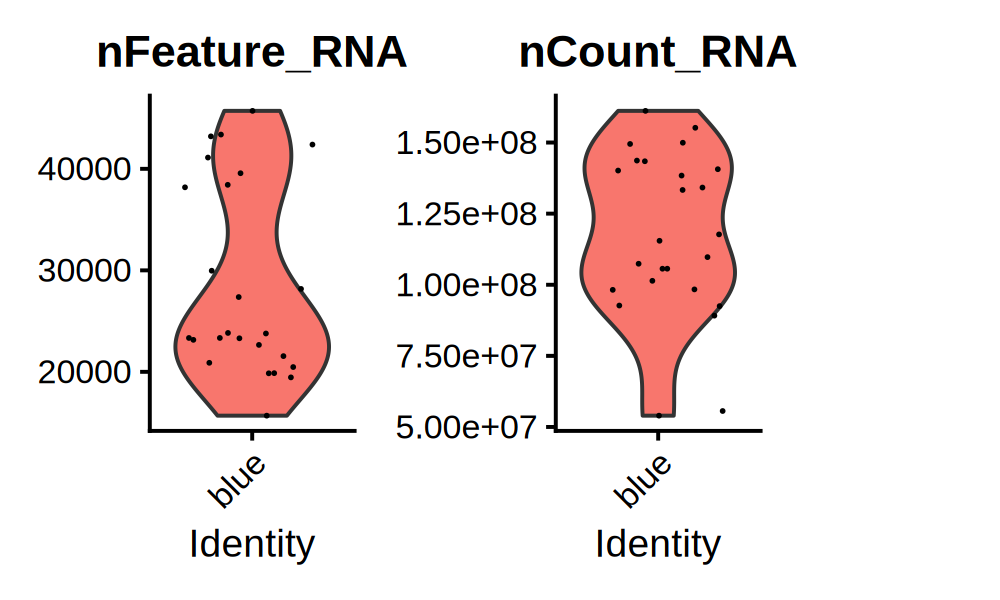

In [208]:
VlnPlot(oo, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)


Warning message in cor(x = data[, 1], y = data[, 2]):
"the standard deviation is zero"


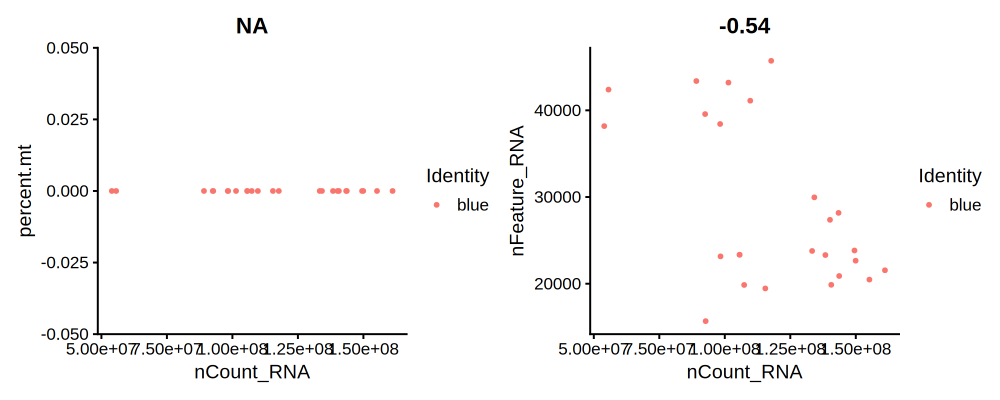

In [214]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
plot1 <- FeatureScatter(oo, feature1 = "nCount_RNA", feature2 = "percent.mt")
plot2 <- FeatureScatter(oo, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot1 + plot2


In [216]:
oo <- NormalizeData(oo, normalization.method = "LogNormalize", scale.factor = 10000)


Normalizing layer: counts



Finding variable features for layer counts

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
"ggrepel: 8 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


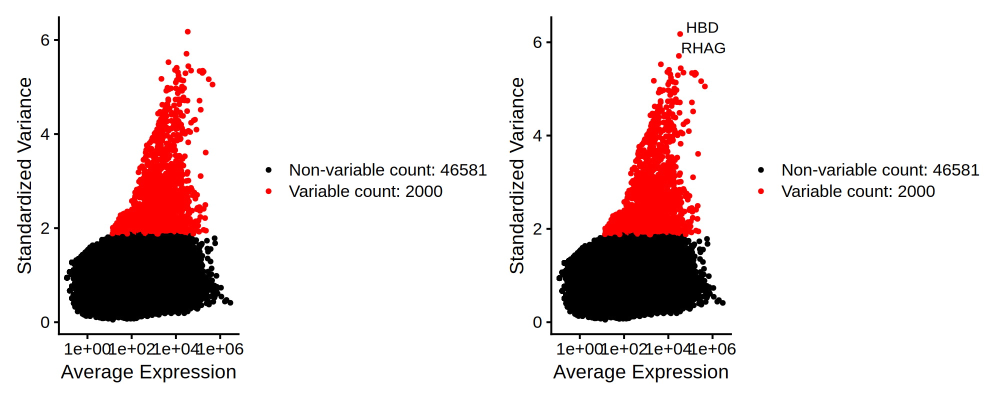

In [217]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
oo <- FindVariableFeatures(oo, selection.method = "vst", nfeatures = 2000)

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(oo), 10)

# plot variable features with and without labels
plot1 <- VariableFeaturePlot(oo)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
plot1 + plot2


In [218]:
all.genes <- rownames(oo)
oo <- ScaleData(oo, features = all.genes)

Centering and scaling data matrix



In [ ]:
my.contrasts = makeContrasts(MNX1vsCD34=MNX1 - CD34, MNX1vsAML=MNX1 - Others, AMLvsCD34 = Others - CD34, levels=design)
MNX1vsCD34 = glmQLFTest(fit, contrast=my.contrasts[,"MNX1vsCD34"])
MNX1vsCD34 = topTags(MNX1vsCD34, n=nrow(MNX1vsCD34$table), adjust.method="fdr")
